# Exploring the Role of Data Analytics in Combating Future Pandemics: Lessons Learned from the COVID-19 Pandemic in the United Kingdom
By Stewart Charles Fisher II - ID: 25020928

Start Date: 05/12/2022

End Date: 

## Table of Contents

- [Import Libraries](#Import-Libraries)
- [Data Preparation](#Data-Preparation)
    - [Male Cases Dataset](#Preparation-of-the-data-from-the-'maleCases'-dataset)
    - [Female Cases Dataset](#Preparation-of-the-data-from-the-'femaleCases'-dataset)
    - [General Cases Dataset](#Preparation-of-the-data-from-the-'generalCases'-dataset)
    - [General Deaths Dataset](#Preparation-of-the-data-from-the-'generalDeaths'-dataset)
    - [Vaccinations Dataset](#Preparation-of-the-data-from-the-'vaccinationDemographics'-dataset)
    - [Reinfections Dataset](#Preparation-of-the-data-from-the-'reinfections'-dataset)
    - [Variants Dataset](#Preparation-of-the-data-from-the-'variants'-dataset)
- [Statistical Data Analysis](#Statistical-Data-Analysis)
    - [Male Cases](#Male-Cases-Data-Analysis)
        - [Regional Distribution](#Regional-Distribution-of-Male-Cases)
        - [Age Distribution](#Age-Distribution-of-Male-Cases)
        - [Regional Proportion](#Regional-Proportion-of-Male-Cases)
        - [Age Proportion](#Age-Proportion-of-Male-Cases)
    - [Female Cases](#Female-Cases-Data-Analysis)
        - [Regional Distribution](#Regional-Distribution-of-Female-Cases)
        - [Age Distribution](#Age-Distribution-of-Female-Cases)
        - [Regional Proportion](#Regional-Proportion-of-Female-Cases)
        - [Age Proportion](#Age-Proportion-of-Female-Cases)
    - [General Cases](#General-Cases-Data-Analysis)
        - [Regional Distribution](#Regional-Distribution-of-General-Cases)
        - [Regional Proportion](#Regional-Proportion-of-General-Cases)
    - [General Deaths](#General-Deaths-Data-Analysis)
        - [Regional Distribution](#Regional-Distribution-of-General-Deaths)
        - [Regional Proportion](#Regional-Proportion-of-General-Deaths)
    - [Vaccinations](#Vaccinations-Data-Analysis)
        - [Regional Distribution](#Regional-Distribution-of-Vaccinations)
        - [Age Distribution](#Age-Distribution-of-Vaccinations)
        - [Regional Proportion](#Regional-Proportion-of-Vaccinations)
        - [Age Proportion](#Age-Proportion-of-Vaccinations)
    - [Reinfections](#Reinfections-Data-Analysis)
        - [Regional Distribution](#Regional-Distribution-of-Reinfections)
        - [Age Distribution](#Age-Distribution-of-Reinfections)
        - [Regional Proportion](#Regional-Proportion-of-Reinfections)
        - [Age Proportion](#Age-Proportion-of-Reinfections)
    - [Variants](#Variants-Data-Analysis)
        - [Variant Distribution](#Variant-Distribution)
        - [Variant Proportion](#Variant-Proportion)
- [Regression Model Analysis](#Regression-Model-Analysis)
    - [Model Evaluation](#Model-Evaluation)
    - [The Impact of Sex on COVID-19 Cases](#The-Impact-of-Sex-on-COVID-19-Cases)
    - [The Impact of Variants on COVID-19 Cases and Deaths](#The-Impact-of-Variants-on-COVID-19-Cases-and-Deaths)
    - [The Impact of Vaccinations on COVID-19 Cases and Deaths](#The-Impact-of-Vaccinations-on-COVID-19-Cases-and-Deaths)

## Import Libraries

In [498]:
from pyspark.ml import Pipeline
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml.classification import LinearSVC
from pyspark.ml.classification import MultilayerPerceptronClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.feature import StringIndexer
from pyspark.ml.feature import VectorAssembler
from pyspark.sql.functions import col, isnan, when, count
from pyspark.ml.stat import Correlation
from scipy import stats
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Ridge
from sklearn.metrics import confusion_matrix
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error 
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
import matplotlib.pyplot as plt
import pandas as pd
import pyspark.pandas as ps
import numpy as np
import seaborn as sn

## Global Variables

In [499]:
randomSeed = 42

#### Import PySpark and initialise a SparkSession.

In [500]:
import findspark
findspark.init()

from pyspark.sql.functions import *
from pyspark.sql import SparkSession
spark = SparkSession.builder.getOrCreate()

## Data Preparation

During this stage, the data shall be prepared. This means that all of the datasets shall be read into DataFrames and then cleaned to remove any unneccesary data. There shouldn't be any errors in the data due to the standard that the UK Government will have when collecting this data; that being said, there is always the possibility of erroneous data entries and the data should still be checked regardless.

### Data Preparation Functions

#### Add Zero Prefix

In [501]:
def zeroPrefix(x):
    if "_to_" in x:
        x_range = x.split("_to_")
        x_start = int(x_range[0])
        x_end = int(x_range[1])
        x_start = "0" + str(x_start) if x_start < 10 else str(x_start)
        x_end = "0" + str(x_end) if x_end < 10 else str(x_end)
        return x_start + "_to_" + x_end
    elif "+" in x:
        x = int(x.split("+")[0])
        x = "0" + str(x) if x < 10 else str(x)
        return x + "+"
    else:
        x = int(x)
        x = "0" + str(x) if x < 10 else str(x)
        return x

### Preparation of the data from the 'maleCases' dataset

#### Reading in data from the 'maleCases' dataset

In [502]:
# Read in a csv file to a pandas DataFrame
maleCases = pd.read_csv("maleCases_2022-12-22.csv")

# Output DataFrame
maleCases

,areaCode,areaName,areaType,date,age,rate,value
0,E12000001,North East,region,2022-12-21,50_to_54,35905.1,31902
1,E12000001,North East,region,2022-12-21,25_to_29,40561.1,37313
2,E12000001,North East,region,2022-12-21,70_to_74,20208.2,14266
3,E12000001,North East,region,2022-12-21,35_to_39,44401.5,35055
4,E12000001,North East,region,2022-12-21,30_to_34,43718.0,37350
...,...,...,...,...,...,...,...
176049,E12000009,South West,region,2020-02-03,45_to_49,0.6,1
176050,E12000009,South West,region,2020-02-03,40_to_44,0.0,0
176051,E12000009,South West,region,2020-02-03,50_to_54,0.0,0
176052,E12000009,South West,region,2020-02-03,25_to_29,0.0,0


#### Reformatting the DataFrame

In [503]:
# Create a new DataFrame without redundant columns or missing values, and with renamed columns
maleCases1 = maleCases.drop(columns = ["areaType"]).dropna().rename(columns = {"areaCode": "Region Code", "areaName": "Region", "date": "Date", "age": "Age", "rate": "Rate", "value": "Cases"})

# Convert the date column to a datetime format
maleCases1["Date"] = pd.to_datetime(maleCases1["Date"])

# Output DataFrame
maleCases1

,Region Code,Region,Date,Age,Rate,Cases
0,E12000001,North East,2022-12-21,50_to_54,35905.1,31902
1,E12000001,North East,2022-12-21,25_to_29,40561.1,37313
2,E12000001,North East,2022-12-21,70_to_74,20208.2,14266
3,E12000001,North East,2022-12-21,35_to_39,44401.5,35055
4,E12000001,North East,2022-12-21,30_to_34,43718.0,37350
...,...,...,...,...,...,...
176049,E12000009,South West,2020-02-03,45_to_49,0.6,1
176050,E12000009,South West,2020-02-03,40_to_44,0.0,0
176051,E12000009,South West,2020-02-03,50_to_54,0.0,0
176052,E12000009,South West,2020-02-03,25_to_29,0.0,0


#### Getting a list of the unique values in the age column

In [504]:
# Create an array of unique values in the age column
maleCases2 = maleCases1["Age"].unique()

# Output array
print(sorted(maleCases2))

['0_to_4', '10_to_14', '15_to_19', '20_to_24', '25_to_29', '30_to_34', '35_to_39', '40_to_44', '45_to_49', '50_to_54', '55_to_59', '5_to_9', '60_to_64', '65_to_69', '70_to_74', '75_to_79', '80_to_84', '85_to_89', '90+']


#### Cleaning the format of the ages to be more readable

In [505]:
# Add zero prefix
maleCases1["Age"] = maleCases1["Age"].apply(zeroPrefix)

# Replace underscores with spaces
maleCases1["Age"] = maleCases1["Age"].str.replace('_', ' ')

#### Counting the number of unique age ranges in the 'maleCases' dataset

In [506]:
# Output the number of unique age ranges
print(len(maleCases2))

19


#### Getting a list of the regions

In [507]:
# Create an array of unique values in the region column
maleCases3 = maleCases1["Region"].unique()

# Output array
print(sorted(maleCases3))

['East Midlands', 'East of England', 'London', 'North East', 'North West', 'South East', 'South West', 'West Midlands', 'Yorkshire and The Humber']


### Preparation of the data from the 'femaleCases' dataset

#### Reading in data from the 'femaleCases' dataset

In [508]:
# Read in a csv file to a pandas DataFrame
femaleCases = pd.read_csv("femaleCases_2022-12-22.csv")

# Output DataFrame
femaleCases

,areaCode,areaName,areaType,date,age,rate,value
0,E12000001,North East,region,2022-12-21,60_to_64,32205.5,28535
1,E12000001,North East,region,2022-12-21,80_to_84,19641.2,8298
2,E12000001,North East,region,2022-12-21,70_to_74,18422.4,14169
3,E12000001,North East,region,2022-12-21,65_to_69,23082.1,17749
4,E12000001,North East,region,2022-12-21,40_to_44,60056.6,45434
...,...,...,...,...,...,...,...
176049,E12000009,South West,region,2020-02-03,15_to_19,0.7,1
176050,E12000009,South West,region,2020-02-03,45_to_49,0.0,0
176051,E12000009,South West,region,2020-02-03,50_to_54,0.5,1
176052,E12000009,South West,region,2020-02-03,75_to_79,0.0,0


#### Reformatting the DataFrame

In [509]:
# Create a new DataFrame without redundant columns or missing values, and with renamed columns
femaleCases1 = femaleCases.drop(columns = ["areaType"]).dropna().rename(columns = {"areaCode": "Region Code", "areaName": "Region", "date": "Date", "age": "Age", "rate": "Rate", "value": "Cases"})

# Convert the date column to a datetime format
femaleCases1["Date"] = pd.to_datetime(femaleCases1["Date"])

# Output DataFrame
femaleCases1

,Region Code,Region,Date,Age,Rate,Cases
0,E12000001,North East,2022-12-21,60_to_64,32205.5,28535
1,E12000001,North East,2022-12-21,80_to_84,19641.2,8298
2,E12000001,North East,2022-12-21,70_to_74,18422.4,14169
3,E12000001,North East,2022-12-21,65_to_69,23082.1,17749
4,E12000001,North East,2022-12-21,40_to_44,60056.6,45434
...,...,...,...,...,...,...
176049,E12000009,South West,2020-02-03,15_to_19,0.7,1
176050,E12000009,South West,2020-02-03,45_to_49,0.0,0
176051,E12000009,South West,2020-02-03,50_to_54,0.5,1
176052,E12000009,South West,2020-02-03,75_to_79,0.0,0


#### Getting a list of the unique values in the age column

In [510]:
# Create an array of unique values in the age column
femaleCases2 = femaleCases1["Age"].unique()

# Output array
print(sorted(femaleCases2))

['0_to_4', '10_to_14', '15_to_19', '20_to_24', '25_to_29', '30_to_34', '35_to_39', '40_to_44', '45_to_49', '50_to_54', '55_to_59', '5_to_9', '60_to_64', '65_to_69', '70_to_74', '75_to_79', '80_to_84', '85_to_89', '90+']


#### Cleaning the format of the ages to be more readable

In [511]:
# Add zero prefix
femaleCases1["Age"] = femaleCases1["Age"].apply(zeroPrefix)

# Replace underscores with spaces
femaleCases1["Age"] = femaleCases1["Age"].str.replace('_', ' ')

#### Counting the number of unique age ranges in the 'femaleCases' dataset

In [512]:
# Output the number of unique age ranges
print(len(femaleCases2))

19


#### Getting a list of the regions

In [513]:
# Create an array of unique values in the region column
femaleCases3 = femaleCases1["Region"].unique()

# Output array
print(sorted(femaleCases3))

['East Midlands', 'East of England', 'London', 'North East', 'North West', 'South East', 'South West', 'West Midlands', 'Yorkshire and The Humber']


### Preparation of the data from the 'generalCases' dataset

#### Reading in data from the 'generalCases' dataset

In [514]:
# Read in a csv file to a pandas DataFrame
generalCases = pd.read_csv("generalCases_2022-12-22.csv")

# Output DataFrame
generalCases

,areaCode,areaName,areaType,date,cumCasesByPublishDate
0,E12000001,North East,region,2022-12-22,1026159
1,E12000001,North East,region,2022-12-21,1024631
2,E12000001,North East,region,2022-12-20,1024631
3,E12000001,North East,region,2022-12-19,1024631
4,E12000001,North East,region,2022-12-18,1024631
...,...,...,...,...,...
8815,E12000009,South West,region,2020-04-21,5045
8816,E12000009,South West,region,2020-04-20,4861
8817,E12000009,South West,region,2020-04-19,4669
8818,E12000009,South West,region,2020-04-18,4448


#### Reformatting the DataFrame

In [515]:
# Create a new DataFrame without redundant columns or missing values, and with renamed columns
generalCases1 = generalCases.drop(columns = ["areaType"]).dropna().rename(columns = {"areaCode": "Region Code", "areaName": "Region", "date": "Date", "cumCasesByPublishDate": "Cases"})

# Convert the date column to a datetime format
generalCases1["Date"] = pd.to_datetime(generalCases1["Date"])

# Output DataFrame
generalCases1

,Region Code,Region,Date,Cases
0,E12000001,North East,2022-12-22,1026159
1,E12000001,North East,2022-12-21,1024631
2,E12000001,North East,2022-12-20,1024631
3,E12000001,North East,2022-12-19,1024631
4,E12000001,North East,2022-12-18,1024631
...,...,...,...,...
8815,E12000009,South West,2020-04-21,5045
8816,E12000009,South West,2020-04-20,4861
8817,E12000009,South West,2020-04-19,4669
8818,E12000009,South West,2020-04-18,4448


#### Getting a list of the regions

In [516]:
# Create an array of unique values in the region column
generalCases3 = generalCases1["Region"].unique()

# Output array
print(sorted(generalCases3))

['East Midlands', 'East of England', 'London', 'North East', 'North West', 'South East', 'South West', 'West Midlands', 'Yorkshire and The Humber']


### Preparation of the data from the 'generalDeaths' dataset

#### Reading in data from the 'generalDeaths' dataset

In [517]:
# Read in a csv file to a pandas DataFrame
generalDeaths = pd.read_csv("generalDeaths_2022-12-22.csv")

# Output DataFrame
generalDeaths

,areaCode,areaName,areaType,date,cumDailyNsoDeathsByDeathDate
0,E12000001,North East,region,2022-12-02,9851
1,E12000001,North East,region,2022-12-01,9849
2,E12000001,North East,region,2022-11-30,9847
3,E12000001,North East,region,2022-11-29,9844
4,E12000001,North East,region,2022-11-28,9843
...,...,...,...,...,...
9052,E12000009,South West,region,2020-03-15,3
9053,E12000009,South West,region,2020-03-14,2
9054,E12000009,South West,region,2020-03-13,1
9055,E12000009,South West,region,2020-03-12,1


#### Reformatting the DataFrame

In [518]:
# Create a new DataFrame without redundant columns or missing values, and with renamed columns
generalDeaths1 = generalDeaths.drop(columns = ["areaType"]).dropna().rename(columns = {"areaCode": "Region Code", "areaName": "Region", "date": "Date", "cumDailyNsoDeathsByDeathDate": "Deaths"})

# Convert the date column to a datetime format
generalDeaths1["Date"] = pd.to_datetime(generalDeaths1["Date"])

# Output DataFrame
generalDeaths1

,Region Code,Region,Date,Deaths
0,E12000001,North East,2022-12-02,9851
1,E12000001,North East,2022-12-01,9849
2,E12000001,North East,2022-11-30,9847
3,E12000001,North East,2022-11-29,9844
4,E12000001,North East,2022-11-28,9843
...,...,...,...,...
9052,E12000009,South West,2020-03-15,3
9053,E12000009,South West,2020-03-14,2
9054,E12000009,South West,2020-03-13,1
9055,E12000009,South West,2020-03-12,1


#### Getting a list of the regions

In [519]:
# Create an array of unique values in the region column
generalDeaths3 = generalDeaths1["Region"].unique()

# Output array
print(sorted(generalDeaths3))

['East Midlands', 'East of England', 'London', 'North East', 'North West', 'South East', 'South West', 'West Midlands', 'Yorkshire and The Humber']


### Preparation of the data from the 'vaccinationDemographics' dataset

#### Reading in data from the 'vaccinationDemographics' dataset

In [520]:
# Read in a csv file to a pandas DataFrame
vaccinations = pd.read_csv("vaccinationDemographics_2022-12-22.csv")

# Output DataFrame
vaccinations

,areaCode,areaName,areaType,date,age,VaccineRegisterPopulationByVaccinationDate,cumPeopleVaccinatedCompleteByVaccinationDate,newPeopleVaccinatedCompleteByVaccinationDate,cumPeopleVaccinatedFirstDoseByVaccinationDate,newPeopleVaccinatedFirstDoseByVaccinationDate,cumPeopleVaccinatedSecondDoseByVaccinationDate,newPeopleVaccinatedSecondDoseByVaccinationDate,cumPeopleVaccinatedThirdInjectionByVaccinationDate,newPeopleVaccinatedThirdInjectionByVaccinationDate,cumVaccinationFirstDoseUptakeByVaccinationDatePercentage,cumVaccinationSecondDoseUptakeByVaccinationDatePercentage,cumVaccinationThirdInjectionUptakeByVaccinationDatePercentage,cumVaccinationCompleteCoverageByVaccinationDatePercentage
0,E12000001,North East,region,21/12/2022,05_11,218663,11061.0,9,19816.0,3,11061.0,9,297.0,8,9.1,5.1,0.1,5.1
1,E12000001,North East,region,21/12/2022,12_15,129127,46736.0,4,65585.0,3,46736.0,4,1516.0,4,50.8,36.2,1.2,36.2
2,E12000001,North East,region,21/12/2022,16_17,62028,30945.0,0,41038.0,0,30945.0,0,7644.0,4,66.2,49.9,12.3,49.9
3,E12000001,North East,region,21/12/2022,18_24,242772,163271.0,4,181875.0,5,163271.0,4,99012.0,10,74.9,67.3,40.8,67.3
4,E12000001,North East,region,21/12/2022,25_29,191006,125458.0,0,136069.0,1,125458.0,0,79543.0,2,71.2,65.7,41.6,65.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133915,E12000009,South West,region,08/12/2020,75+,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0.0,0.0,0.0
133916,E12000009,South West,region,08/12/2020,75_79,299195,78.0,1,106.0,2,78.0,1,0.0,0,0.0,0.0,0.0,0.0
133917,E12000009,South West,region,08/12/2020,80_84,183938,17.0,0,43.0,19,17.0,0,0.0,0,0.0,0.0,0.0,0.0
133918,E12000009,South West,region,08/12/2020,85_89,114993,4.0,0,23.0,14,4.0,0,0.0,0,0.0,0.0,0.0,0.0


#### Reformatting the DataFrame

In [521]:
# Create a new DataFrame without redundant columns or missing values, and with renamed columns
vaccinations1 = vaccinations.drop(columns = ["areaType", "cumPeopleVaccinatedCompleteByVaccinationDate", "newPeopleVaccinatedCompleteByVaccinationDate", "cumVaccinationFirstDoseUptakeByVaccinationDatePercentage", "cumVaccinationSecondDoseUptakeByVaccinationDatePercentage", "cumVaccinationThirdInjectionUptakeByVaccinationDatePercentage", "cumVaccinationCompleteCoverageByVaccinationDatePercentage"]).rename(columns = {"areaCode": "Region Code", "areaName": "Region", "date": "Date", "age": "Age", "VaccineRegisterPopulationByVaccinationDate": "Vaccine Register Population", "cumPeopleVaccinatedFirstDoseByVaccinationDate": "Total People Received First Dose", "newPeopleVaccinatedFirstDoseByVaccinationDate": "New People Received First Dose", "cumPeopleVaccinatedSecondDoseByVaccinationDate": "Total People Received Second Dose", "newPeopleVaccinatedSecondDoseByVaccinationDate": "New People Received Second Dose", "cumPeopleVaccinatedThirdInjectionByVaccinationDate": "Total People Received Third Dose", "newPeopleVaccinatedThirdInjectionByVaccinationDate": "New People Received Third Dose"})

# Convert the date column to a datetime format
vaccinations1["Date"] = pd.to_datetime(vaccinations1["Date"])

# Output DataFrame
vaccinations1

C:\Users\chukl\AppData\Local\Temp\ipykernel_14668\3127971421.py:5: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  vaccinations1["Date"] = pd.to_datetime(vaccinations1["Date"])


,Region Code,Region,Date,Age,Vaccine Register Population,Total People Received First Dose,New People Received First Dose,Total People Received Second Dose,New People Received Second Dose,Total People Received Third Dose,New People Received Third Dose
0,E12000001,North East,2022-12-21,05_11,218663,19816.0,3,11061.0,9,297.0,8
1,E12000001,North East,2022-12-21,12_15,129127,65585.0,3,46736.0,4,1516.0,4
2,E12000001,North East,2022-12-21,16_17,62028,41038.0,0,30945.0,0,7644.0,4
3,E12000001,North East,2022-12-21,18_24,242772,181875.0,5,163271.0,4,99012.0,10
4,E12000001,North East,2022-12-21,25_29,191006,136069.0,1,125458.0,0,79543.0,2
...,...,...,...,...,...,...,...,...,...,...,...
133915,E12000009,South West,2020-08-12,75+,0,0.0,0,0.0,0,0.0,0
133916,E12000009,South West,2020-08-12,75_79,299195,106.0,2,78.0,1,0.0,0
133917,E12000009,South West,2020-08-12,80_84,183938,43.0,19,17.0,0,0.0,0
133918,E12000009,South West,2020-08-12,85_89,114993,23.0,14,4.0,0,0.0,0


In [522]:
# Create an array of unique values in the age column
vaccinations2 = vaccinations1["Age"].unique()

# Output array
print(sorted(vaccinations2))

['05_11', '12_15', '16_17', '18_24', '25_29', '30_34', '35_39', '40_44', '45_49', '50+', '50_54', '55_59', '60_64', '65_69', '70_74', '75+', '75_79', '80_84', '85_89', '90+']


#### Removing redundant age ranges and cleaning the age format

In [523]:
# Drop the age ranges that aren't suitable
vaccinations1 = vaccinations1[vaccinations1["Age"] != "50+"]
vaccinations1 = vaccinations1[vaccinations1["Age"] != "75+"]

# Replace underscores with spaces and phrasing
vaccinations1["Age"] = vaccinations1["Age"].str.replace('_', ' to ')

#### Counting the number of unique age ranges in the 'vaccinationDemographics' dataset

In [524]:
# Output the number of unique age ranges
print(len(vaccinations2))

20


#### Getting a list of the regions

In [525]:
# Create an array of unique values in the region column
vaccinations3 = vaccinations1["Region"].unique()

# Output array
print(sorted(vaccinations3))

['East Midlands', 'East of England', 'London', 'North East', 'North West', 'South East', 'South West', 'West Midlands', 'Yorkshire and The Humber']


### Preparation of the data from the 'reinfections' dataset

#### Reading in data from the 'reinfections' dataset

In [526]:
# Read in a csv file to a pandas DataFrame
reinfections = pd.read_csv("reinfections_2022-12-22.csv")

# Output DataFrame
reinfections

,areaCode,areaName,areaType,date,age,cases,rollingSum,rollingRate
0,E12000001,North East,region,2022-12-15,00_04,0,3,2.2
1,E12000001,North East,region,2022-12-15,00_59,59,358,18.2
2,E12000001,North East,region,2022-12-15,05_09,0,6,3.9
3,E12000001,North East,region,2022-12-15,10_14,2,16,10.3
4,E12000001,North East,region,2022-12-15,15_19,1,21,14.3
...,...,...,...,...,...,...,...,...
205805,E12000009,South West,region,2020-02-05,75_79,0,0,0.0
205806,E12000009,South West,region,2020-02-05,80_84,0,0,0.0
205807,E12000009,South West,region,2020-02-05,85_89,0,0,0.0
205808,E12000009,South West,region,2020-02-05,90+,0,0,0.0


#### Reformatting the DataFrame

In [527]:
# Create a new DataFrame without redundant columns or missing values, and with renamed columns
reinfections1 = reinfections.drop(columns = ["areaType"]).dropna().rename(columns = {"areaCode": "Region Code", "areaName": "Region", "date": "Date", "age": "Age", "cases": "New Reinfections", "rollingSum": "Total Reinfections", "rollingRate": "Rolling Rate"})

# Convert the date column to a datetime format
reinfections1["Date"] = pd.to_datetime(reinfections1["Date"])

# Output DataFrame
reinfections1

,Region Code,Region,Date,Age,New Reinfections,Total Reinfections,Rolling Rate
0,E12000001,North East,2022-12-15,00_04,0,3,2.2
1,E12000001,North East,2022-12-15,00_59,59,358,18.2
2,E12000001,North East,2022-12-15,05_09,0,6,3.9
3,E12000001,North East,2022-12-15,10_14,2,16,10.3
4,E12000001,North East,2022-12-15,15_19,1,21,14.3
...,...,...,...,...,...,...,...
205804,E12000009,South West,2020-02-05,70_74,0,0,0.0
205805,E12000009,South West,2020-02-05,75_79,0,0,0.0
205806,E12000009,South West,2020-02-05,80_84,0,0,0.0
205807,E12000009,South West,2020-02-05,85_89,0,0,0.0


#### Getting a list of the unique values in the age column

In [528]:
# Create an array of unique values in the age column
reinfections2 = reinfections1["Age"].unique()

# Output array
print(sorted(reinfections2))

['00_04', '00_59', '05_09', '10_14', '15_19', '20_24', '25_29', '30_34', '35_39', '40_44', '45_49', '50_54', '55_59', '60+', '60_64', '65_69', '70_74', '75_79', '80_84', '85_89', '90+']


#### Removing redundant age ranges and cleaning the age format

In [529]:
# Drop the age ranges that aren't suitable
reinfections1 = reinfections1[reinfections1["Age"] != "00_59"]
reinfections1 = reinfections1[reinfections1["Age"] != "60+"]

# Replace underscores with spaces and phrasing
reinfections1["Age"] = reinfections1["Age"].str.replace('_', ' to ')

#### Counting the number of unique age ranges in the 'reinfections' dataset

In [530]:
# Output the number of unique age ranges
print(len(reinfections2))

21


#### Getting a list of the regions

In [531]:
# Create an array of unique values in the region column
reinfections3 = reinfections1["Region"].unique()

# Output array
print(sorted(reinfections3))

['East Midlands', 'East of England', 'London', 'North East', 'North West', 'South East', 'South West', 'West Midlands', 'Yorkshire and The Humber']


### Preparation of the data from the 'variants' dataset

#### Reading in data from the 'variants' dataset

In [532]:
# Read in a csv file to a pandas DataFrame
variants = pd.read_csv("variants_2022-12-22.csv")

# Output DataFrame
variants

,areaCode,areaName,areaType,date,variant,cumWeeklySequenced,newWeeklyPercentage
0,E12000001,North East,region,2022-11-27,Other,116991.0,1.1
1,E12000001,North East,region,2022-11-27,V-20DEC-01 (Alpha),0.0,0.0
2,E12000001,North East,region,2022-11-27,V-21APR-02 (Delta B.1.617.2),0.0,0.0
3,E12000001,North East,region,2022-11-27,V-21OCT-01 (Delta AY 4.2),0.0,0.0
4,E12000001,North East,region,2022-11-27,V-22JUL-01 (Omicron BA.2.75),116991.0,15.3
...,...,...,...,...,...,...,...
8455,E12000009,South West,region,2021-02-14,V-22OCT-01 (Omicron BQ.1),0.0,0.0
8456,E12000009,South West,region,2021-02-14,VOC-21NOV-01 (Omicron BA.1),0.0,0.0
8457,E12000009,South West,region,2021-02-14,VOC-22APR-03 (Omicron BA.4),0.0,0.0
8458,E12000009,South West,region,2021-02-14,VOC-22APR-04 (Omicron BA.5),0.0,0.0


#### Reformatting the DataFrame

In [533]:
# Create a new DataFrame without redundant columns or missing values, and with renamed columns
variants1 = variants.drop(columns = ["areaType"]).dropna().rename(columns = {"areaCode": "Region Code", "areaName": "Region", "date": "Date", "variant": "Variant", "cumWeeklySequenced": "Sequenced", "newWeeklyPercentage": "Percentage"})

# Convert the date column to a datetime format
variants1["Date"] = pd.to_datetime(variants1["Date"])

# Output DataFrame
variants1

,Region Code,Region,Date,Variant,Sequenced,Percentage
0,E12000001,North East,2022-11-27,Other,116991.0,1.1
1,E12000001,North East,2022-11-27,V-20DEC-01 (Alpha),0.0,0.0
2,E12000001,North East,2022-11-27,V-21APR-02 (Delta B.1.617.2),0.0,0.0
3,E12000001,North East,2022-11-27,V-21OCT-01 (Delta AY 4.2),0.0,0.0
4,E12000001,North East,2022-11-27,V-22JUL-01 (Omicron BA.2.75),116991.0,15.3
...,...,...,...,...,...,...
8455,E12000009,South West,2021-02-14,V-22OCT-01 (Omicron BQ.1),0.0,0.0
8456,E12000009,South West,2021-02-14,VOC-21NOV-01 (Omicron BA.1),0.0,0.0
8457,E12000009,South West,2021-02-14,VOC-22APR-03 (Omicron BA.4),0.0,0.0
8458,E12000009,South West,2021-02-14,VOC-22APR-04 (Omicron BA.5),0.0,0.0


#### Getting a list of the regions

In [534]:
# Create an array of unique values in the region column
variants3 = variants1["Region"].unique()

# Output array
print(sorted(variants3))

['East Midlands', 'East of England', 'London', 'North East', 'North West', 'South East', 'South West', 'West Midlands', 'Yorkshire and The Humber']


## Statistical Data Analysis

### Male Cases Data Analysis

#### Regional Distribution of Male Cases

##### Grouping the cases by region

In [535]:
# Group by region and date
maleCasesRegionGroup = maleCases1.groupby(["Region", "Date"]).sum()

# Reset index
maleCasesRegion = maleCasesRegionGroup.reset_index()

# Output DataFrame
maleCasesRegion

C:\Users\chukl\AppData\Local\Temp\ipykernel_14668\3555766484.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  maleCasesRegionGroup = maleCases1.groupby(["Region", "Date"]).sum()


,Region,Date,Rate,Cases
0,East Midlands,2020-02-21,0.0,0
1,East Midlands,2020-02-25,0.0,0
2,East Midlands,2020-02-27,0.6,1
3,East Midlands,2020-02-28,1.3,2
4,East Midlands,2020-02-29,2.0,3
...,...,...,...,...
9261,Yorkshire and The Humber,2022-12-17,582493.0,868740
9262,Yorkshire and The Humber,2022-12-18,582639.7,868887
9263,Yorkshire and The Humber,2022-12-19,582860.5,869075
9264,Yorkshire and The Humber,2022-12-20,583038.9,869227


##### Adding an increase column

In [536]:
# Calculate increase in cases over time for each region and add to a new column
maleCasesRegion['Cases Increase'] = maleCasesRegion.groupby('Region').Cases.diff().where(maleCasesRegion['Region'] == maleCasesRegion['Region'].shift(), 0).fillna(0)

# Output DataFrame
maleCasesRegion

,Region,Date,Rate,Cases,Cases Increase
0,East Midlands,2020-02-21,0.0,0,0.0
1,East Midlands,2020-02-25,0.0,0,0.0
2,East Midlands,2020-02-27,0.6,1,1.0
3,East Midlands,2020-02-28,1.3,2,1.0
4,East Midlands,2020-02-29,2.0,3,1.0
...,...,...,...,...,...
9261,Yorkshire and The Humber,2022-12-17,582493.0,868740,115.0
9262,Yorkshire and The Humber,2022-12-18,582639.7,868887,147.0
9263,Yorkshire and The Humber,2022-12-19,582860.5,869075,188.0
9264,Yorkshire and The Humber,2022-12-20,583038.9,869227,152.0


##### Plotting a comparison graph for the cases over time

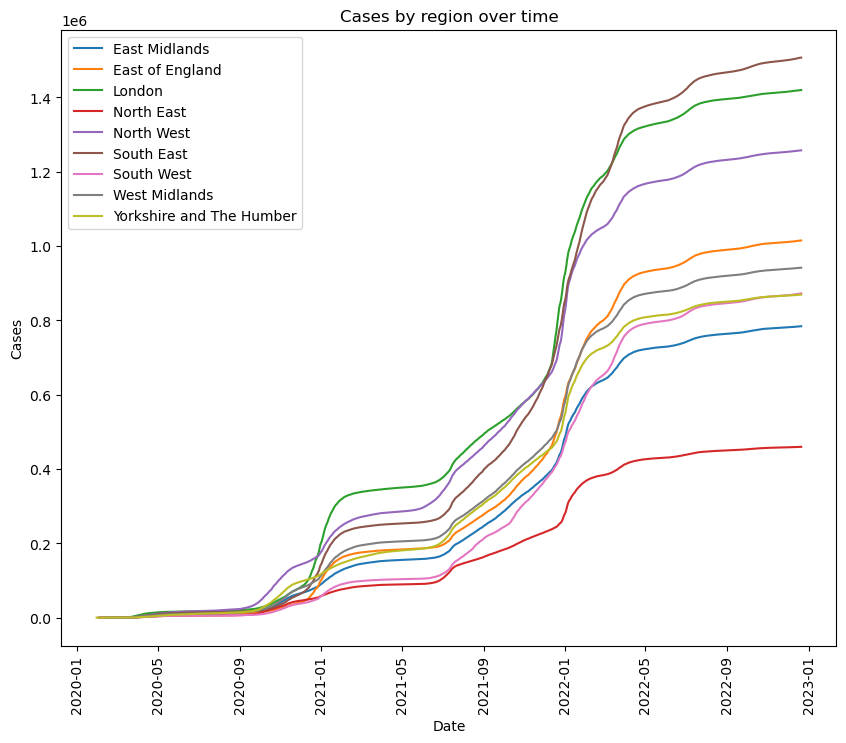

In [537]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for maleCasesRegionName in maleCasesRegion["Region"].unique():
    # Filter for the current region
    maleCasesRegionData = maleCasesRegion[maleCasesRegion["Region"] == maleCasesRegionName]
    
    # Plot the cases against date for the current region
    plt.plot(maleCasesRegionData["Date"], maleCasesRegionData["Cases"], label=maleCasesRegionName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Cases")
plt.legend()
plt.xticks(rotation=90)
plt.title("Cases by region over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the cases over time

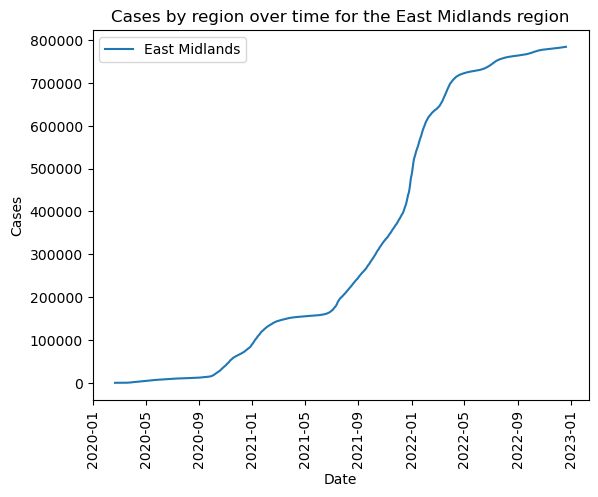

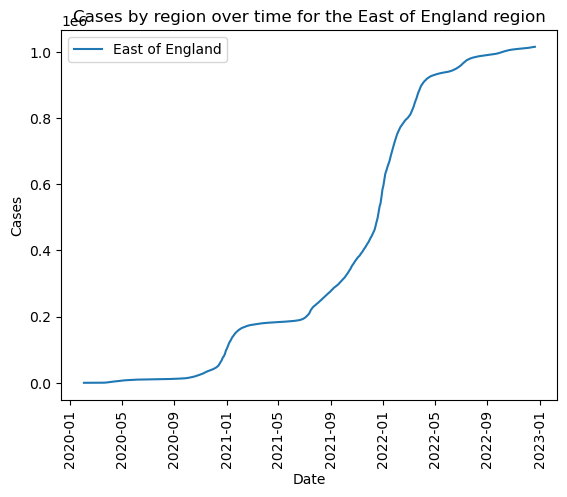

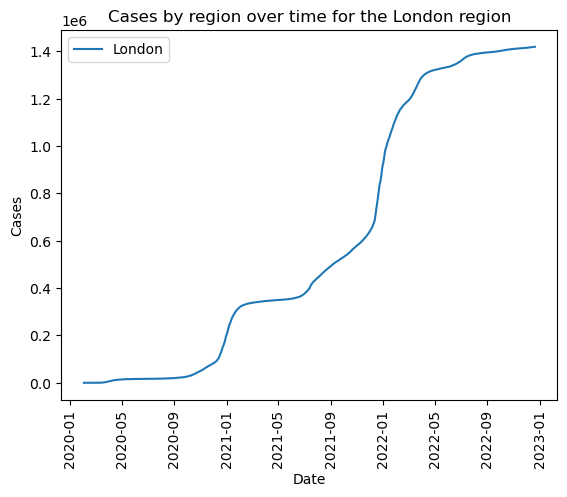

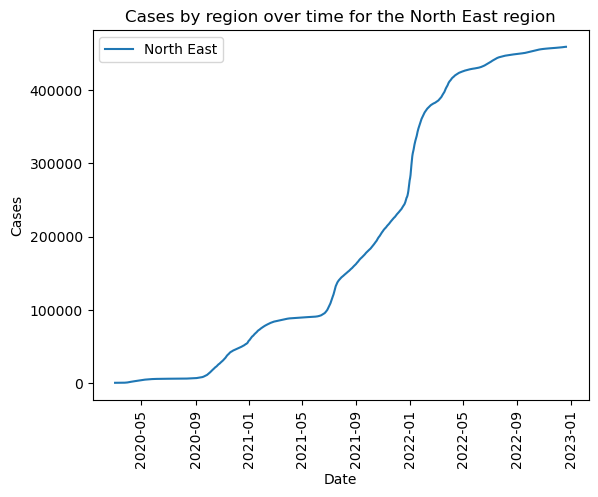

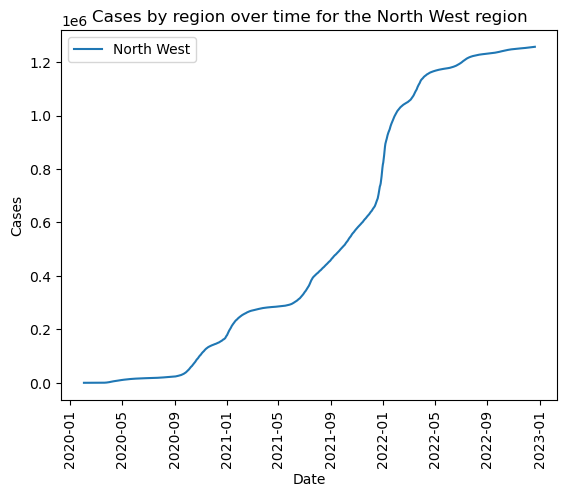

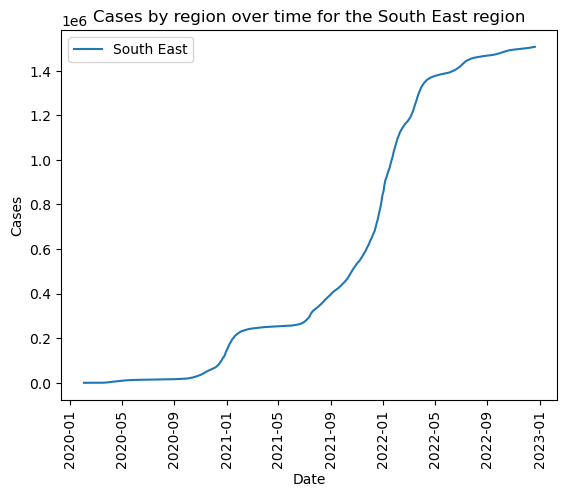

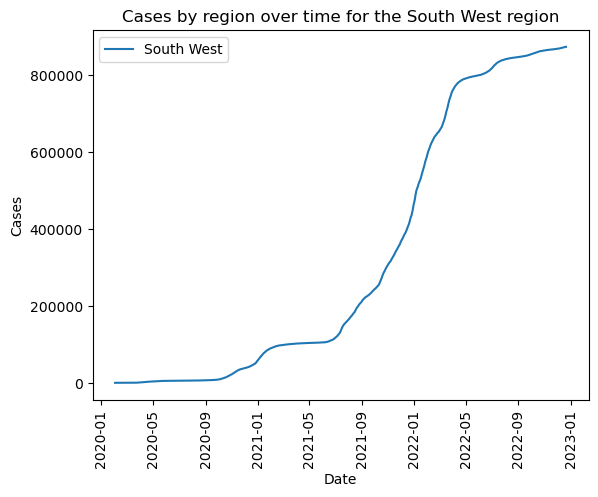

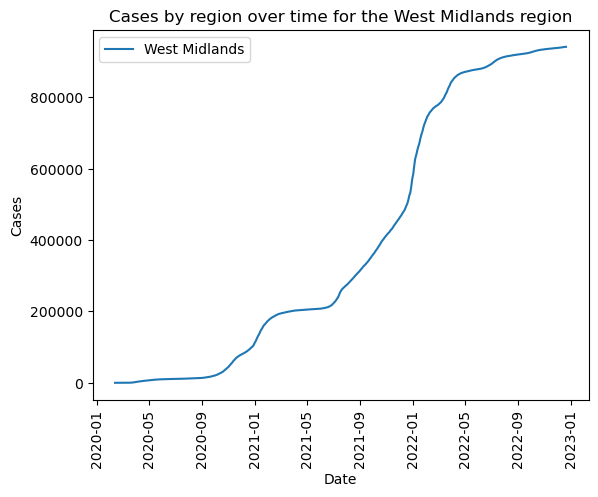

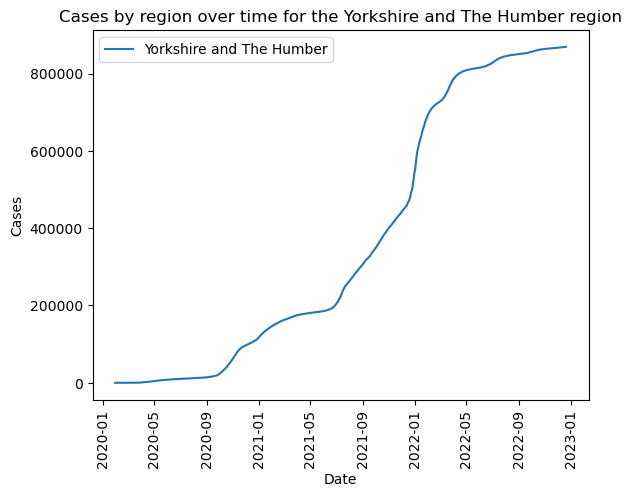

In [538]:
# Loop through each region
for maleCasesRegionName in maleCasesRegion["Region"].unique():
    # Filter for the current region
    maleCasesRegionData = maleCasesRegion[maleCasesRegion["Region"] == maleCasesRegionName]
    
    # Plot the cases against date for the current region
    plt.plot(maleCasesRegionData["Date"], maleCasesRegionData["Cases"], label=maleCasesRegionName)
    
    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Cases")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Cases by region over time for the {} region".format(maleCasesRegionName))
    
    # Show the plot
    plt.show()

##### Plotting a comparison graph for the case increase over time

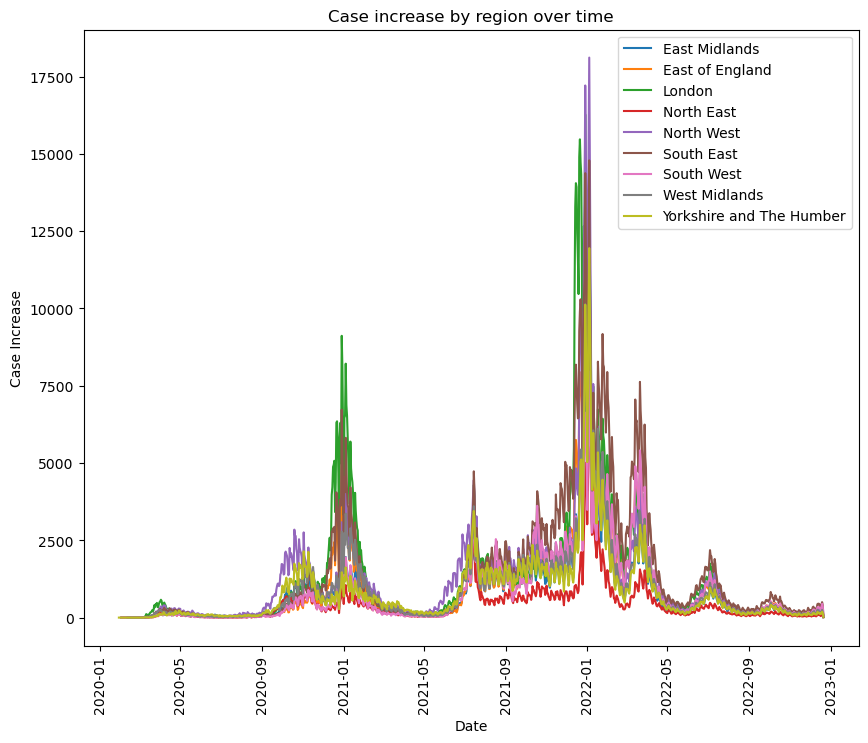

In [539]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for maleCasesRegionName in maleCasesRegion["Region"].unique():
    # Filter for the current region
    maleCasesRegionData = maleCasesRegion[maleCasesRegion["Region"] == maleCasesRegionName]
    
    # Plot the case increase against date for the current region
    plt.plot(maleCasesRegionData["Date"], maleCasesRegionData["Cases Increase"], label=maleCasesRegionName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Case Increase")
plt.legend()
plt.xticks(rotation=90)
plt.title("Case increase by region over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the case increase over time

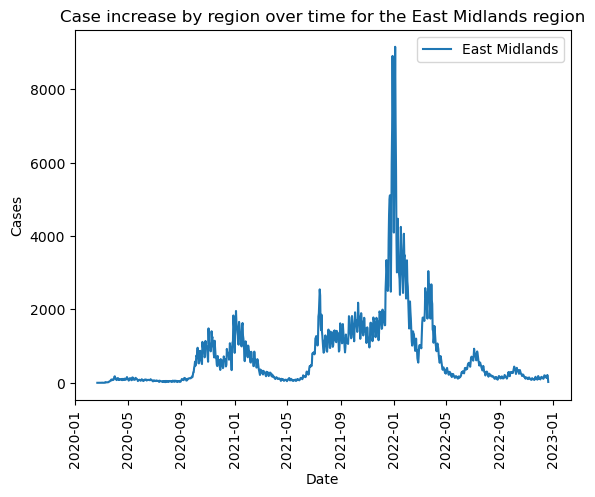

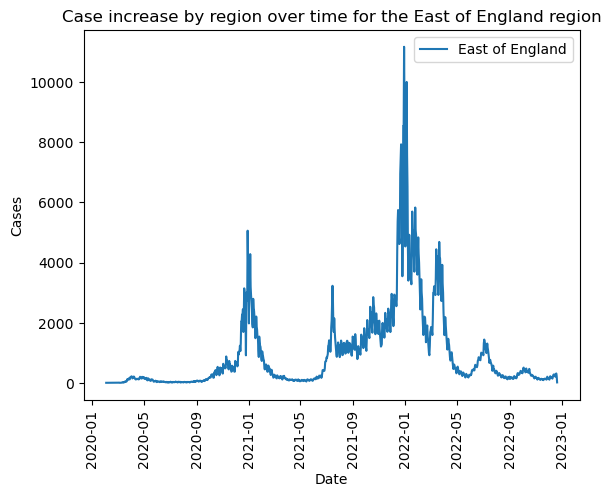

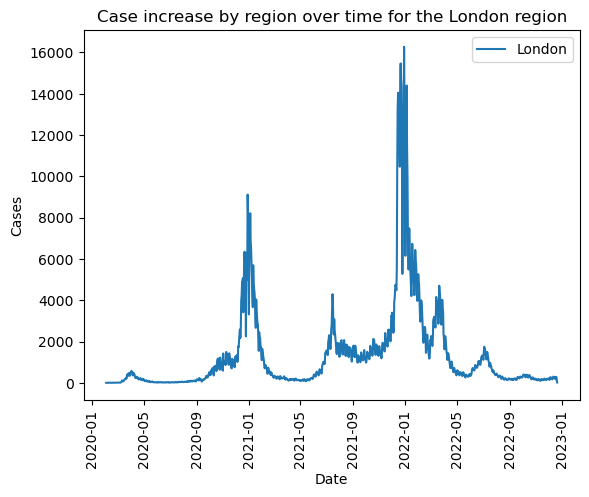

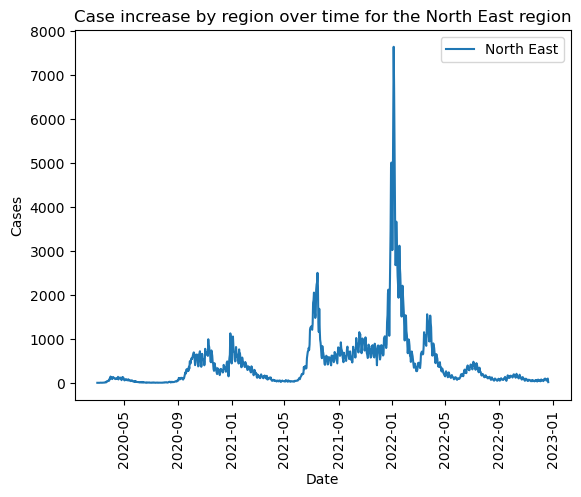

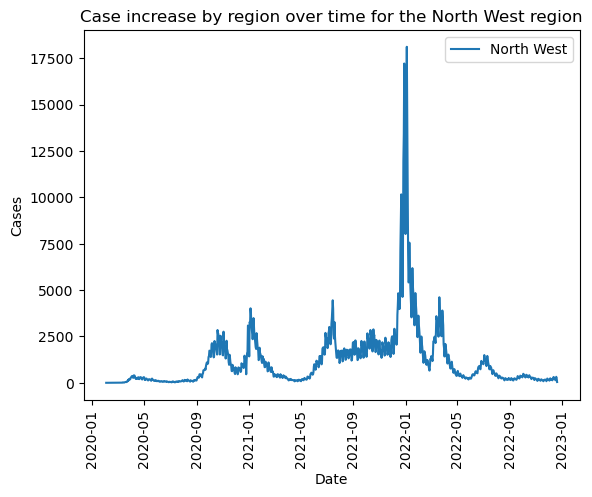

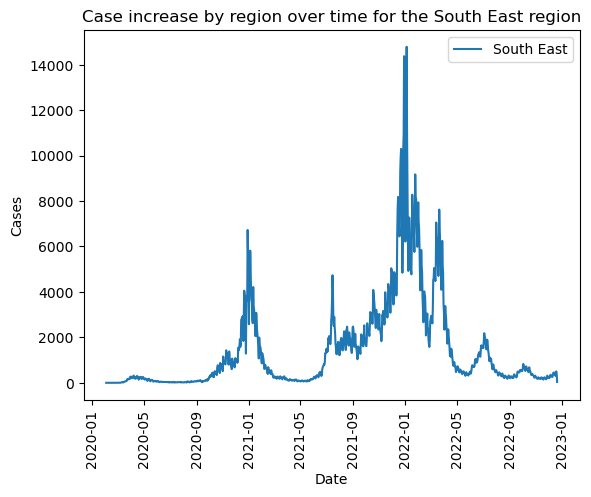

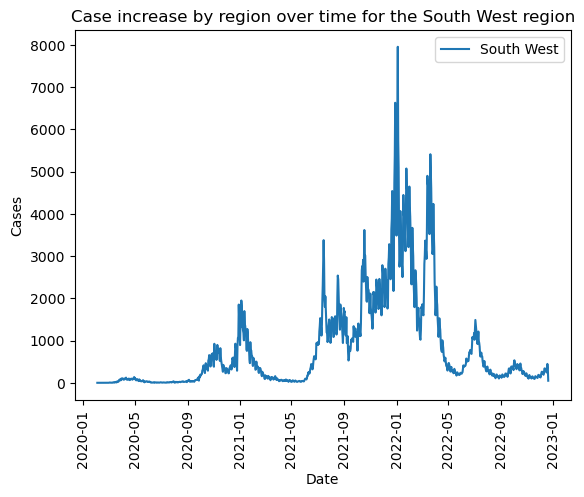

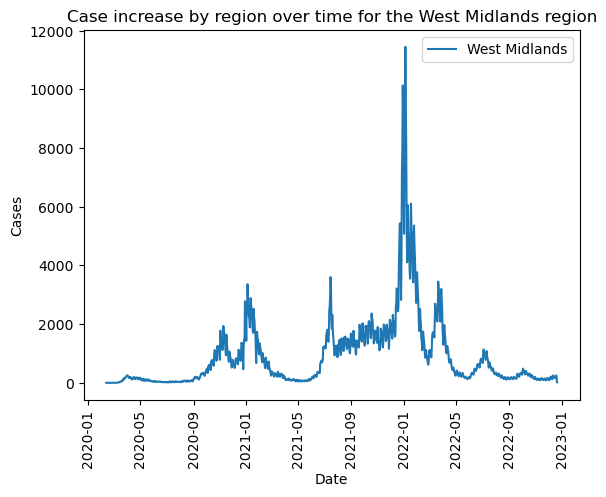

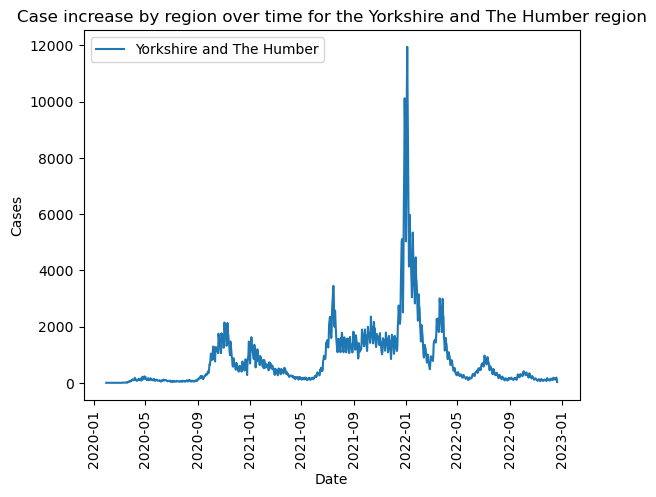

In [540]:
# Loop through each region
for maleCasesRegionName in maleCasesRegion["Region"].unique():
    # Filter for the current region
    maleCasesRegionData = maleCasesRegion[maleCasesRegion["Region"] == maleCasesRegionName]
    
    # Plot the case increase against date for the current region
    plt.plot(maleCasesRegionData["Date"], maleCasesRegionData["Cases Increase"], label=maleCasesRegionName)
    
    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Cases")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Case increase by region over time for the {} region".format(maleCasesRegionName))
    
    # Show the plot
    plt.show()

#### Age Distribution of Male Cases

##### Grouping the cases by age

In [541]:
# Group by age and date
maleCasesAgeGroup = maleCases1.groupby(["Age", "Date"]).sum()

# Reset index
maleCasesAge = maleCasesAgeGroup.reset_index()

# Output DataFrame
maleCasesAge

C:\Users\chukl\AppData\Local\Temp\ipykernel_14668\2921963814.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  maleCasesAgeGroup = maleCases1.groupby(["Age", "Date"]).sum()


,Age,Date,Rate,Cases
0,00 to 04,2020-01-30,0.0,0
1,00 to 04,2020-02-02,0.0,0
2,00 to 04,2020-02-03,0.0,0
3,00 to 04,2020-02-05,0.0,0
4,00 to 04,2020-02-08,0.0,0
...,...,...,...,...
19850,90+,2022-12-17,312576.5,57256
19851,90+,2022-12-18,312909.2,57326
19852,90+,2022-12-19,313419.8,57431
19853,90+,2022-12-20,313843.6,57512


##### Adding an increase column

In [542]:
# Calculate increase in cases over time for each age and add to a new column
maleCasesAge['Cases Increase'] = maleCasesAge.groupby('Age').Cases.diff().where(maleCasesAge['Age'] == maleCasesAge['Age'].shift(), 0).fillna(0)

# Output DataFrame
maleCasesAge

,Age,Date,Rate,Cases,Cases Increase
0,00 to 04,2020-01-30,0.0,0,0.0
1,00 to 04,2020-02-02,0.0,0,0.0
2,00 to 04,2020-02-03,0.0,0,0.0
3,00 to 04,2020-02-05,0.0,0,0.0
4,00 to 04,2020-02-08,0.0,0,0.0
...,...,...,...,...,...
19850,90+,2022-12-17,312576.5,57256,60.0
19851,90+,2022-12-18,312909.2,57326,70.0
19852,90+,2022-12-19,313419.8,57431,105.0
19853,90+,2022-12-20,313843.6,57512,81.0


##### Plotting a comparison graph for the cases over time

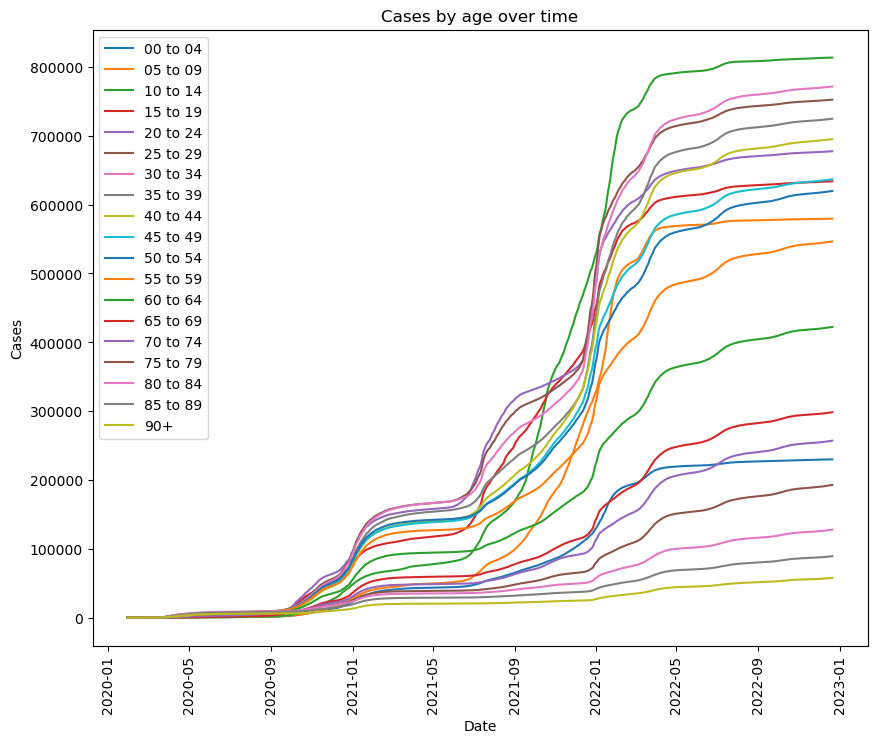

In [543]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each age
for maleCasesAgeName in maleCasesAge["Age"].unique():
    # Filter for the current age
    maleCasesAgeData = maleCasesAge[maleCasesAge["Age"] == maleCasesAgeName]
    
    # Plot the cases against date for the current age
    plt.plot(maleCasesAgeData["Date"], maleCasesAgeData["Cases"], label=maleCasesAgeName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Cases")
plt.legend()
plt.xticks(rotation=90)
plt.title("Cases by age over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the cases over time

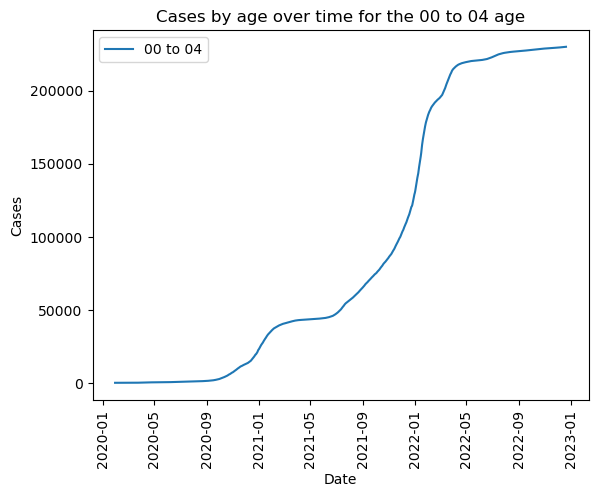

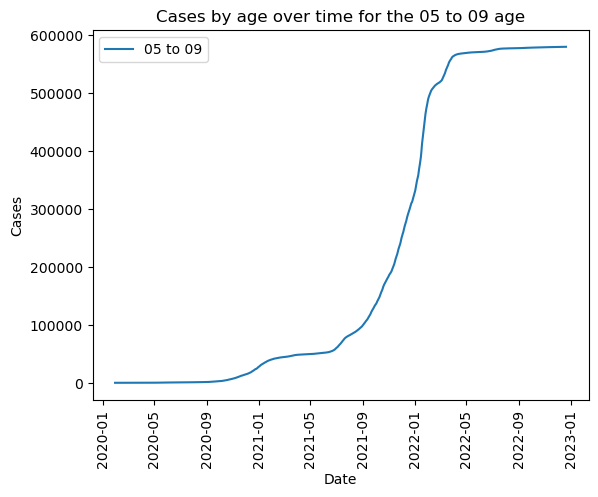

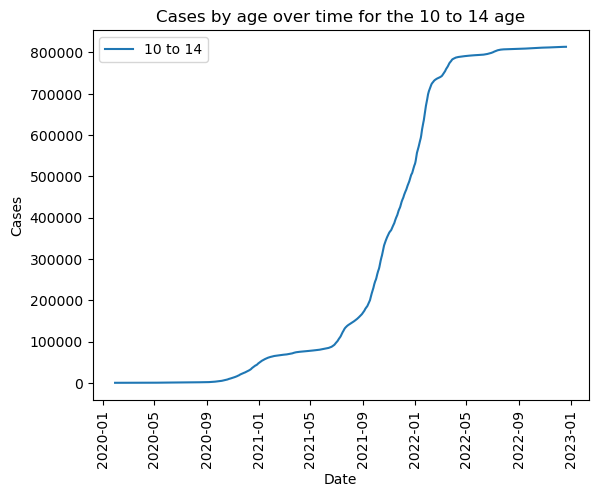

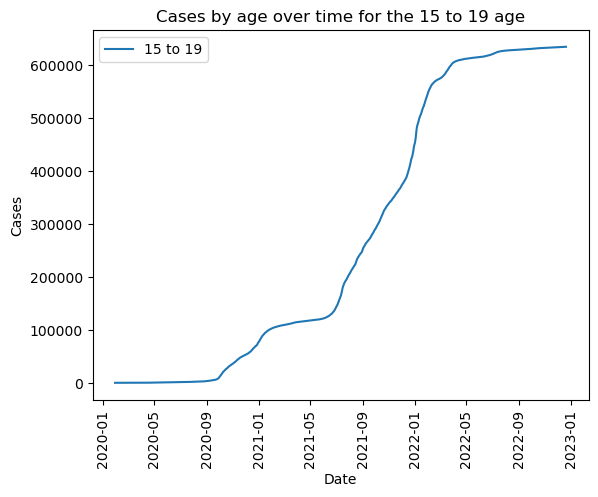

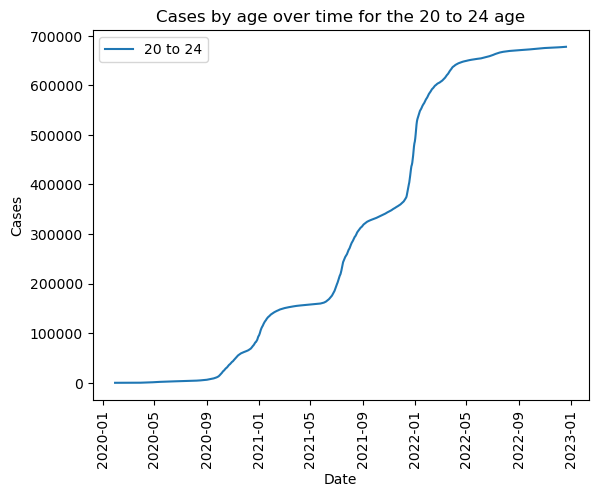

...

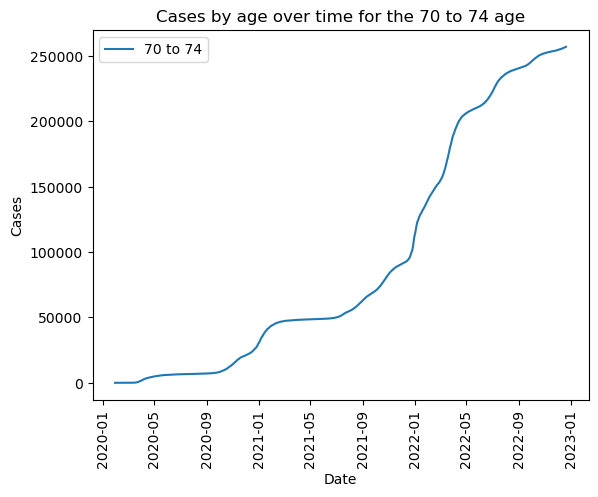

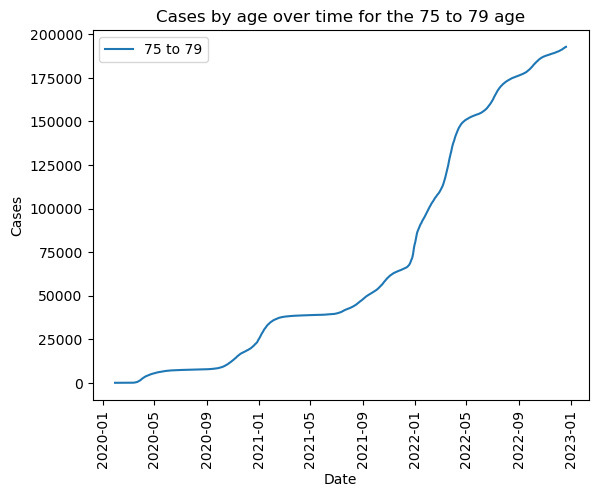

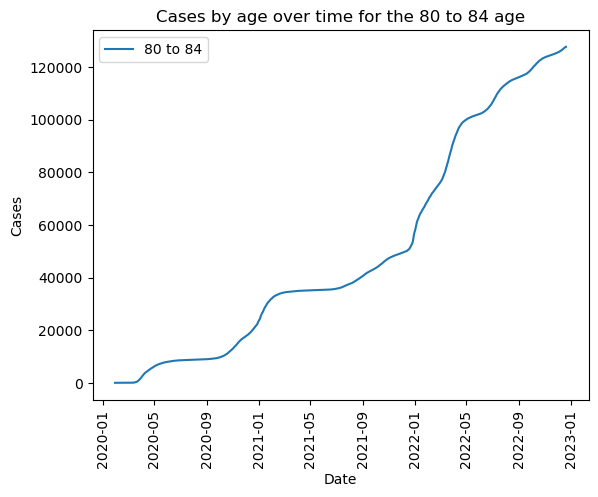

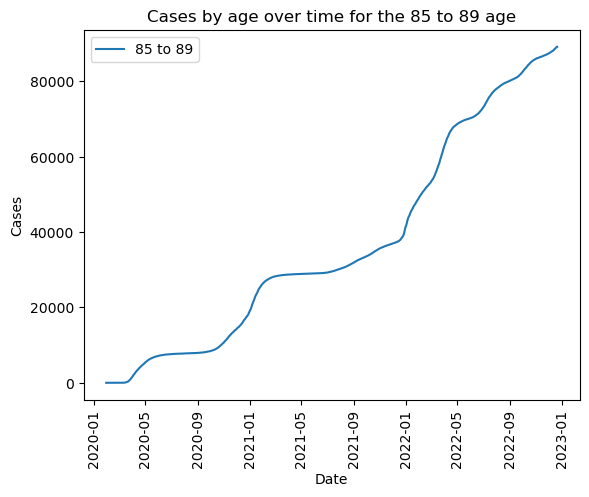

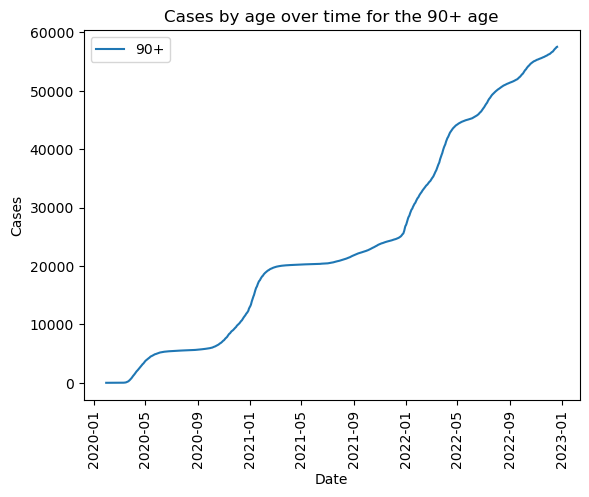

In [544]:
# Loop through each age
for maleCasesAgeName in maleCasesAge["Age"].unique():
    # Filter for the current age
    maleCasesAgeData = maleCasesAge[maleCasesAge["Age"] == maleCasesAgeName]
    
    # Plot the cases against date for the current age
    plt.plot(maleCasesAgeData["Date"], maleCasesAgeData["Cases"], label=maleCasesAgeName)
    
    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Cases")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Cases by age over time for the {} age".format(maleCasesAgeName))
    
    # Show the plot
    plt.show()

##### Plotting a comparison graph for the case increase over time

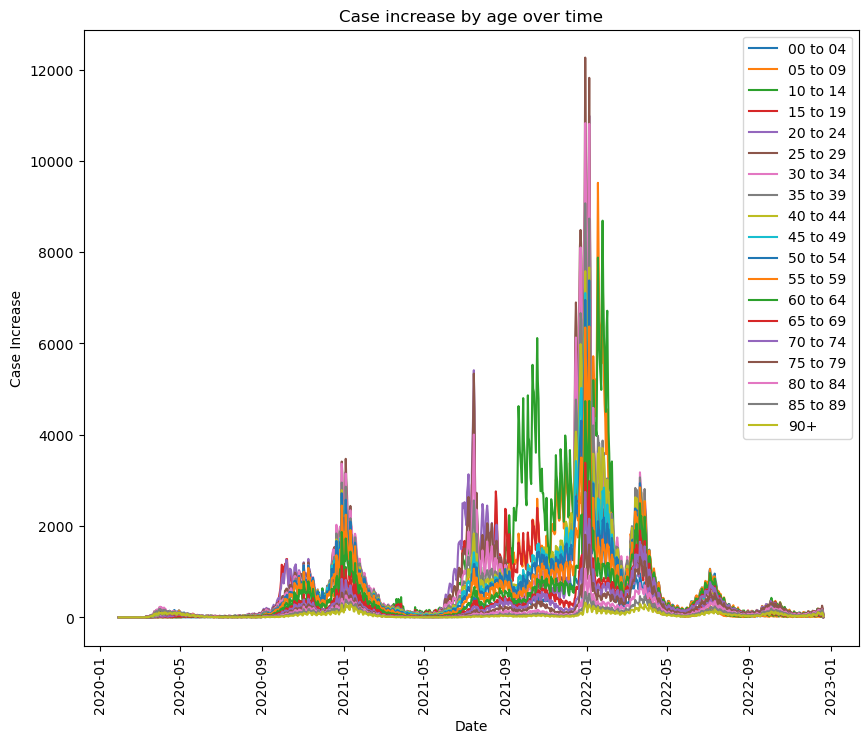

In [545]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each age
for maleCasesAgeName in maleCasesAge["Age"].unique():
    # Filter for the current age
    maleCasesAgeData = maleCasesAge[maleCasesAge["Age"] == maleCasesAgeName]
    
    # Plot the case increase against date for the current age
    plt.plot(maleCasesAgeData["Date"], maleCasesAgeData["Cases Increase"], label=maleCasesAgeName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Case Increase")
plt.legend()
plt.xticks(rotation=90)
plt.title("Case increase by age over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the case increase over time

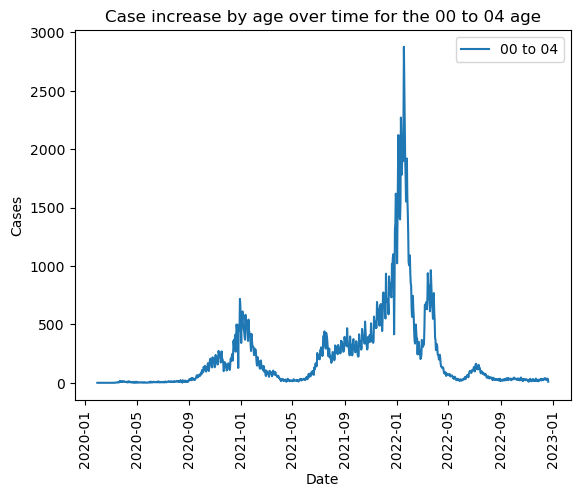

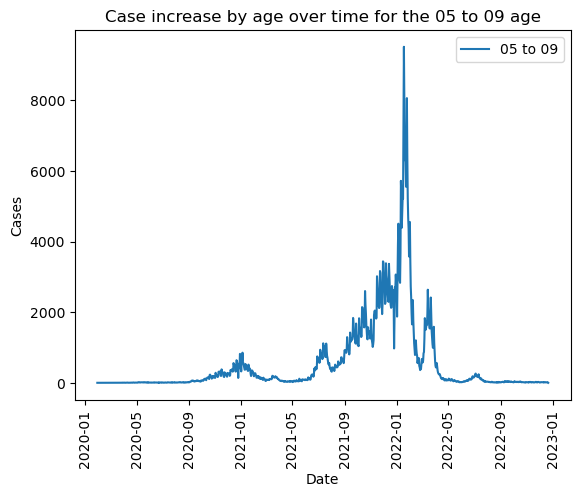

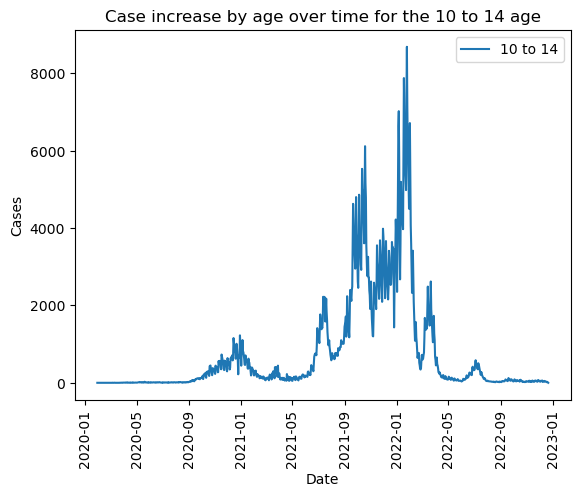

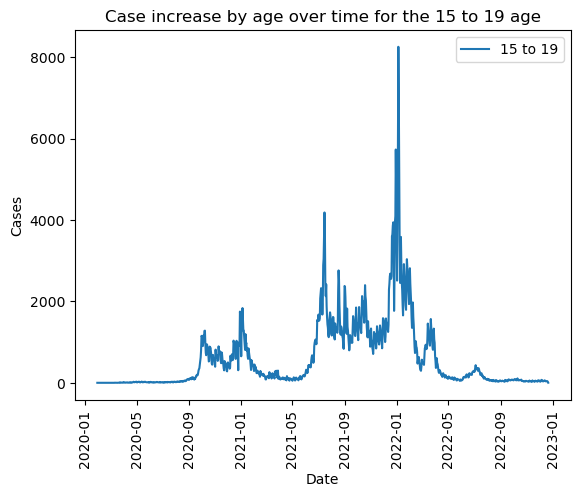

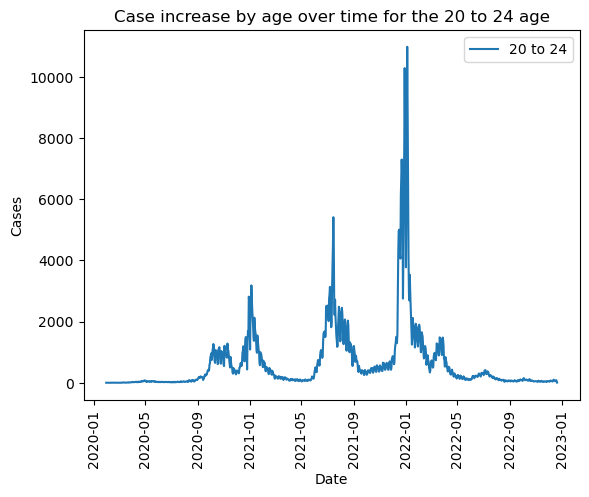

...

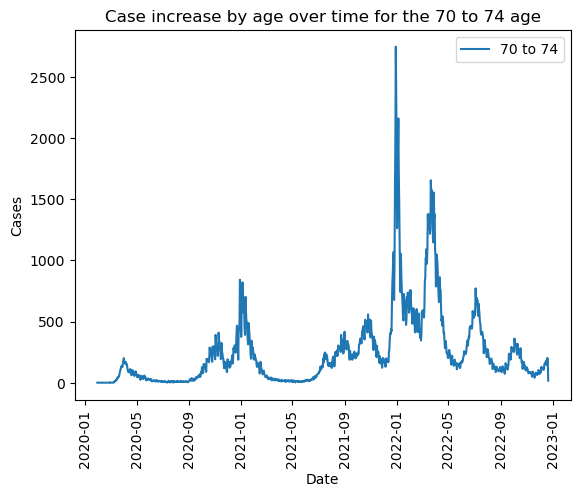

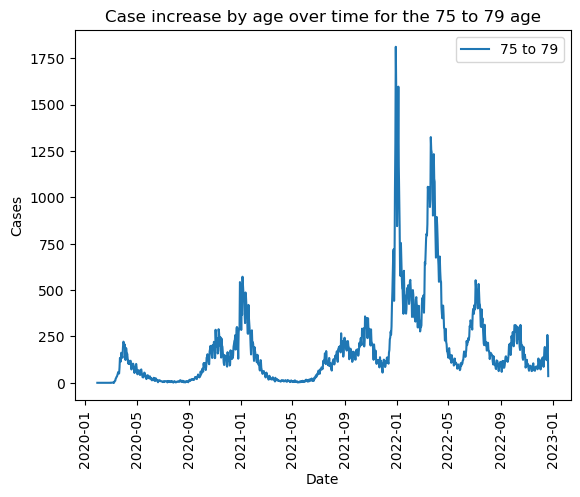

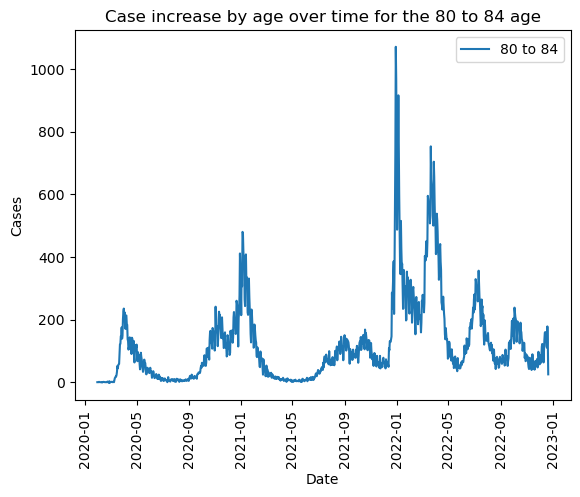

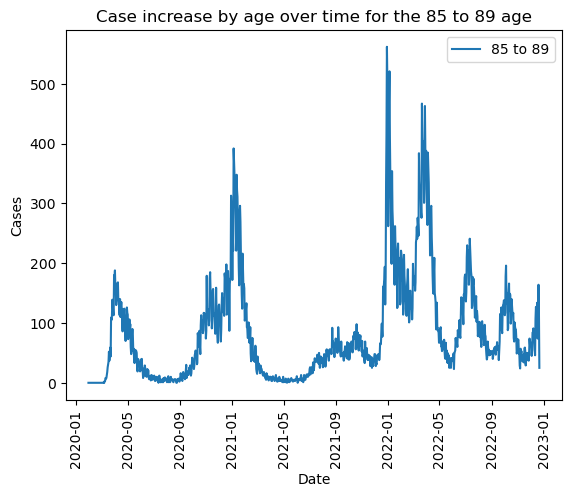

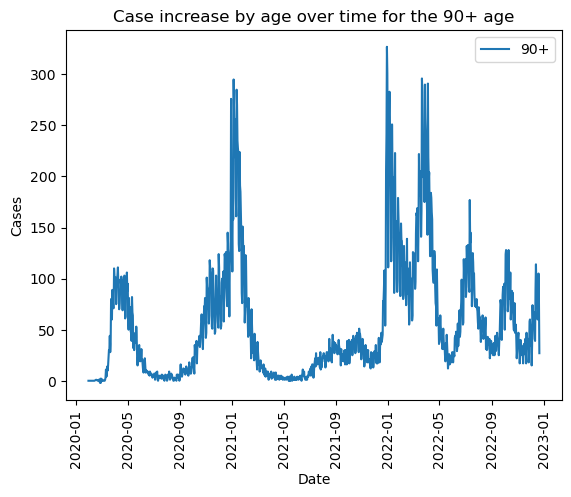

In [546]:
# Loop through each age
for maleCasesAgeName in maleCasesAge["Age"].unique():
    # Filter for the current age
    maleCasesAgeData = maleCasesAge[maleCasesAge["Age"] == maleCasesAgeName]
    
    # Plot the case increase against date for the current age
    plt.plot(maleCasesAgeData["Date"], maleCasesAgeData["Cases Increase"], label=maleCasesAgeName)
    
    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Cases")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Case increase by age over time for the {} age".format(maleCasesAgeName))
    
    # Show the plot
    plt.show()

#### Regional Proportion of Reinfections

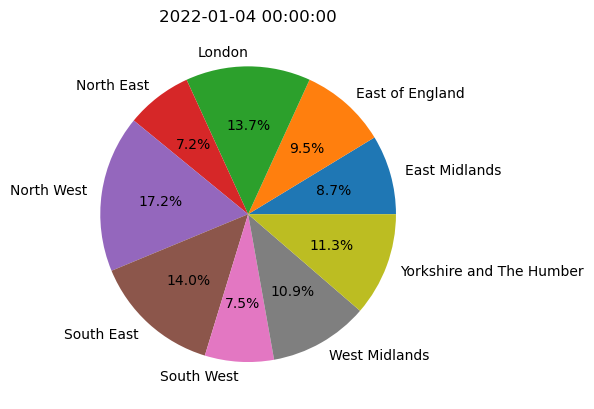

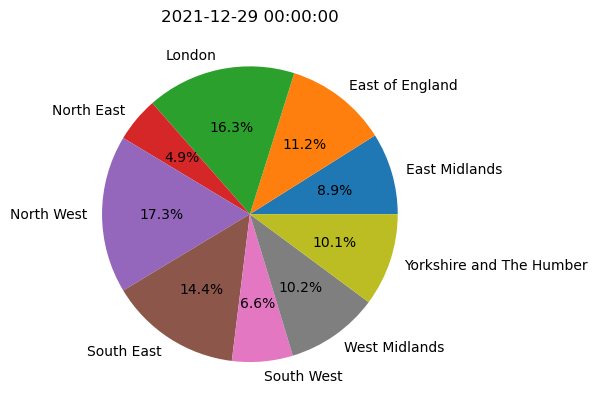

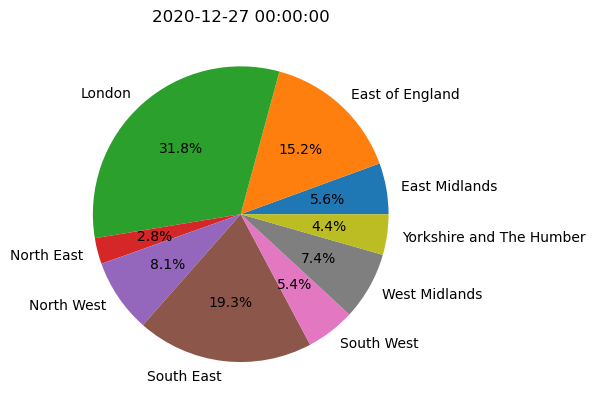

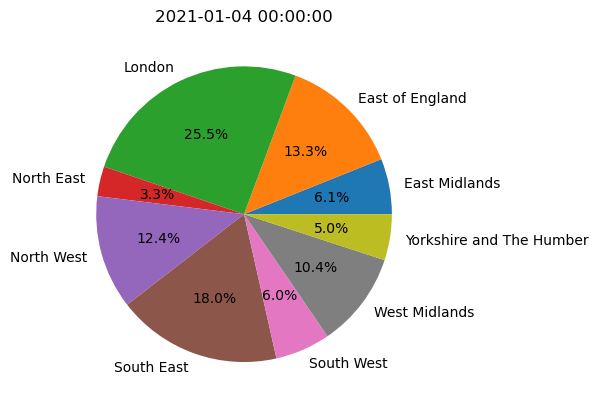

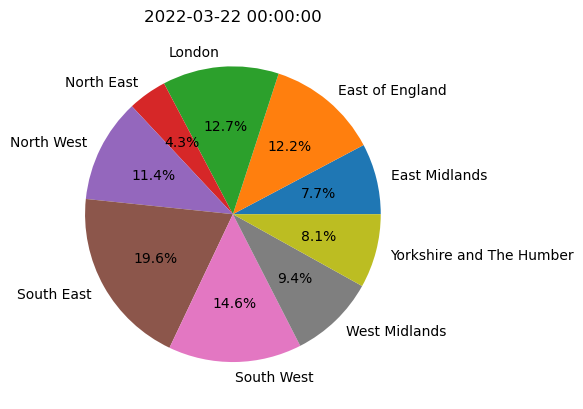

In [547]:
# Calculate the rolling mean of case increase and add to a new column
maleCasesRegion["Rolling Mean"] = maleCasesRegion["Cases Increase"].rolling(7).mean()

# Group the data by month and find the peak number of case increase for each month
maxCasesPerMonth = maleCasesRegion.groupby(maleCasesRegion["Date"].dt.strftime("%Y-%m"))["Cases Increase"].max()

# Sort the values in descending order
maxCasesPerMonth = maxCasesPerMonth.sort_values(ascending=False)

# Get the five highest months
top5Months = maxCasesPerMonth.head(5).index.tolist()

# Loop through each month
for month in top5Months:
    # Create a copy of the data for that month
    month2 = maleCasesRegion[maleCasesRegion["Date"].dt.strftime("%Y-%m") == month].copy()
    
    # Calculate the percentage increase in cases and add to a new column
    month2.loc[:, "Percentage Increase"] = month2["Cases Increase"] / month2["Cases Increase"].sum()
    
    # Find the peak date and add to a new column
    month2.loc[:, "Peak"] = (month2["Rolling Mean"].diff(1) > 0) & (month2["Rolling Mean"].diff(-1) > 0)
    
    # Get the peak date
    peakDate = month2[month2["Peak"]].sort_values("Cases Increase", ascending=False)["Date"].iloc[0]
    
    # Plot a pie chart for the percentage increase in cases on each peak date
    plt.pie(month2[month2["Date"] == peakDate]["Percentage Increase"], labels=month2[month2["Date"] == peakDate]["Region"], autopct="%1.1f%%")
    
    # Configure the layout of the plot
    plt.title(str(peakDate))
    
    # Show the plot
    plt.show()

#### Age Proportion of Male Cases

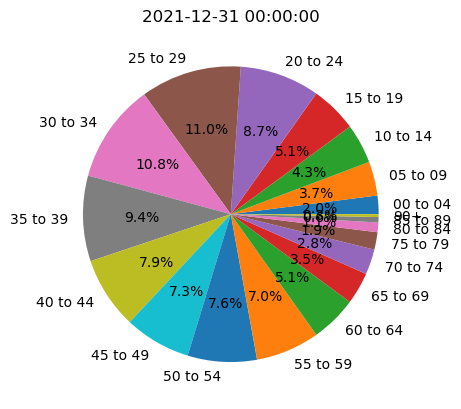

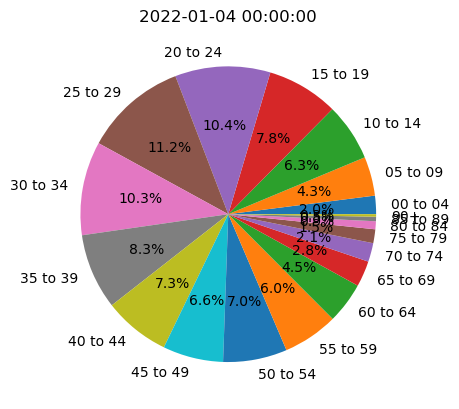

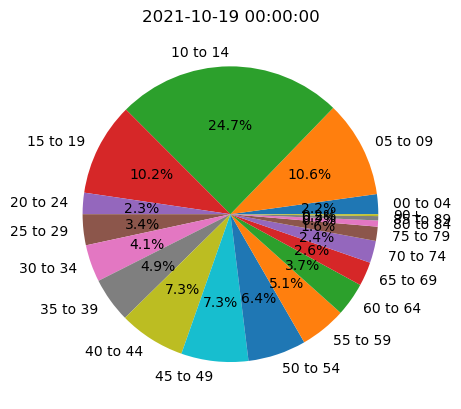

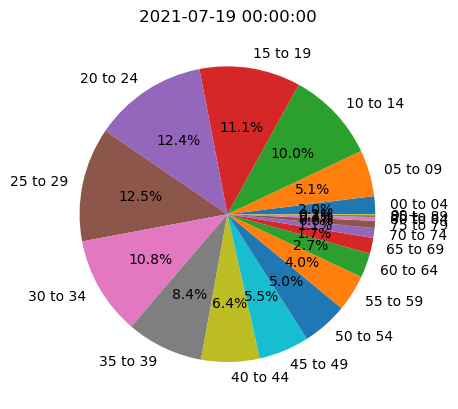

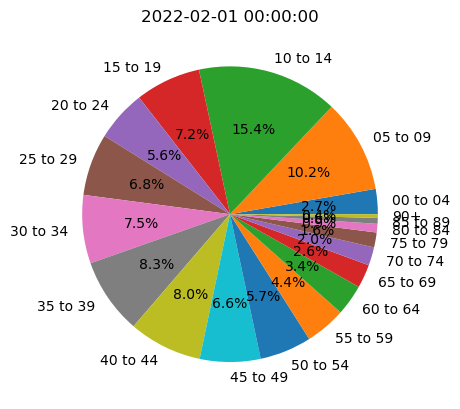

In [548]:
# Calculate the rolling mean of case increase and add to a new column
maleCasesAge["Rolling Mean"] = maleCasesAge["Cases Increase"].rolling(7).mean()

# Group the data by month and find the peak number of case increase for each month
maxCasesPerMonth = maleCasesAge.groupby(maleCasesAge["Date"].dt.strftime("%Y-%m"))["Cases Increase"].max()

# Sort the values in descending order
maxCasesPerMonth = maxCasesPerMonth.sort_values(ascending=False)

# Get the five highest months
top5Months = maxCasesPerMonth.head(5).index.tolist()

# Loop through each month
for month in top5Months:
    # Create a copy of the data for that month
    month2 = maleCasesAge[maleCasesAge["Date"].dt.strftime("%Y-%m") == month].copy()
    
    # Calculate the percentage increase in cases and add to a new column
    month2.loc[:, "Percentage Increase"] = month2["Cases Increase"] / month2["Cases Increase"].sum()
    
    # Find the peak date and add to a new column
    month2.loc[:, "Peak"] = (month2["Rolling Mean"].diff(1) > 0) & (month2["Rolling Mean"].diff(-1) > 0)
    
    # Get the peak date
    peakDate = month2[month2["Peak"]].sort_values("Cases Increase", ascending=False)["Date"].iloc[0]
    
    # Plot a pie chart for the percentage increase in cases on each peak date
    plt.pie(month2[month2["Date"] == peakDate]["Percentage Increase"], labels=month2[month2["Date"] == peakDate]["Age"], autopct="%1.1f%%")
    
    # Configure the layout of the plot
    plt.title(str(peakDate))
    
    # Show the plot
    plt.show()

### Female Cases Data Analysis

#### Regional Distribution of Female Cases

##### Grouping the cases by region

In [549]:
# Group by region and date
femaleCasesRegionGroup = femaleCases1.groupby(["Region", "Date"]).sum()

# Reset index
femaleCasesRegion = femaleCasesRegionGroup.reset_index()

# Output DataFrame
femaleCasesRegion

C:\Users\chukl\AppData\Local\Temp\ipykernel_14668\1793612969.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  femaleCasesRegionGroup = femaleCases1.groupby(["Region", "Date"]).sum()


,Region,Date,Rate,Cases
0,East Midlands,2020-02-21,1.0,1
1,East Midlands,2020-02-25,1.7,2
2,East Midlands,2020-02-27,1.7,2
3,East Midlands,2020-02-28,1.7,2
4,East Midlands,2020-02-29,1.7,2
...,...,...,...,...
9261,Yorkshire and The Humber,2022-12-17,685263.1,1068998
9262,Yorkshire and The Humber,2022-12-18,685453.8,1069238
9263,Yorkshire and The Humber,2022-12-19,685741.4,1069583
9264,Yorkshire and The Humber,2022-12-20,685958.1,1069847


##### Adding an increase column

In [550]:
# Calculate increase in cases over time for each region and add to a new column
femaleCasesRegion['Cases Increase'] = femaleCasesRegion.groupby('Region').Cases.diff().where(femaleCasesRegion['Region'] == femaleCasesRegion['Region'].shift(), 0).fillna(0)

# Output DataFrame
femaleCasesRegion

,Region,Date,Rate,Cases,Cases Increase
0,East Midlands,2020-02-21,1.0,1,0.0
1,East Midlands,2020-02-25,1.7,2,1.0
2,East Midlands,2020-02-27,1.7,2,0.0
3,East Midlands,2020-02-28,1.7,2,0.0
4,East Midlands,2020-02-29,1.7,2,0.0
...,...,...,...,...,...
9261,Yorkshire and The Humber,2022-12-17,685263.1,1068998,186.0
9262,Yorkshire and The Humber,2022-12-18,685453.8,1069238,240.0
9263,Yorkshire and The Humber,2022-12-19,685741.4,1069583,345.0
9264,Yorkshire and The Humber,2022-12-20,685958.1,1069847,264.0


##### Plotting a comparison graph for the cases over time

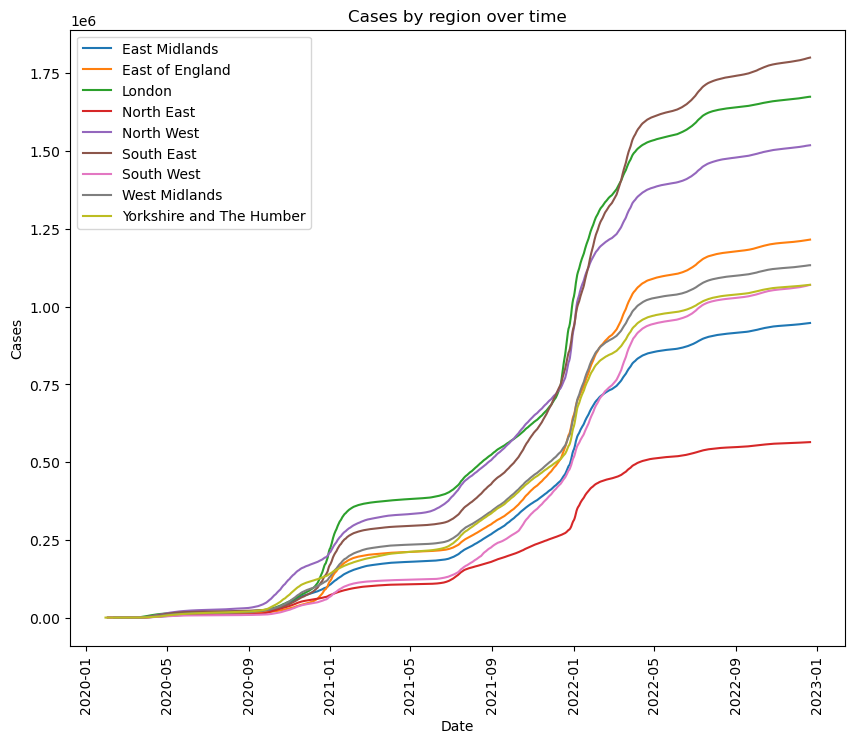

In [551]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for femaleCasesRegionName in femaleCasesRegion["Region"].unique():
    # Filter for the current region
    femaleCasesRegionData = femaleCasesRegion[femaleCasesRegion["Region"] == femaleCasesRegionName]
    
    # Plot the cases against date for the current region
    plt.plot(femaleCasesRegionData["Date"], femaleCasesRegionData["Cases"], label=femaleCasesRegionName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Cases")
plt.legend()
plt.xticks(rotation=90)
plt.title("Cases by region over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the cases over time

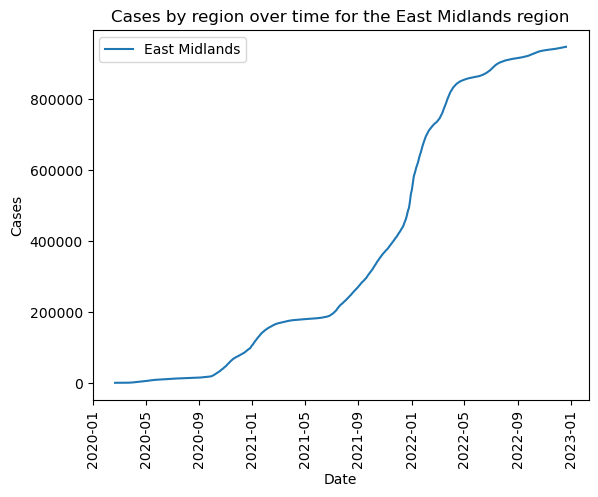

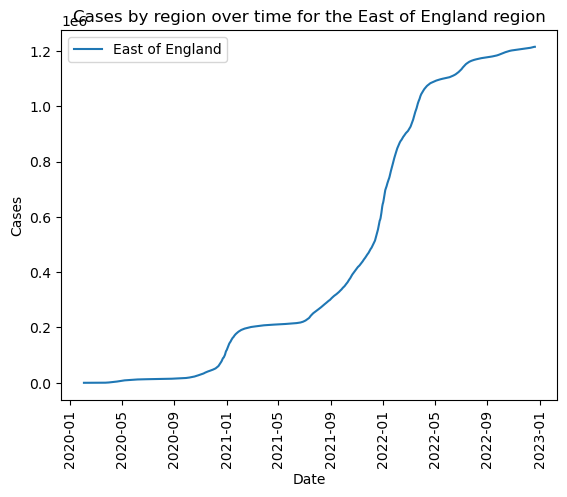

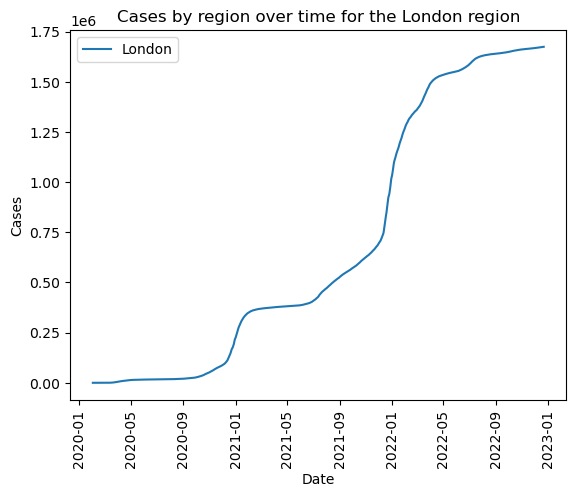

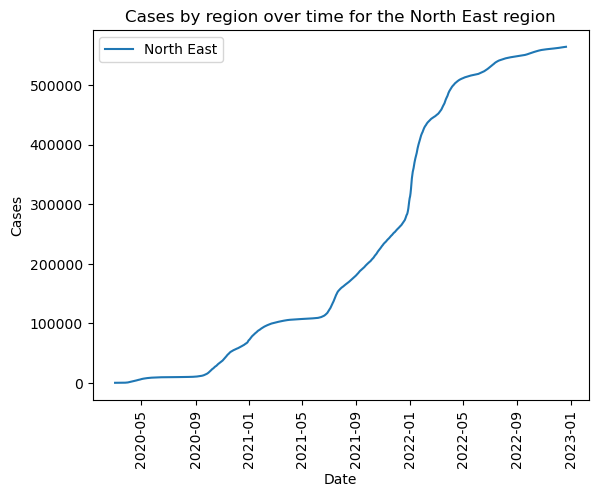

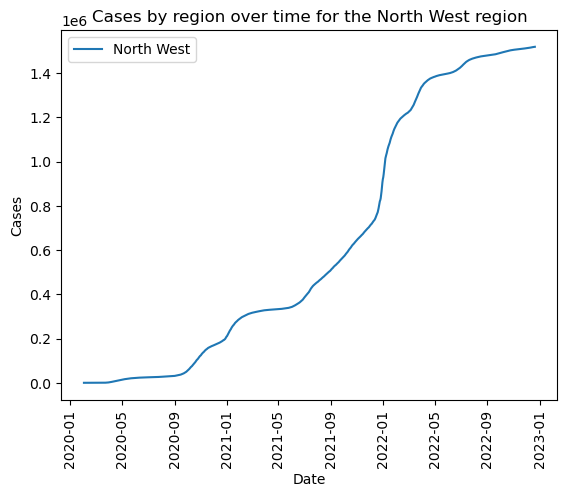

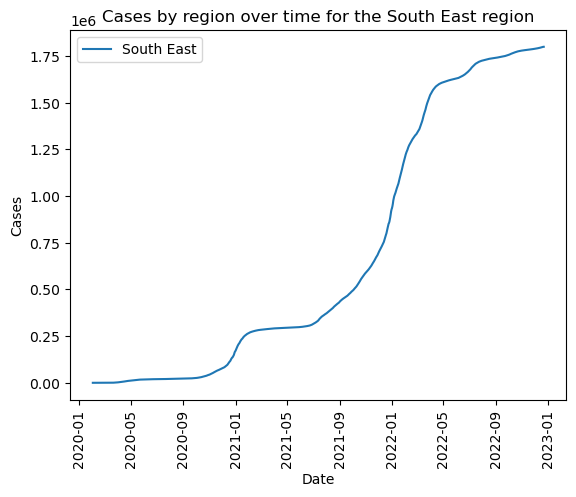

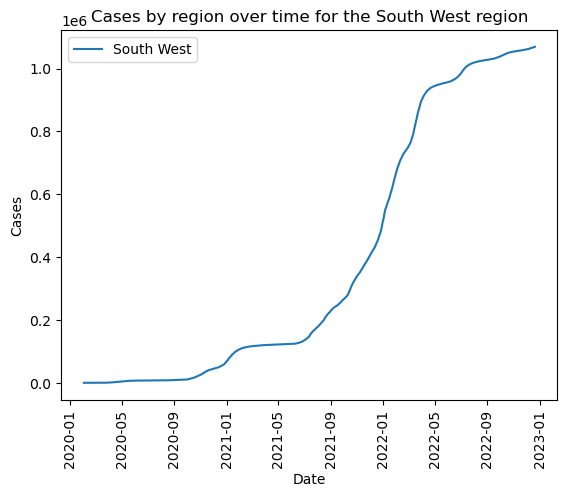

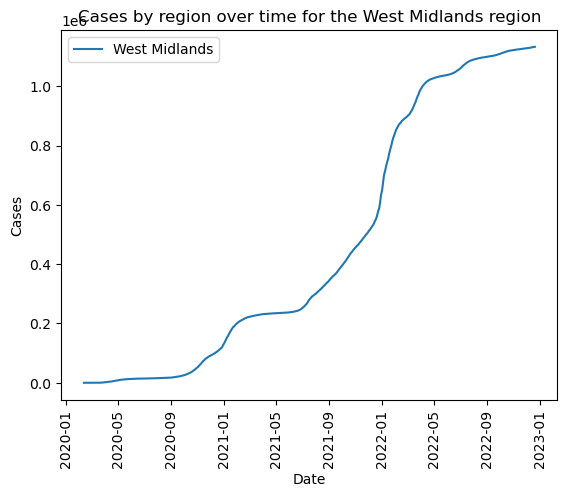

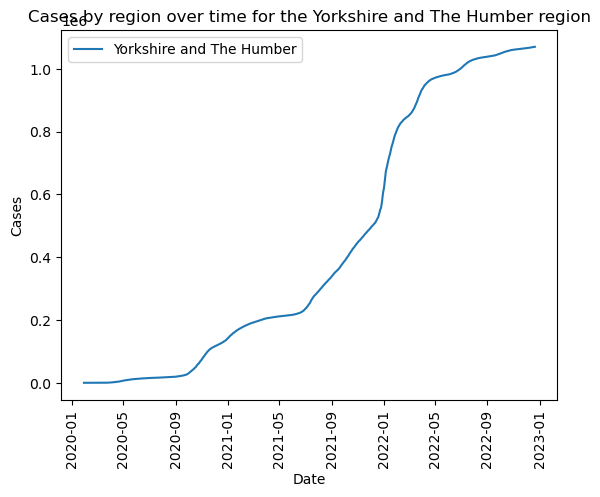

In [552]:
# Loop through each region
for femaleCasesRegionName in femaleCasesRegion["Region"].unique():
    # Filter for the current region
    femaleCasesRegionData = femaleCasesRegion[femaleCasesRegion["Region"] == femaleCasesRegionName]
    
    # Plot the cases against date for the current region
    plt.plot(femaleCasesRegionData["Date"], femaleCasesRegionData["Cases"], label=femaleCasesRegionName)
    
    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Cases")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Cases by region over time for the {} region".format(femaleCasesRegionName))
    
    # Show the plot
    plt.show()

##### Plotting a comparison graph for the case increase over time

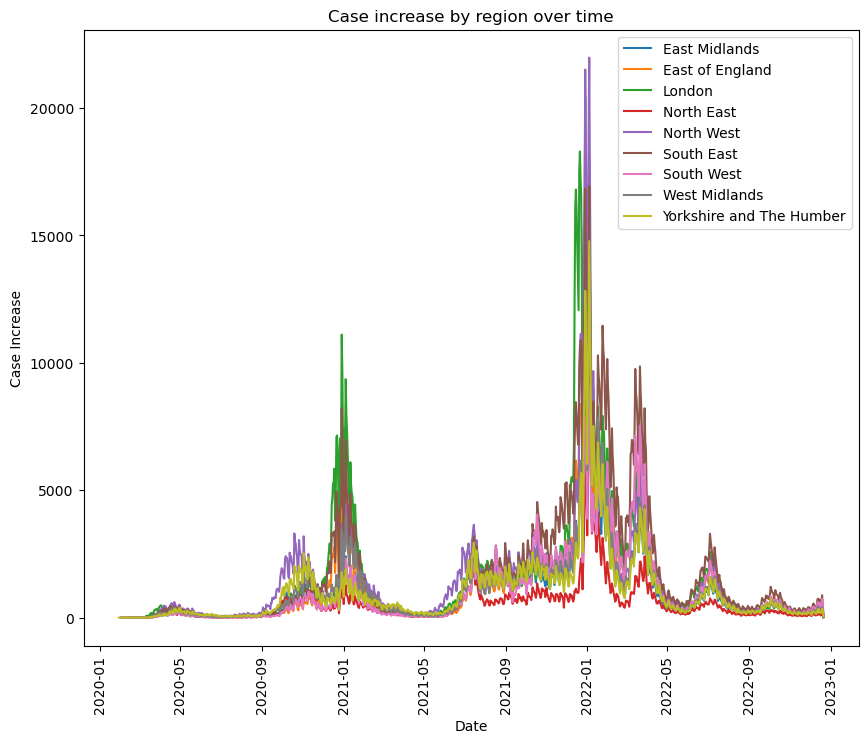

In [553]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for femaleCasesRegionName in femaleCasesRegion["Region"].unique():
    # Filter for the current region
    femaleCasesRegionData = femaleCasesRegion[femaleCasesRegion["Region"] == femaleCasesRegionName]
    
    # Plot the case increase against date for the current region
    plt.plot(femaleCasesRegionData["Date"], femaleCasesRegionData["Cases Increase"], label=femaleCasesRegionName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Case Increase")
plt.legend()
plt.xticks(rotation=90)
plt.title("Case increase by region over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the case increase over time

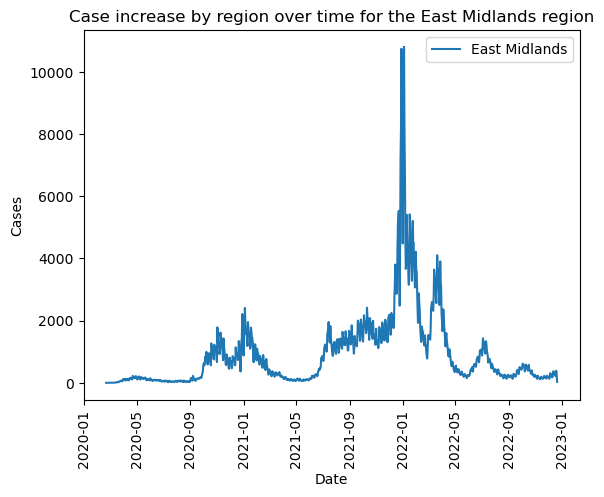

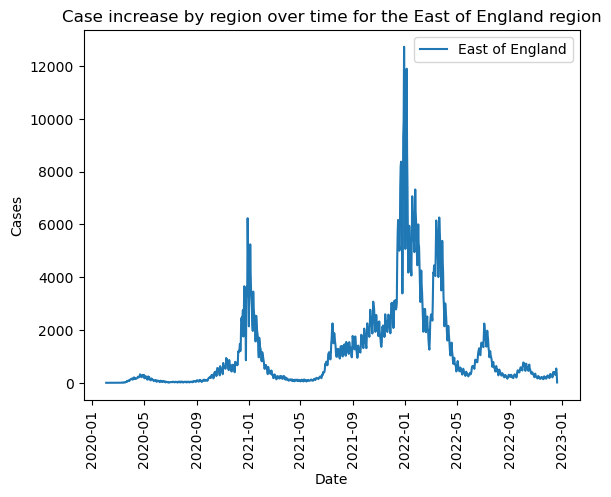

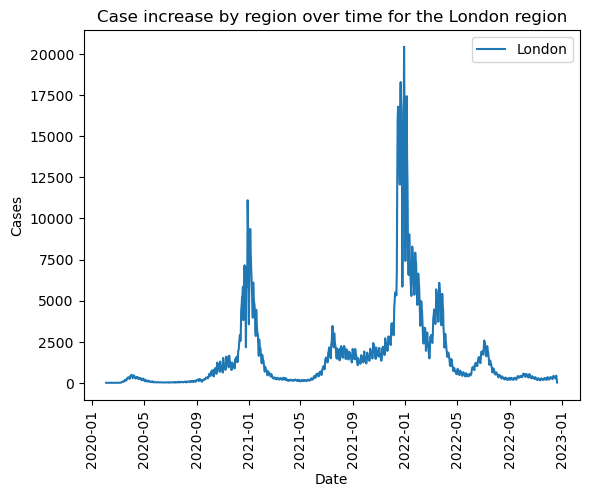

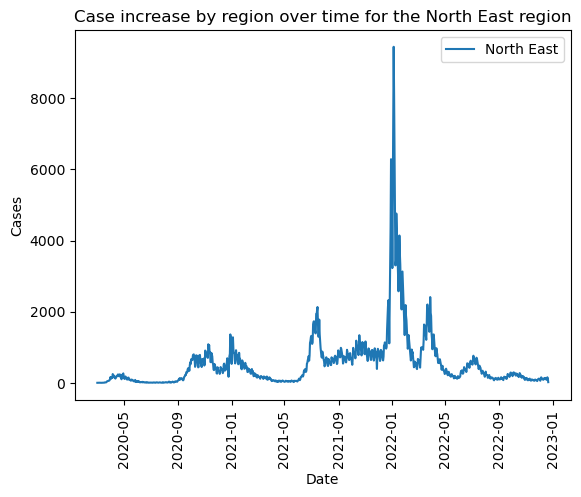

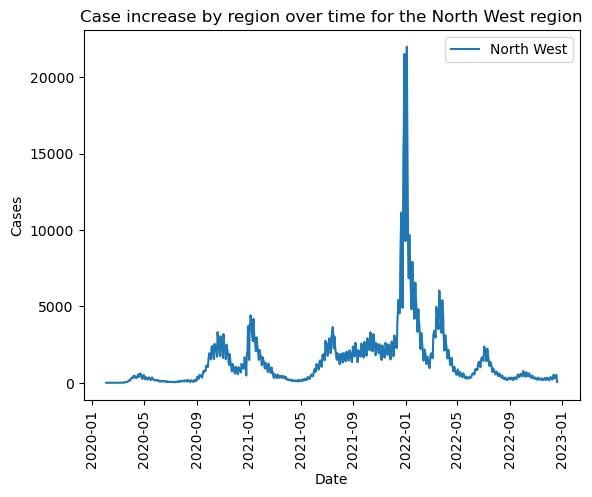

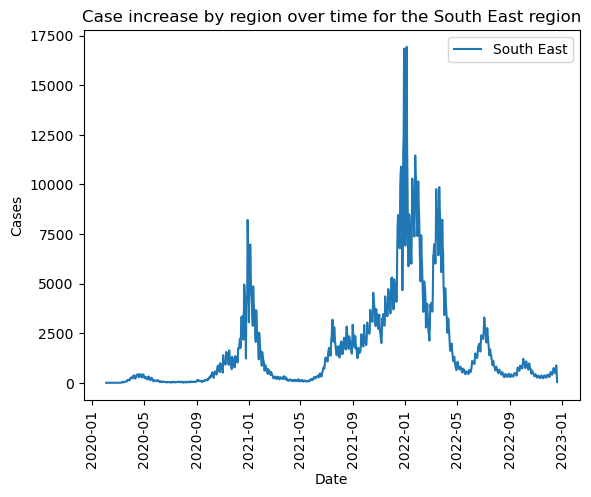

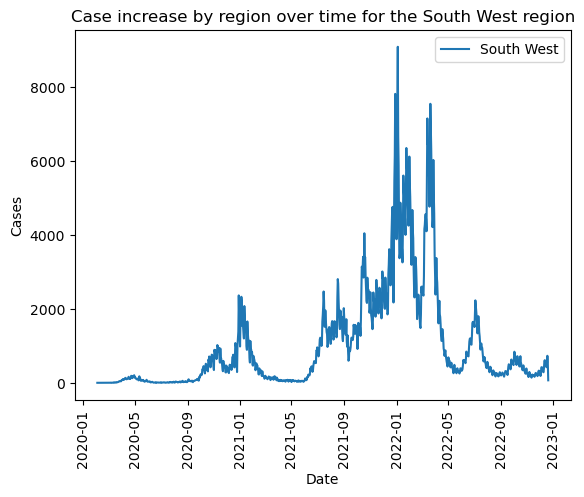

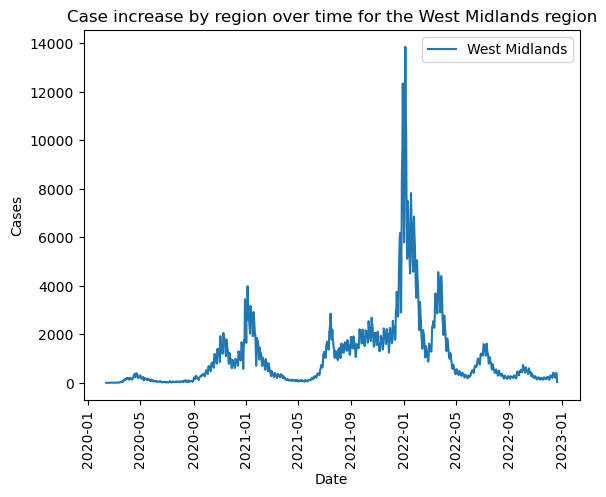

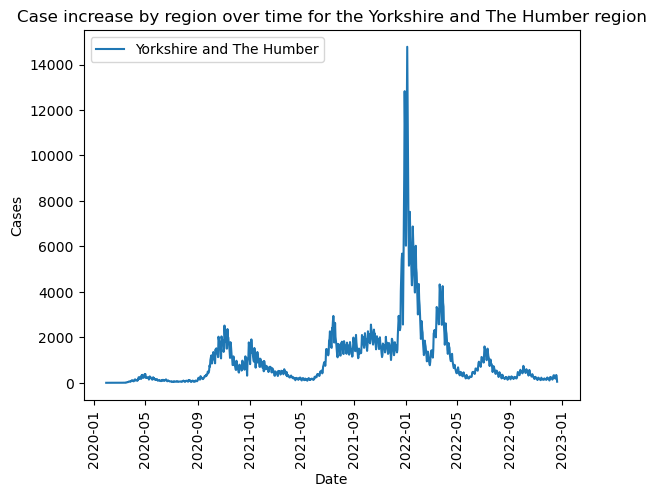

In [554]:
# Loop through each region
for femaleCasesRegionName in femaleCasesRegion["Region"].unique():
    # Filter for the current region
    femaleCasesRegionData = femaleCasesRegion[femaleCasesRegion["Region"] == femaleCasesRegionName]
    
    # Plot the case increase against date for the current region
    plt.plot(femaleCasesRegionData["Date"], femaleCasesRegionData["Cases Increase"], label=femaleCasesRegionName)
    
    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Cases")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Case increase by region over time for the {} region".format(femaleCasesRegionName))
    
    # Show the plot
    plt.show()

#### Age Distribution of Female Cases

##### Grouping the cases by age

In [555]:
# Group by age and date
femaleCasesAgeGroup = femaleCases1.groupby(["Age", "Date"]).sum()

# Reset index
femaleCasesAge = femaleCasesAgeGroup.reset_index()

# Output DataFrame
femaleCasesAge

C:\Users\chukl\AppData\Local\Temp\ipykernel_14668\3672982171.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  femaleCasesAgeGroup = femaleCases1.groupby(["Age", "Date"]).sum()


,Age,Date,Rate,Cases
0,00 to 04,2020-01-30,0.0,0
1,00 to 04,2020-02-02,0.0,0
2,00 to 04,2020-02-03,0.0,0
3,00 to 04,2020-02-05,0.0,0
4,00 to 04,2020-02-08,0.0,0
...,...,...,...,...
19850,90+,2022-12-17,326570.3,124257
19851,90+,2022-12-18,326894.1,124387
19852,90+,2022-12-19,327644.9,124686
19853,90+,2022-12-20,328008.7,124830


##### Adding an increase column

In [556]:
# Calculate increase in cases over time for each age and add to a new column
femaleCasesAge['Cases Increase'] = femaleCasesAge.groupby('Age').Cases.diff().where(femaleCasesAge['Age'] == femaleCasesAge['Age'].shift(), 0).fillna(0)

# Output DataFrame
femaleCasesAge

,Age,Date,Rate,Cases,Cases Increase
0,00 to 04,2020-01-30,0.0,0,0.0
1,00 to 04,2020-02-02,0.0,0,0.0
2,00 to 04,2020-02-03,0.0,0,0.0
3,00 to 04,2020-02-05,0.0,0,0.0
4,00 to 04,2020-02-08,0.0,0,0.0
...,...,...,...,...,...
19850,90+,2022-12-17,326570.3,124257,120.0
19851,90+,2022-12-18,326894.1,124387,130.0
19852,90+,2022-12-19,327644.9,124686,299.0
19853,90+,2022-12-20,328008.7,124830,144.0


##### Plotting a comparison graph for the cases over time

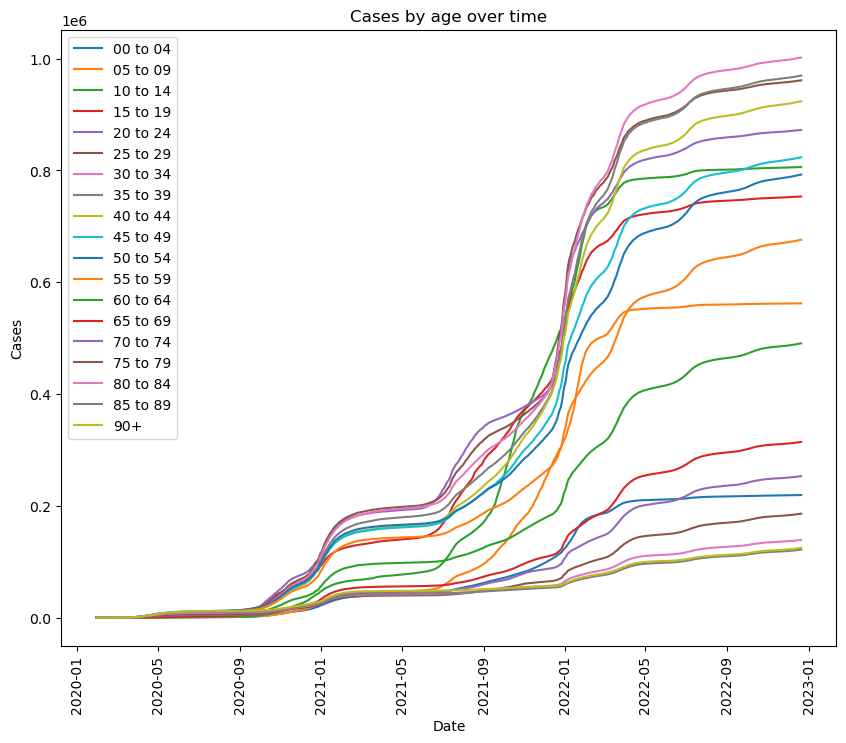

In [557]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each age
for femaleCasesAgeName in femaleCasesAge["Age"].unique():
    # Filter for the current age
    femaleCasesAgeData = femaleCasesAge[femaleCasesAge["Age"] == femaleCasesAgeName]
    
    # Plot the cases against date for the current age
    plt.plot(femaleCasesAgeData["Date"], femaleCasesAgeData["Cases"], label=femaleCasesAgeName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Cases")
plt.legend()
plt.xticks(rotation=90)
plt.title("Cases by age over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the cases over time

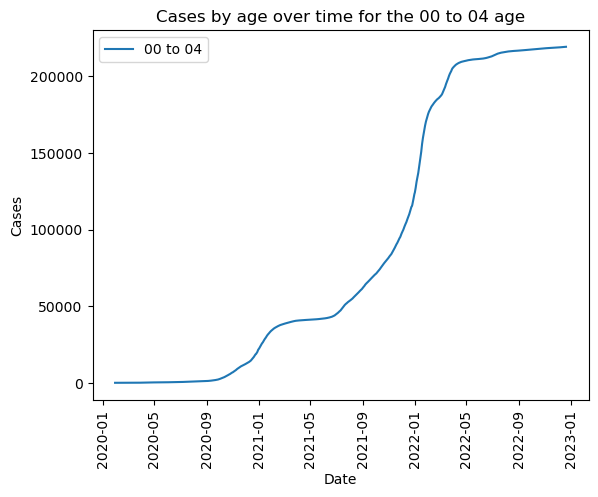

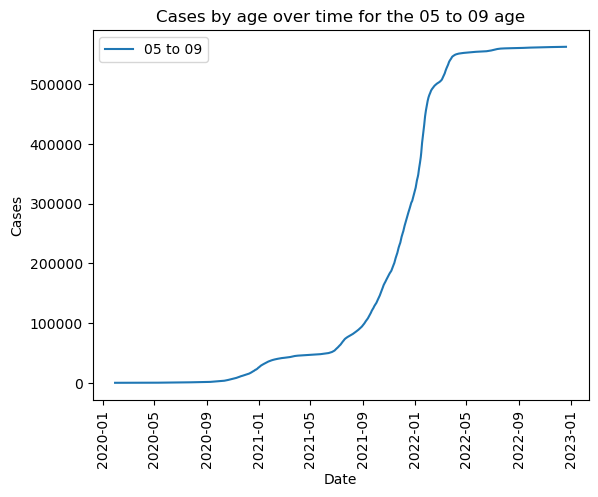

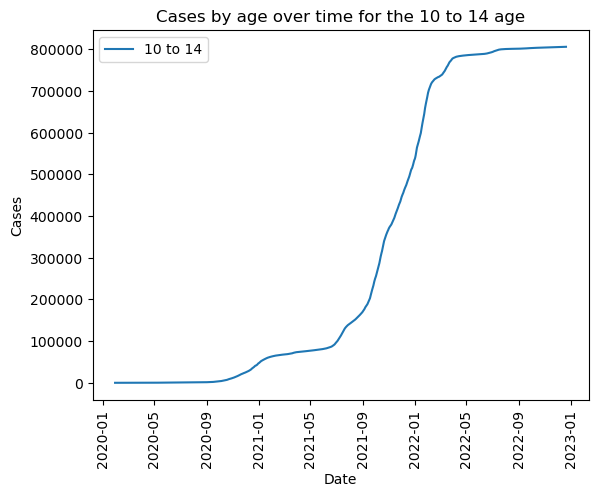

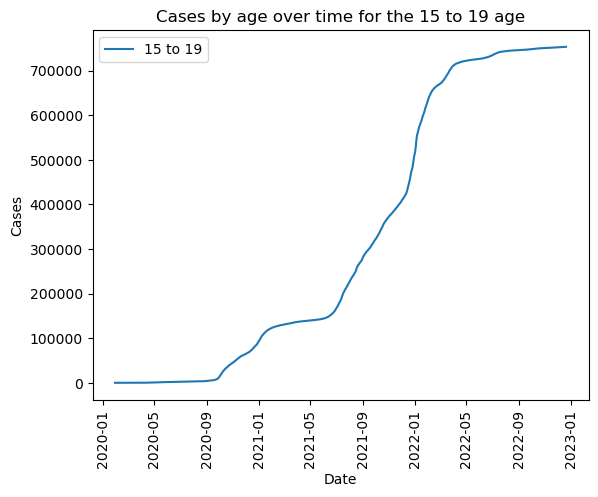

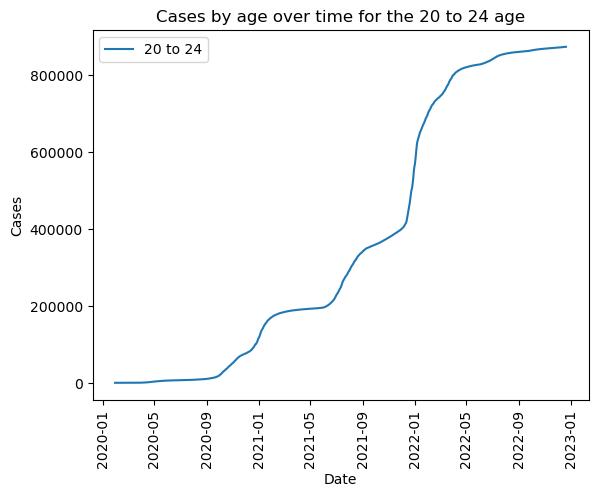

...

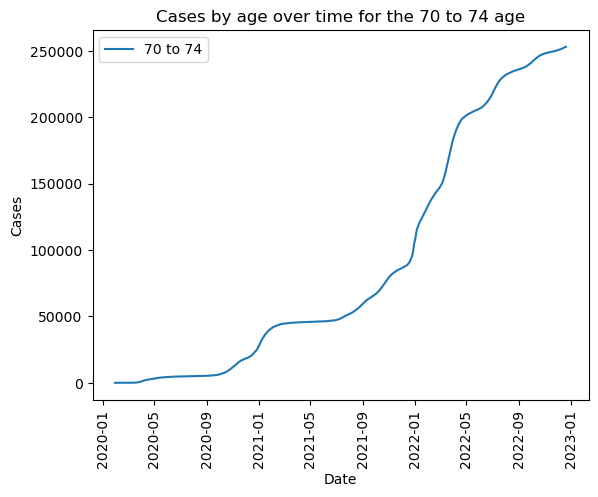

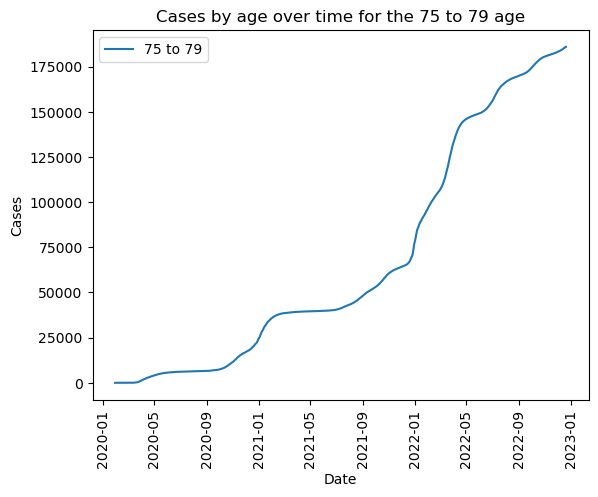

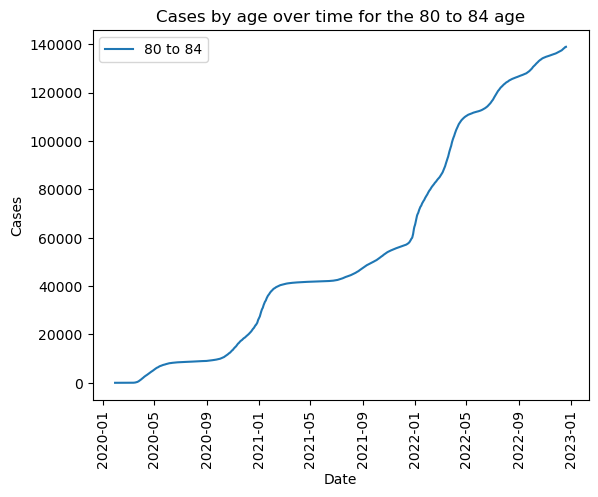

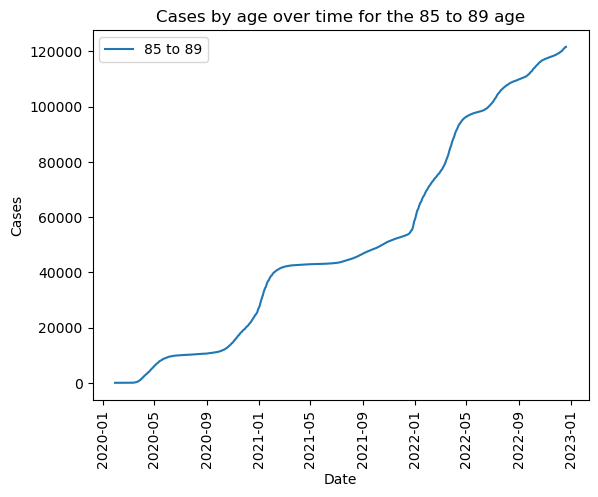

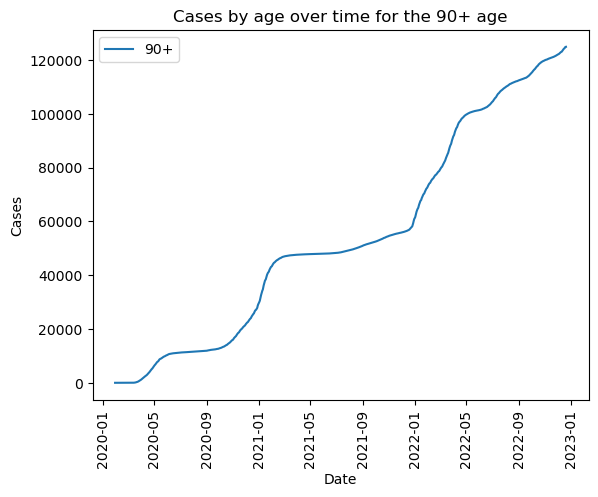

In [558]:
# Loop through each age
for femaleCasesAgeName in femaleCasesAge["Age"].unique():
    # Filter for the current age
    femaleCasesAgeData = femaleCasesAge[femaleCasesAge["Age"] == femaleCasesAgeName]
    
    # Plot the cases against date for the current age
    plt.plot(femaleCasesAgeData["Date"], femaleCasesAgeData["Cases"], label=femaleCasesAgeName)
    
    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Cases")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Cases by age over time for the {} age".format(femaleCasesAgeName))
    
    # Show the plot
    plt.show()

##### Plotting a comparison graph for the case increase over time

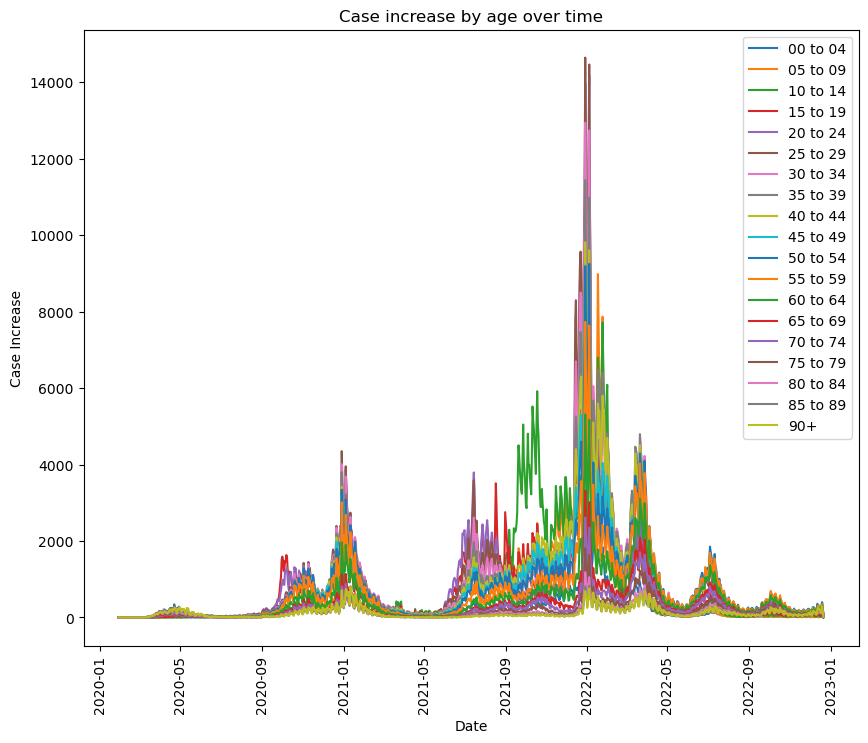

In [559]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each age
for femaleCasesAgeName in femaleCasesAge["Age"].unique():
    # Filter for the current age
    femaleCasesAgeData = femaleCasesAge[femaleCasesAge["Age"] == femaleCasesAgeName]
    
    # Plot the case increase against date for the current age
    plt.plot(femaleCasesAgeData["Date"], femaleCasesAgeData["Cases Increase"], label=femaleCasesAgeName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Case Increase")
plt.legend()
plt.xticks(rotation=90)
plt.title("Case increase by age over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the case increase over time

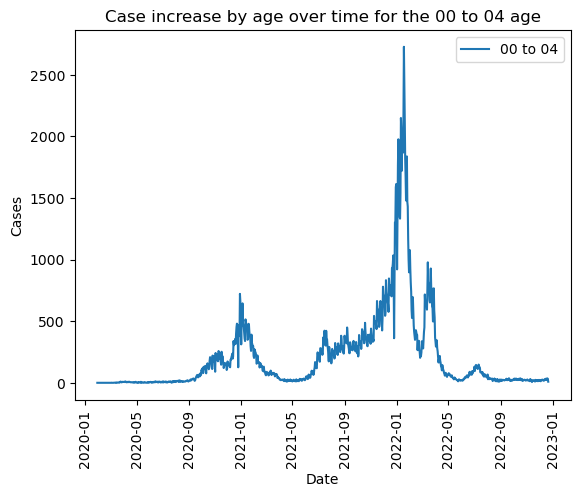

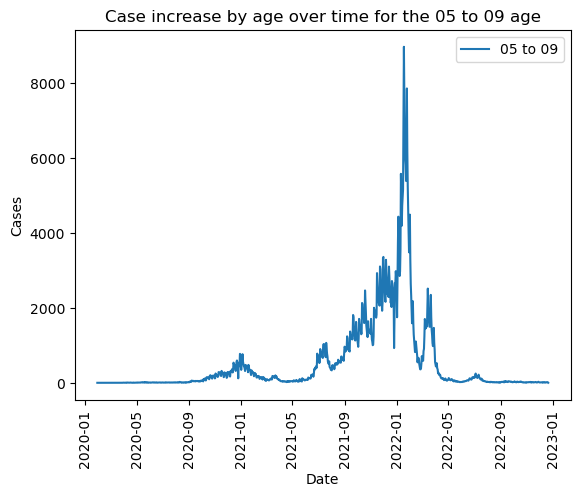

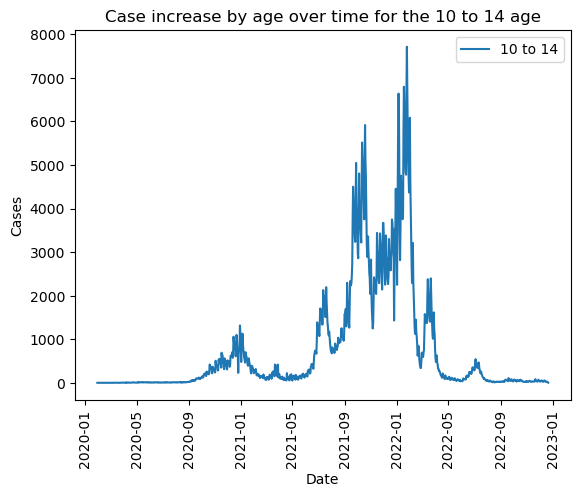

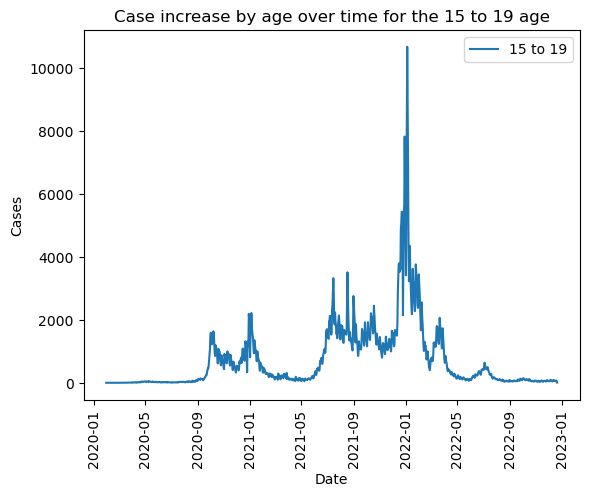

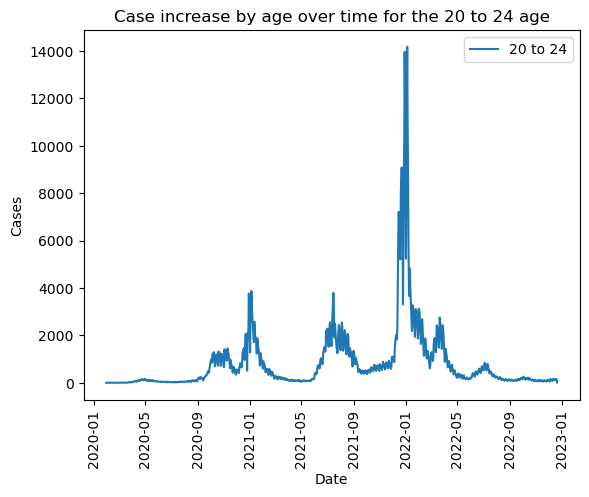

...

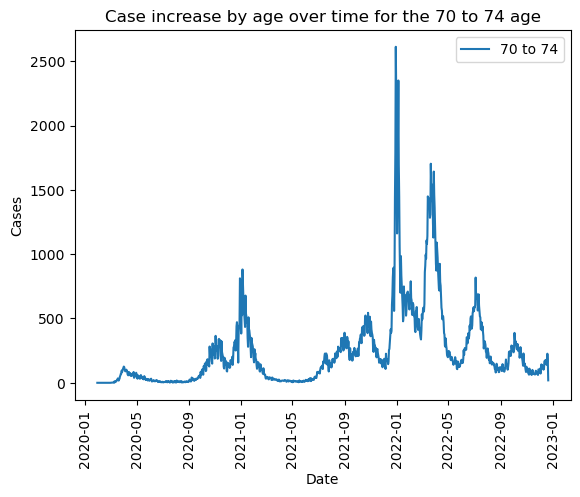

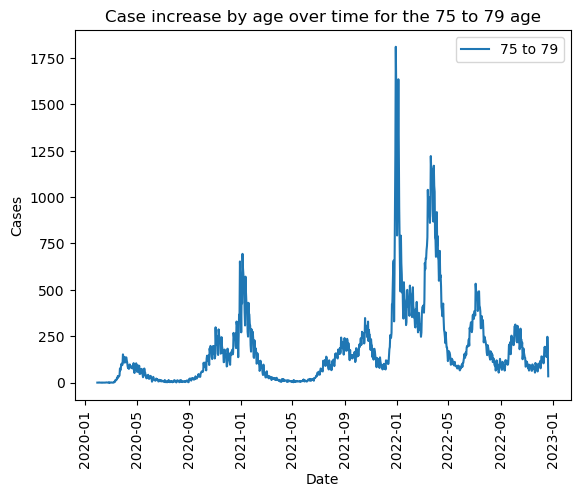

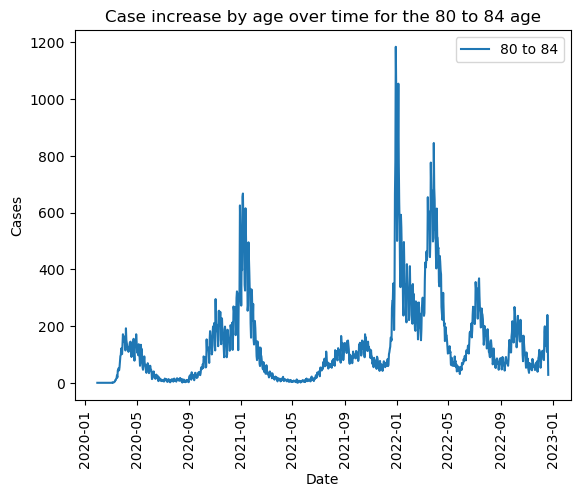

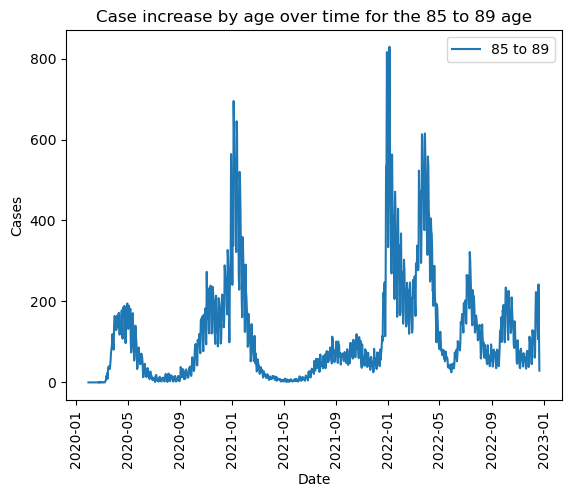

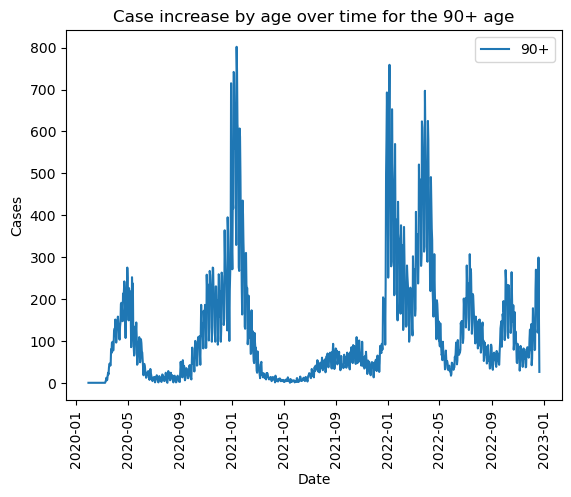

In [560]:
# Loop through each age
for femaleCasesAgeName in femaleCasesAge["Age"].unique():
    # Filter for the current age
    femaleCasesAgeData = femaleCasesAge[femaleCasesAge["Age"] == femaleCasesAgeName]
    
    # Plot the case increase against date for the current age
    plt.plot(femaleCasesAgeData["Date"], femaleCasesAgeData["Cases Increase"], label=femaleCasesAgeName)
    
    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Cases")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Case increase by age over time for the {} age".format(femaleCasesAgeName))
    
    # Show the plot
    plt.show()

#### Regional Proportion of Female Cases

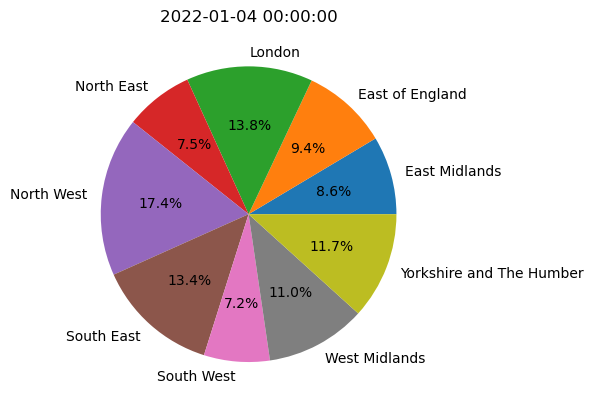

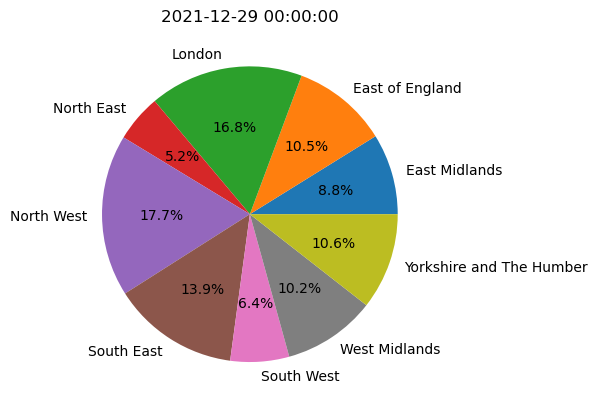

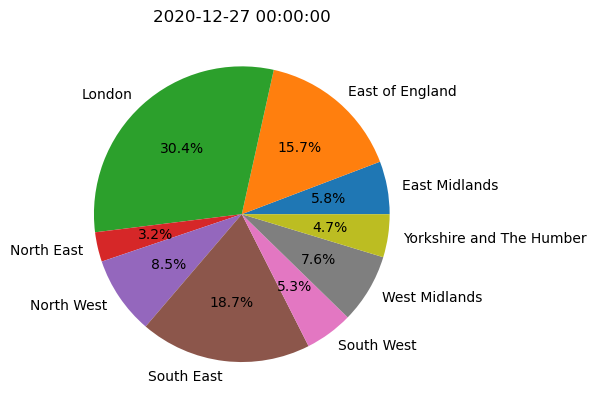

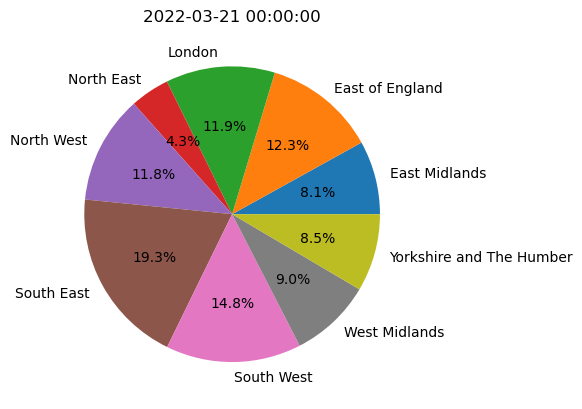

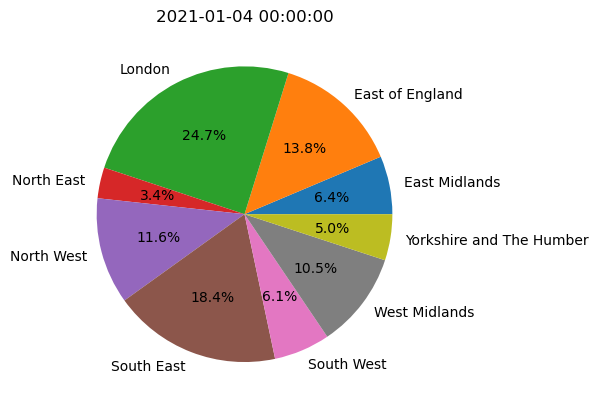

In [561]:
# Calculate the rolling mean of case increase and add to a new column
femaleCasesRegion["Rolling Mean"] = femaleCasesRegion["Cases Increase"].rolling(7).mean()

# Group the data by month and find the peak number of case increase for each month
maxCasesPerMonth = femaleCasesRegion.groupby(femaleCasesRegion["Date"].dt.strftime("%Y-%m"))["Cases Increase"].max()

# Sort the values in descending order
maxCasesPerMonth = maxCasesPerMonth.sort_values(ascending=False)

# Get the five highest months
top5Months = maxCasesPerMonth.head(5).index.tolist()

# Loop through each month
for month in top5Months:
    # Create a copy of the data for that month
    month2 = femaleCasesRegion[femaleCasesRegion["Date"].dt.strftime("%Y-%m") == month].copy()
    
    # Calculate the percentage increase in cases and add to a new column
    month2.loc[:, "Percentage Increase"] = month2["Cases Increase"] / month2["Cases Increase"].sum()
    
    # Find the peak date and add to a new column
    month2.loc[:, "Peak"] = (month2["Rolling Mean"].diff(1) > 0) & (month2["Rolling Mean"].diff(-1) > 0)
    
    # Get the peak date
    peakDate = month2[month2["Peak"]].sort_values("Cases Increase", ascending=False)["Date"].iloc[0]
    
    # Plot a pie chart for the percentage increase in cases on each peak date
    plt.pie(month2[month2["Date"] == peakDate]["Percentage Increase"], labels=month2[month2["Date"] == peakDate]["Region"], autopct="%1.1f%%")
    
    # Configure the layout of the plot
    plt.title(str(peakDate))
    
    # Show the plot
    plt.show()

#### Age Proportion of Female Cases

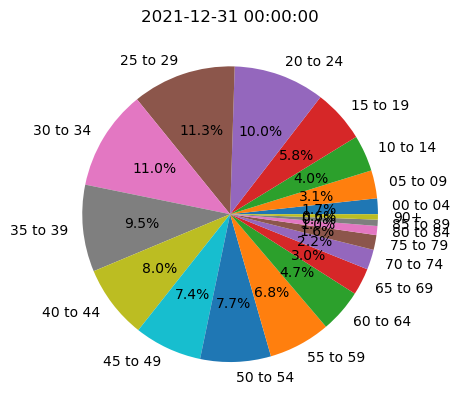

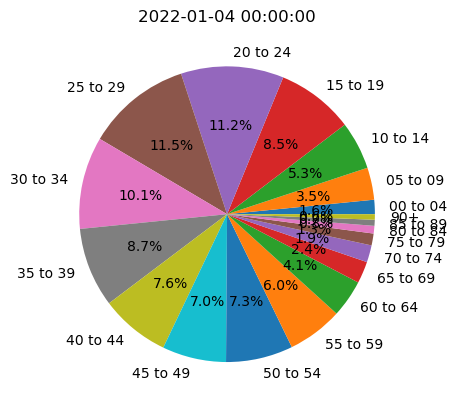

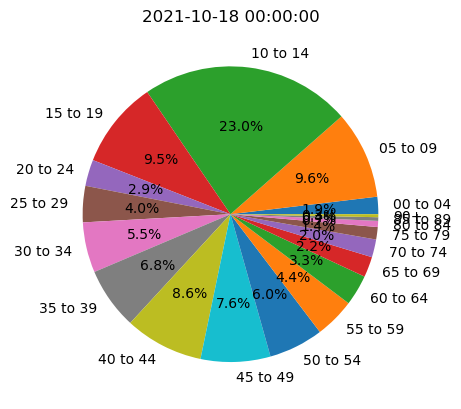

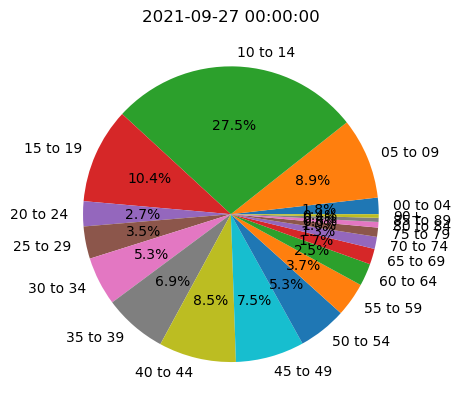

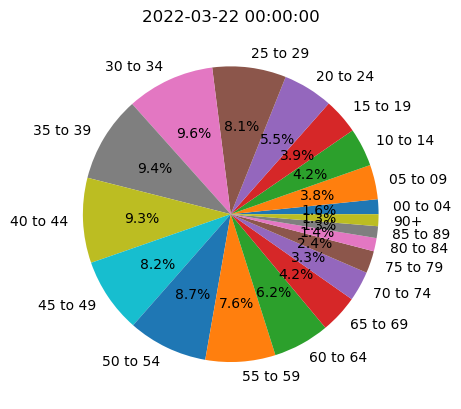

In [562]:
# Calculate the rolling mean of case increase and add to a new column
femaleCasesAge["Rolling Mean"] = femaleCasesAge["Cases Increase"].rolling(7).mean()

# Group the data by month and find the peak number of case increase for each month
maxCasesPerMonth = femaleCasesAge.groupby(femaleCasesAge["Date"].dt.strftime("%Y-%m"))["Cases Increase"].max()

# Sort the values in descending order
maxCasesPerMonth = maxCasesPerMonth.sort_values(ascending=False)

# Get the five highest months
top5Months = maxCasesPerMonth.head(5).index.tolist()

# Loop through each month
for month in top5Months:
    # Create a copy of the data for that month
    month2 = femaleCasesAge[femaleCasesAge["Date"].dt.strftime("%Y-%m") == month].copy()
    
    # Calculate the percentage increase in cases and add to a new column
    month2.loc[:, "Percentage Increase"] = month2["Cases Increase"] / month2["Cases Increase"].sum()
    
    # Find the peak date and add to a new column
    month2.loc[:, "Peak"] = (month2["Rolling Mean"].diff(1) > 0) & (month2["Rolling Mean"].diff(-1) > 0)
    
    # Get the peak date
    peakDate = month2[month2["Peak"]].sort_values("Cases Increase", ascending=False)["Date"].iloc[0]
    
    # Plot a pie chart for the percentage increase in cases on each peak date
    plt.pie(month2[month2["Date"] == peakDate]["Percentage Increase"], labels=month2[month2["Date"] == peakDate]["Age"], autopct="%1.1f%%")
    
    # Configure the layout of the plot
    plt.title(str(peakDate))
    
    # Show the plot
    plt.show()

### General Cases Data Analysis

#### Regional Distribution of General Cases

##### Grouping the cases by region

In [563]:
# Group by region and date
generalCasesRegionGroup = generalCases1.groupby(["Region", "Date"]).sum()

# Reset index
generalCasesRegion = generalCasesRegionGroup.reset_index()

# Output DataFrame
generalCasesRegion

C:\Users\chukl\AppData\Local\Temp\ipykernel_14668\75651826.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  generalCasesRegionGroup = generalCases1.groupby(["Region", "Date"]).sum()


,Region,Date,Cases
0,East Midlands,2020-04-17,4780
1,East Midlands,2020-04-18,4918
2,East Midlands,2020-04-19,5154
3,East Midlands,2020-04-20,5251
4,East Midlands,2020-04-21,5371
...,...,...,...
8815,Yorkshire and The Humber,2022-12-18,1959665
8816,Yorkshire and The Humber,2022-12-19,1959665
8817,Yorkshire and The Humber,2022-12-20,1959665
8818,Yorkshire and The Humber,2022-12-21,1959665


##### Adding an increase column

In [564]:
# Calculate increase in cases over time for each region and add to a new column
generalCasesRegion['Cases Increase'] = generalCasesRegion.groupby('Region').Cases.diff().where(generalCasesRegion['Region'] == generalCasesRegion['Region'].shift(), 0).fillna(0)

# Output DataFrame
generalCasesRegion

,Region,Date,Cases,Cases Increase
0,East Midlands,2020-04-17,4780,0.0
1,East Midlands,2020-04-18,4918,138.0
2,East Midlands,2020-04-19,5154,236.0
3,East Midlands,2020-04-20,5251,97.0
4,East Midlands,2020-04-21,5371,120.0
...,...,...,...,...
8815,Yorkshire and The Humber,2022-12-18,1959665,0.0
8816,Yorkshire and The Humber,2022-12-19,1959665,0.0
8817,Yorkshire and The Humber,2022-12-20,1959665,0.0
8818,Yorkshire and The Humber,2022-12-21,1959665,0.0


##### Plotting a comparison graph for the cases over time

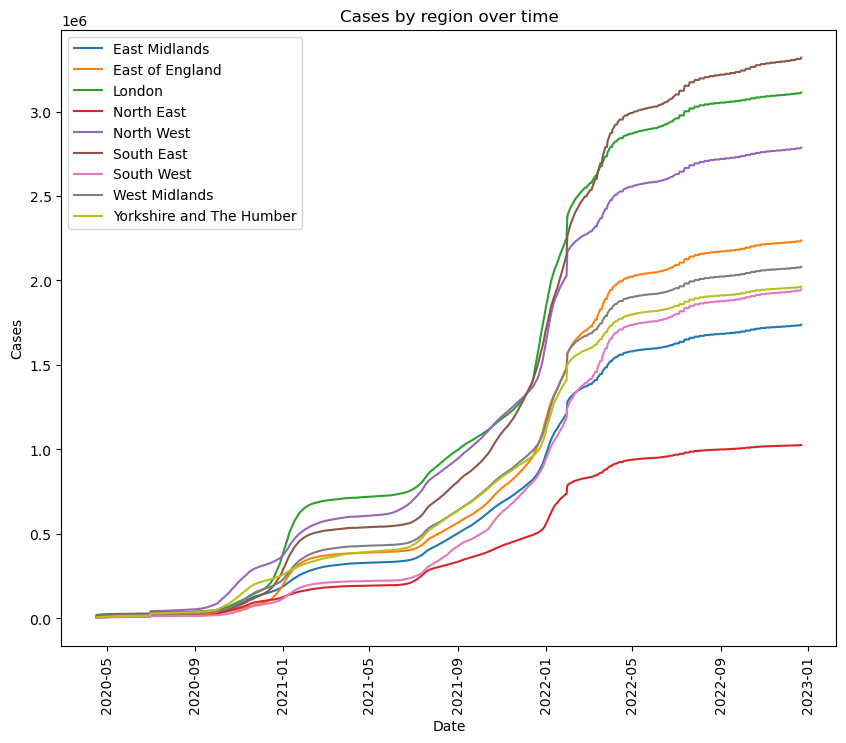

In [565]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for generalCasesRegionName in generalCasesRegion["Region"].unique():
    # Filter for the current region
    generalCasesRegionData = generalCasesRegion[generalCasesRegion["Region"] == generalCasesRegionName]
    
    # Plot the cases against date for the current region
    plt.plot(generalCasesRegionData["Date"], generalCasesRegionData["Cases"], label=generalCasesRegionName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Cases")
plt.legend()
plt.xticks(rotation=90)
plt.title("Cases by region over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the cases over time

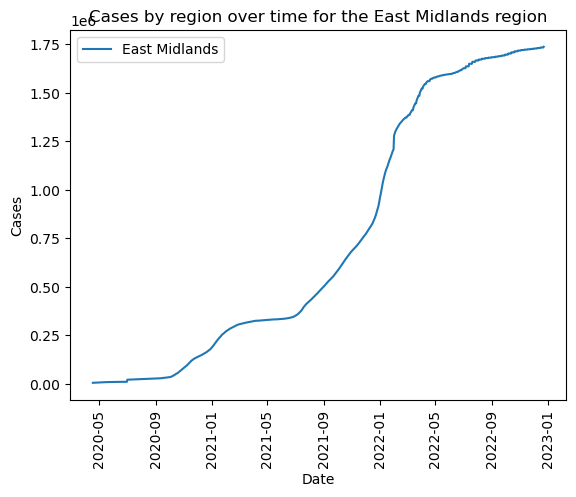

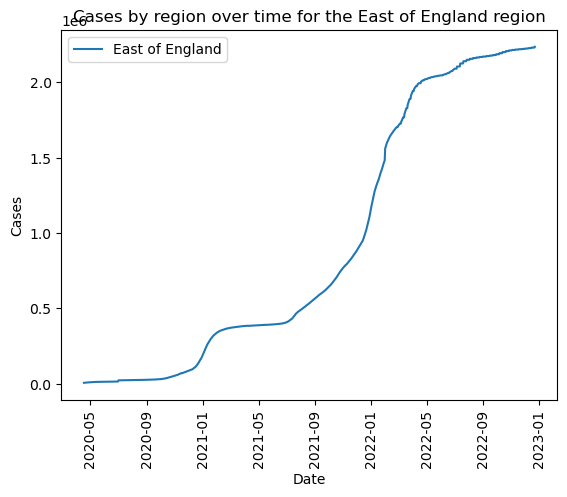

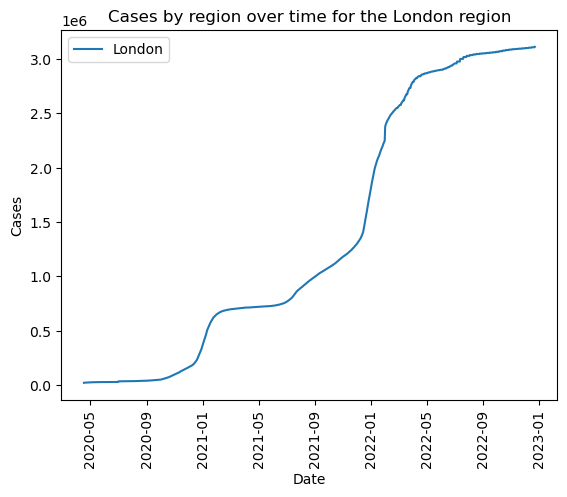

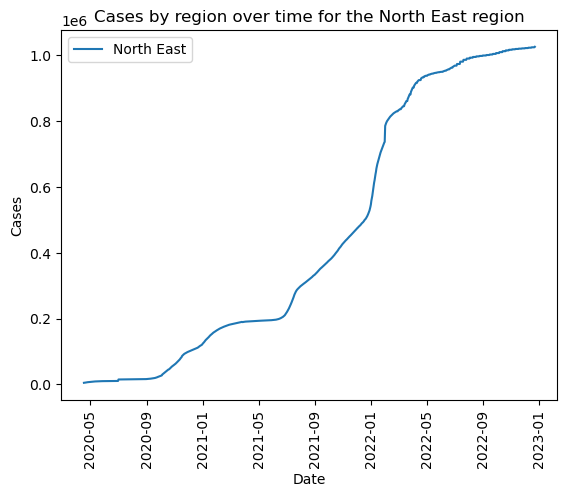

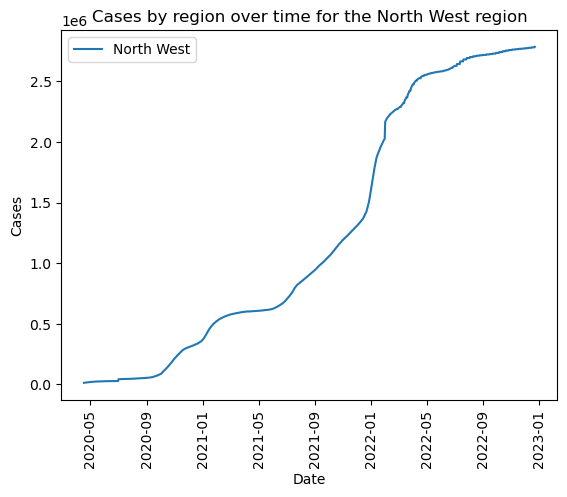

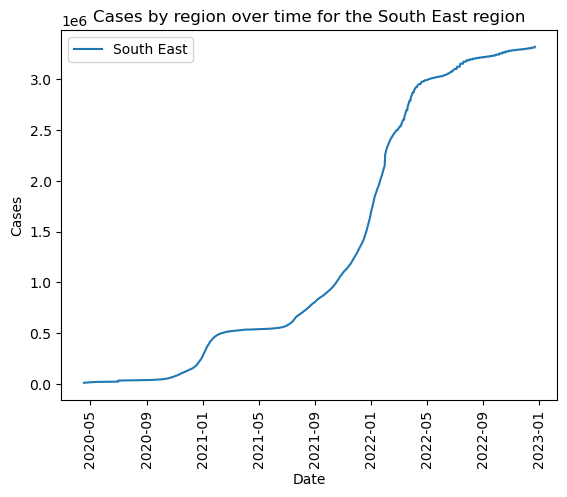

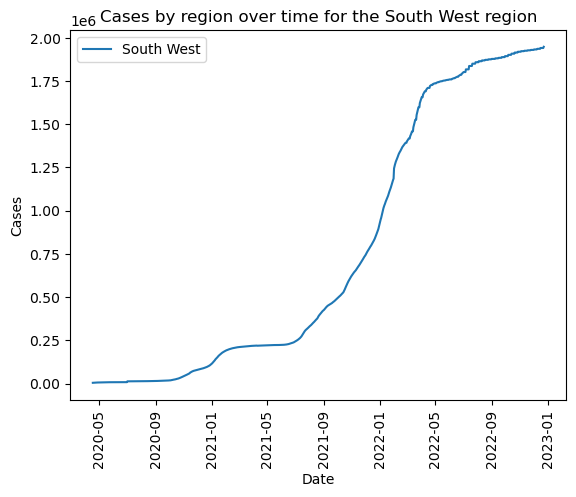

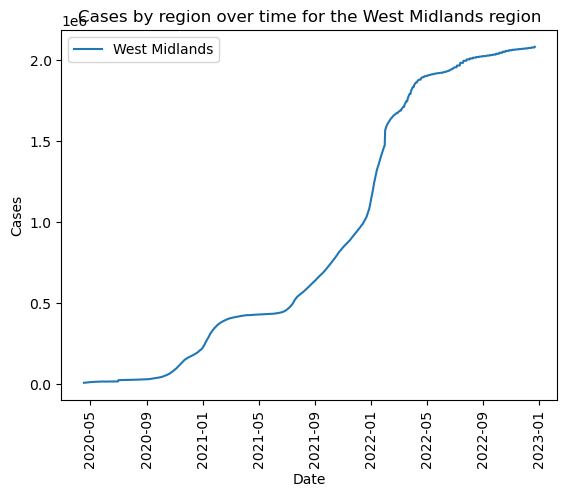

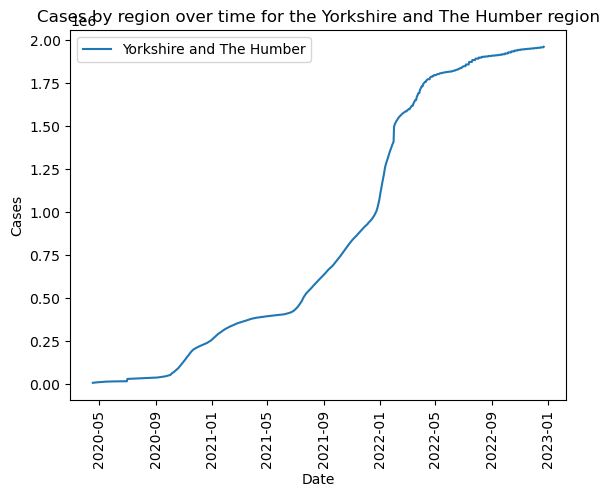

In [566]:
# Loop through each region
for generalCasesRegionName in generalCasesRegion["Region"].unique():
    # Filter for the current region
    generalCasesRegionData = generalCasesRegion[generalCasesRegion["Region"] == generalCasesRegionName]
    
    # Plot the cases against date for the current region
    plt.plot(generalCasesRegionData["Date"], generalCasesRegionData["Cases"], label=generalCasesRegionName)
    
    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Cases")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Cases by region over time for the {} region".format(generalCasesRegionName))
    
    # Show the plot
    plt.show()

##### Plotting a comparison graph for the case increase over time

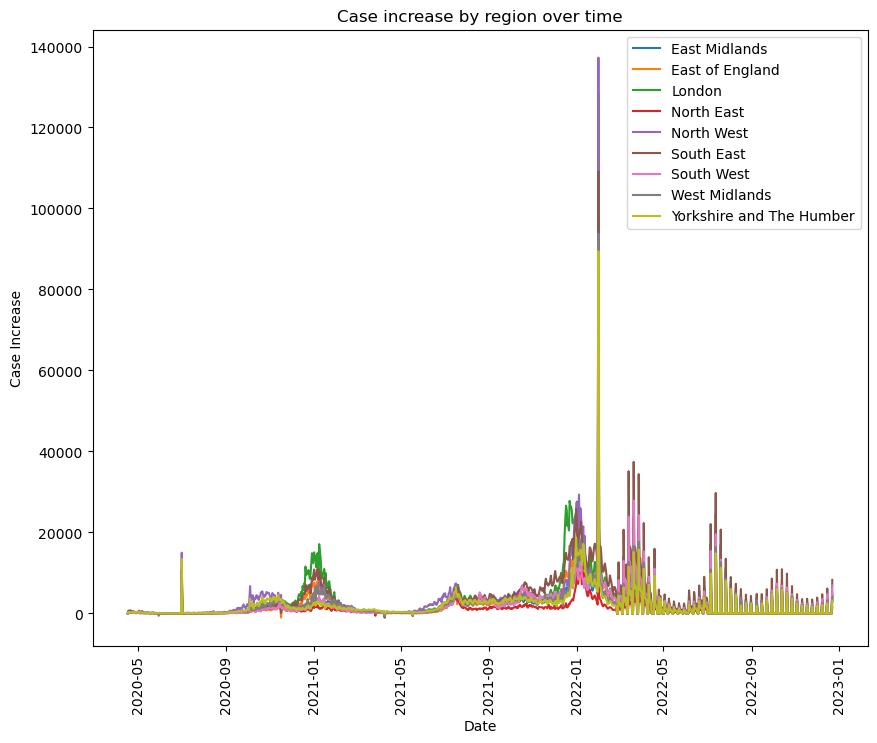

In [567]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for generalCasesRegionName in generalCasesRegion["Region"].unique():
    # Filter for the current region
    generalCasesRegionData = generalCasesRegion[generalCasesRegion["Region"] == generalCasesRegionName]
    
    # Plot the case increase against date for the current region
    plt.plot(generalCasesRegionData["Date"], generalCasesRegionData["Cases Increase"], label=generalCasesRegionName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Case Increase")
plt.legend()
plt.xticks(rotation=90)
plt.title("Case increase by region over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the case increase over time

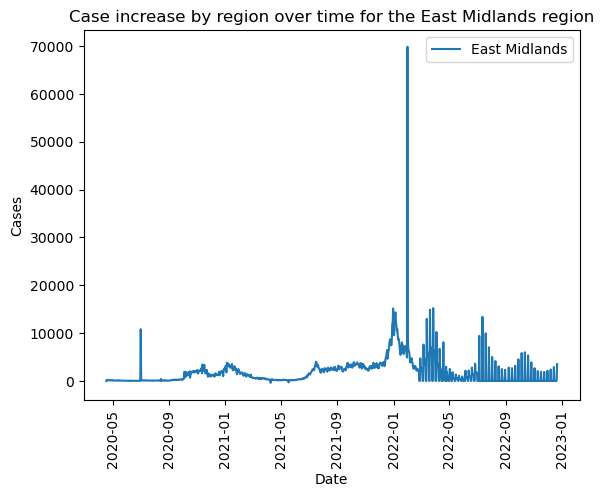

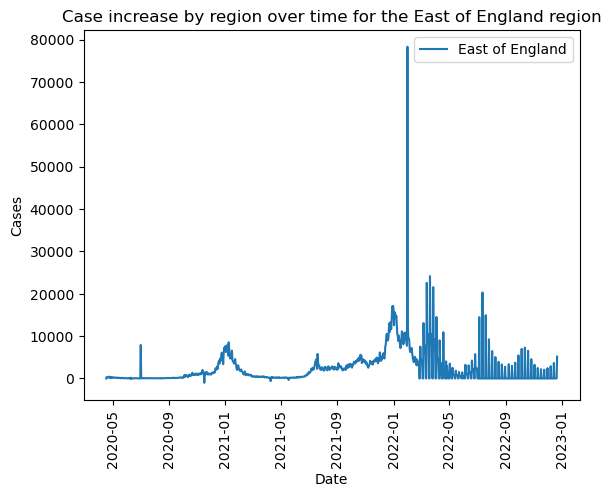

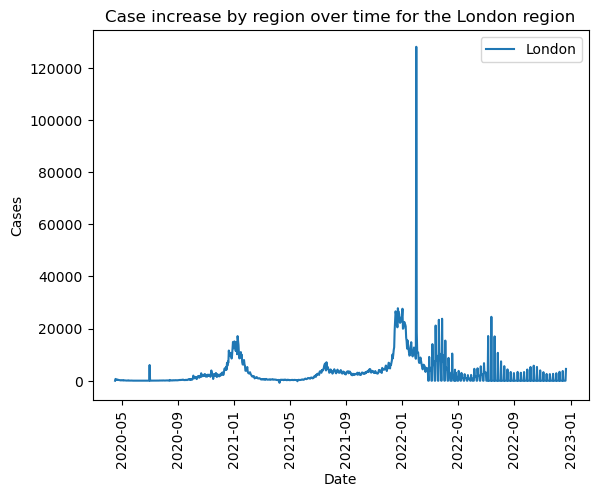

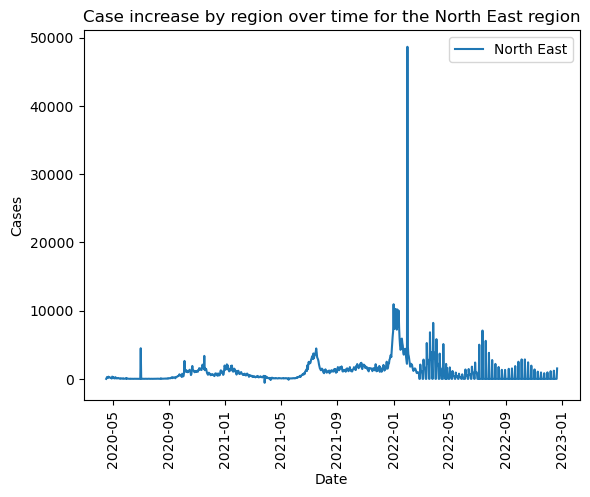

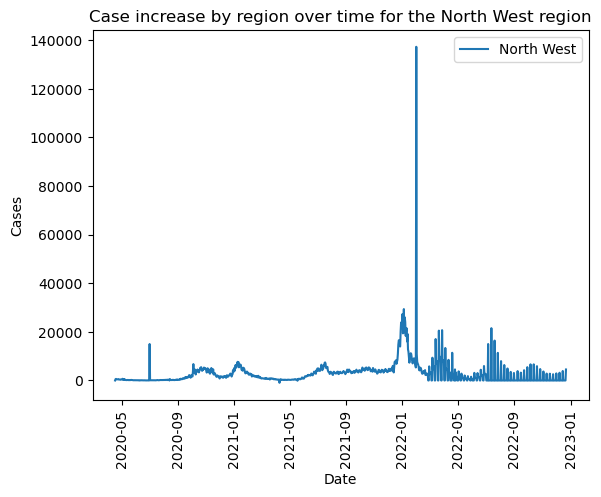

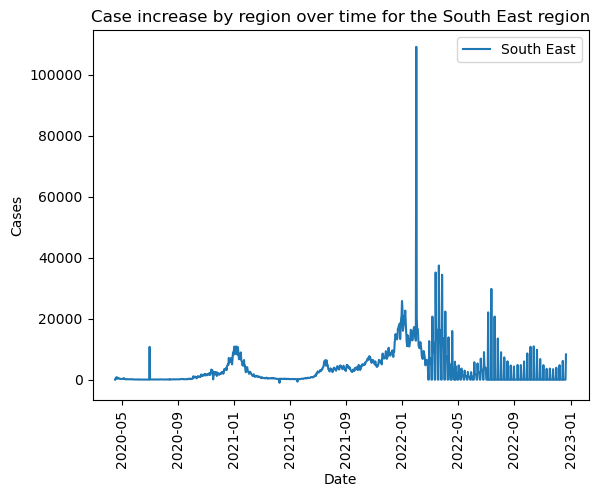

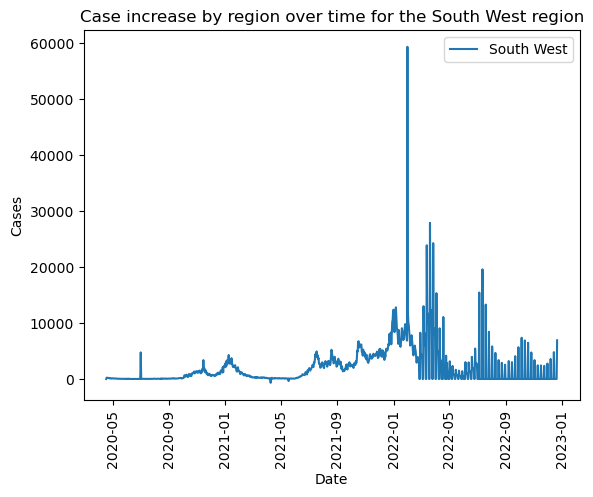

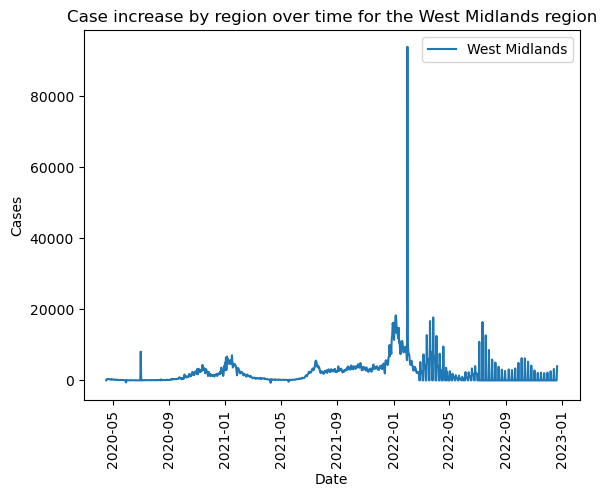

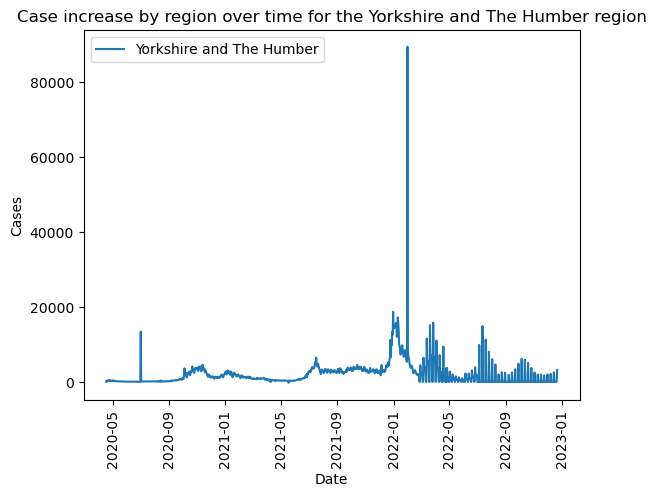

In [568]:
# Loop through each region
for generalCasesRegionName in generalCasesRegion["Region"].unique():
    # Filter for the current region
    generalCasesRegionData = generalCasesRegion[generalCasesRegion["Region"] == generalCasesRegionName]
    
    # Plot the case increase against date for the current region
    plt.plot(generalCasesRegionData["Date"], generalCasesRegionData["Cases Increase"], label=generalCasesRegionName)
    
    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Cases")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Case increase by region over time for the {} region".format(generalCasesRegionName))
    
    # Show the plot
    plt.show()

#### Regional Proportion of General Cases

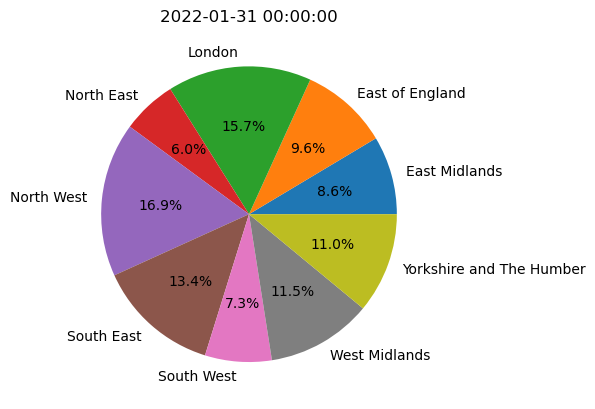

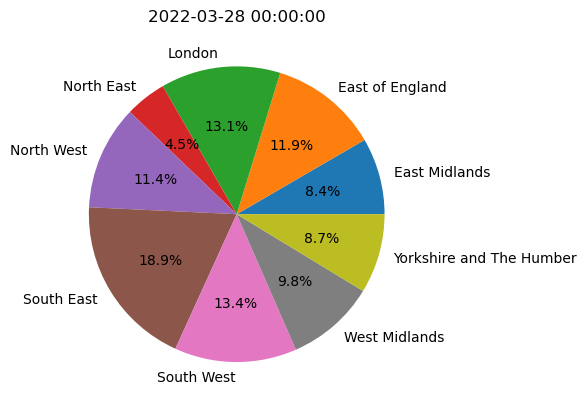

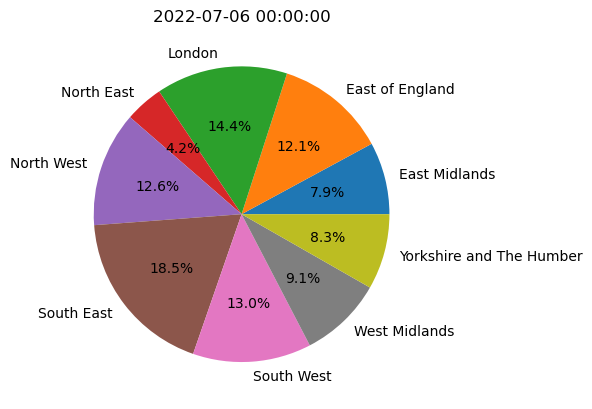

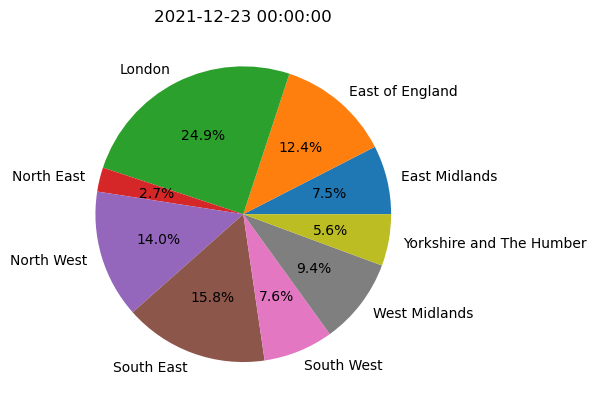

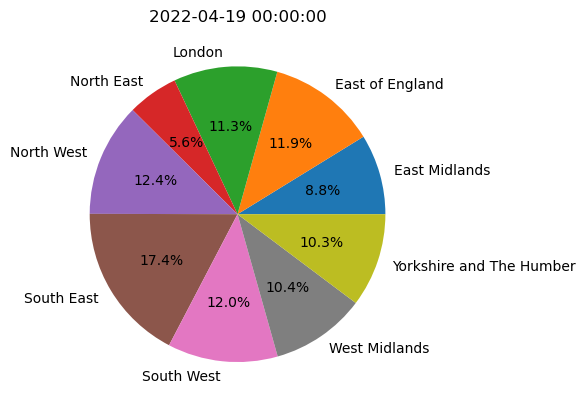

In [569]:
# Calculate the rolling mean of case increase and add to a new column
generalCasesRegion["Rolling Mean"] = generalCasesRegion["Cases Increase"].rolling(7).mean()

# Group the data by month and find the peak number of case increase for each month
maxCasesPerMonth = generalCasesRegion.groupby(generalCasesRegion["Date"].dt.strftime("%Y-%m"))["Cases Increase"].max()

# Sort the values in descending order
maxCasesPerMonth = maxCasesPerMonth.sort_values(ascending=False)

# Get the five highest months
top5Months = maxCasesPerMonth.head(5).index.tolist()

# Loop through each month
for month in top5Months:
    # Create a copy of the data for that month
    month2 = generalCasesRegion[generalCasesRegion["Date"].dt.strftime("%Y-%m") == month].copy()
    
    # Calculate the percentage increase in cases and add to a new column
    month2.loc[:, "Percentage Increase"] = month2["Cases Increase"] / month2["Cases Increase"].sum()
    
    # Find the peak date and add to a new column
    month2.loc[:, "Peak"] = (month2["Rolling Mean"].diff(1) > 0) & (month2["Rolling Mean"].diff(-1) > 0)
    
    # Get the peak date
    peakDate = month2[month2["Peak"]].sort_values("Cases Increase", ascending=False)["Date"].iloc[0]
    
    # Plot a pie chart for the percentage increase in cases on each peak date
    plt.pie(month2[month2["Date"] == peakDate]["Percentage Increase"], labels=month2[month2["Date"] == peakDate]["Region"], autopct="%1.1f%%")
    
    # Configure the layout of the plot
    plt.title(str(peakDate))
    
    # Show the plot
    plt.show()

### General Deaths Data Analysis

#### Regional Distribution of General Deaths

##### Grouping the deaths by region

In [570]:
# Group by region and date
generalDeathsRegionGroup = generalDeaths1.groupby(["Region", "Date"]).sum()

# Reset index
generalDeathsRegion = generalDeathsRegionGroup.reset_index()

# Output DataFrame
generalDeathsRegion

C:\Users\chukl\AppData\Local\Temp\ipykernel_14668\3249890154.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  generalDeathsRegionGroup = generalDeaths1.groupby(["Region", "Date"]).sum()


,Region,Date,Deaths
0,East Midlands,2020-03-11,1
1,East Midlands,2020-03-12,2
2,East Midlands,2020-03-13,3
3,East Midlands,2020-03-14,3
4,East Midlands,2020-03-15,3
...,...,...,...
9052,Yorkshire and The Humber,2022-11-28,18498
9053,Yorkshire and The Humber,2022-11-29,18503
9054,Yorkshire and The Humber,2022-11-30,18504
9055,Yorkshire and The Humber,2022-12-01,18508


##### Adding an increase column

In [571]:
# Calculate increase in deaths over time for each region and add to a new column
generalDeathsRegion['Deaths Increase'] = generalDeathsRegion.groupby('Region').Deaths.diff().where(generalDeathsRegion['Region'] == generalDeathsRegion['Region'].shift(), 0).fillna(0)

# Output DataFrame
generalDeathsRegion

,Region,Date,Deaths,Deaths Increase
0,East Midlands,2020-03-11,1,0.0
1,East Midlands,2020-03-12,2,1.0
2,East Midlands,2020-03-13,3,1.0
3,East Midlands,2020-03-14,3,0.0
4,East Midlands,2020-03-15,3,0.0
...,...,...,...,...
9052,Yorkshire and The Humber,2022-11-28,18498,1.0
9053,Yorkshire and The Humber,2022-11-29,18503,5.0
9054,Yorkshire and The Humber,2022-11-30,18504,1.0
9055,Yorkshire and The Humber,2022-12-01,18508,4.0


##### Plotting a comparison graph for the deaths over time

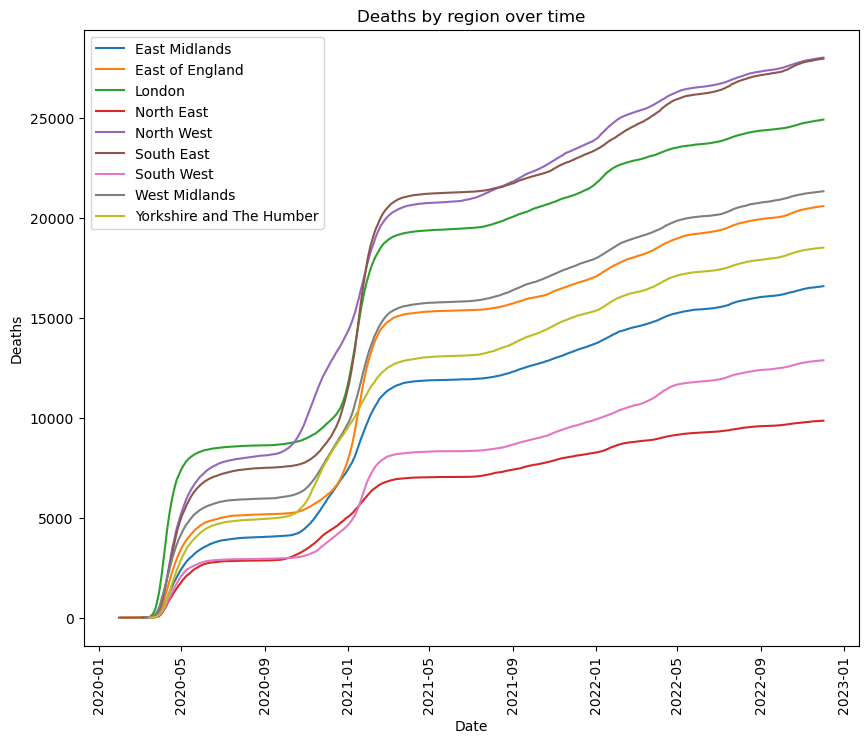

In [572]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for generalDeathsRegionName in generalDeathsRegion["Region"].unique():
    # Filter for the current region
    generalDeathsRegionData = generalDeathsRegion[generalDeathsRegion["Region"] == generalDeathsRegionName]
    
    # Plot the deaths against date for the current region
    plt.plot(generalDeathsRegionData["Date"], generalDeathsRegionData["Deaths"], label=generalDeathsRegionName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Deaths")
plt.legend()
plt.xticks(rotation=90)
plt.title("Deaths by region over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the deaths over time

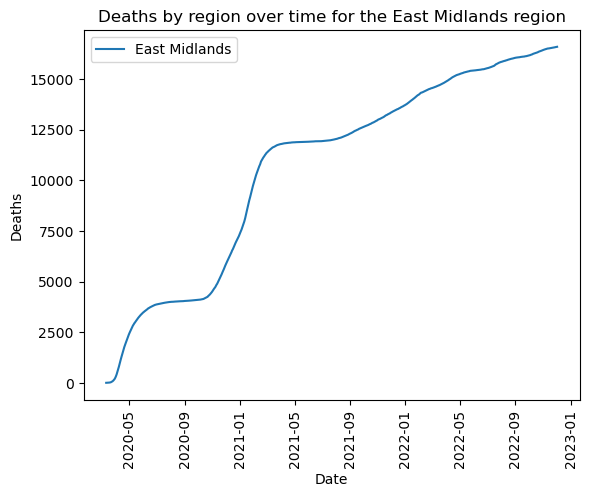

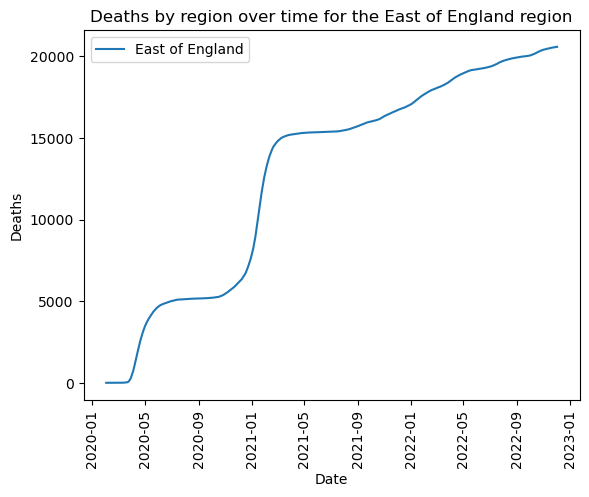

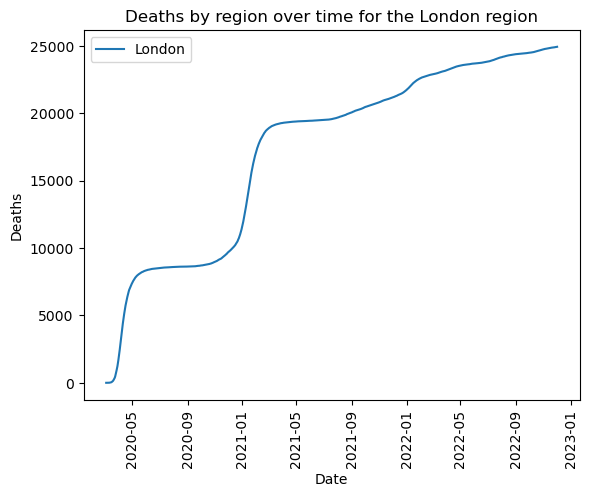

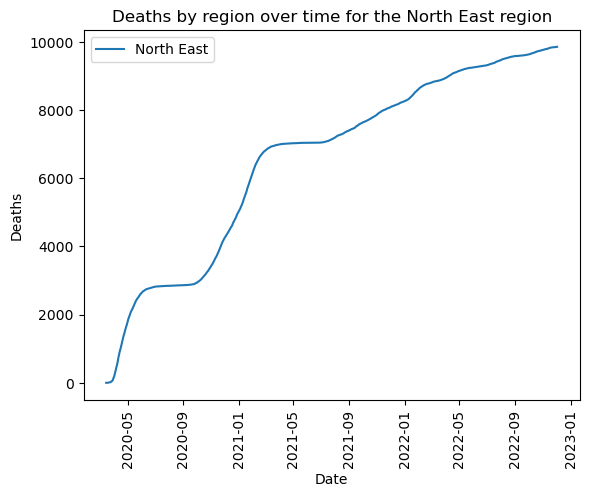

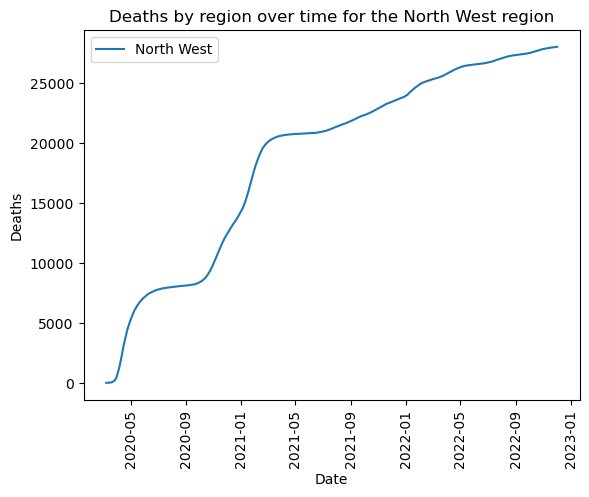

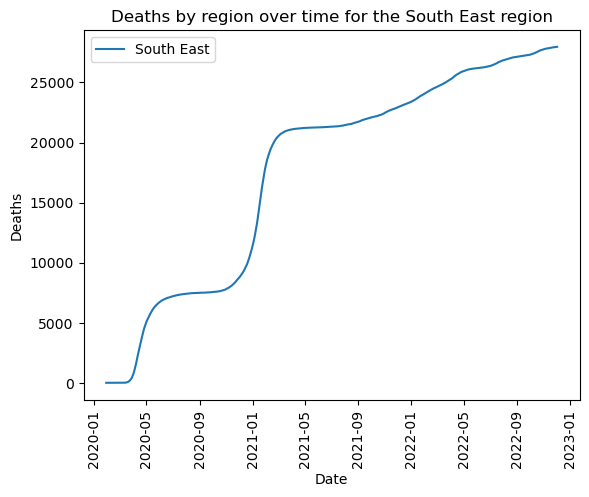

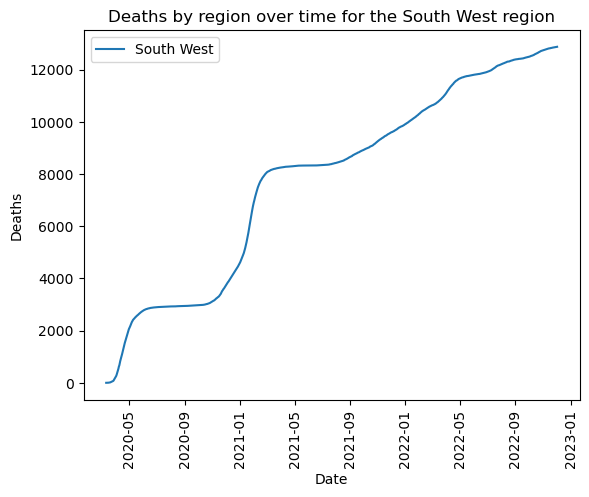

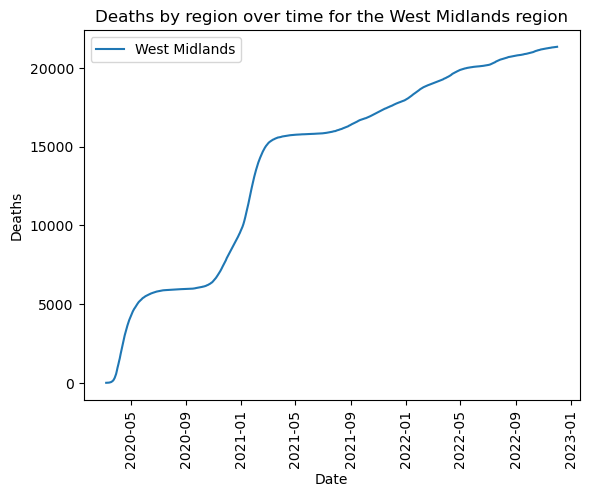

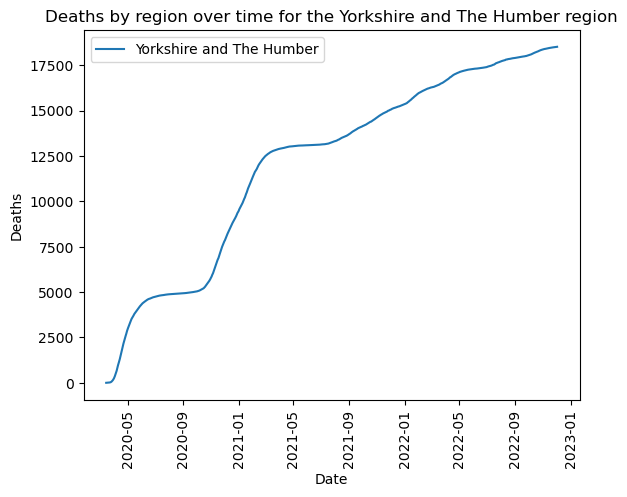

In [573]:
# Loop through each region
for generalDeathsRegionName in generalDeathsRegion["Region"].unique():
    # Filter for the current region
    generalDeathsRegionData = generalDeathsRegion[generalDeathsRegion["Region"] == generalDeathsRegionName]
    
    # Plot the deaths against date for the current region
    plt.plot(generalDeathsRegionData["Date"], generalDeathsRegionData["Deaths"], label=generalDeathsRegionName)
    
    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Deaths")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Deaths by region over time for the {} region".format(generalDeathsRegionName))
    
    # Show the plot
    plt.show()

##### Plotting a comparison graph for the death increase over time

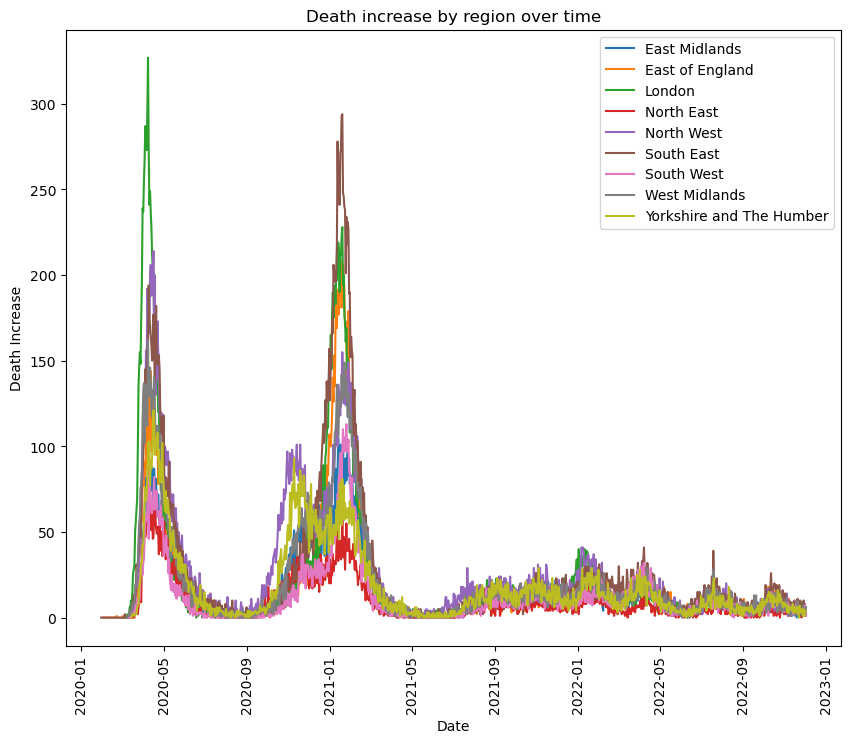

In [574]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for generalDeathsRegionName in generalDeathsRegion["Region"].unique():
    # Filter for the current region
    generalDeathsRegionData = generalDeathsRegion[generalDeathsRegion["Region"] == generalDeathsRegionName]
    
    # Plot the death increase against date for the current region
    plt.plot(generalDeathsRegionData["Date"], generalDeathsRegionData["Deaths Increase"], label=generalDeathsRegionName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Death Increase")
plt.legend()
plt.xticks(rotation=90)
plt.title("Death increase by region over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the death increase over time

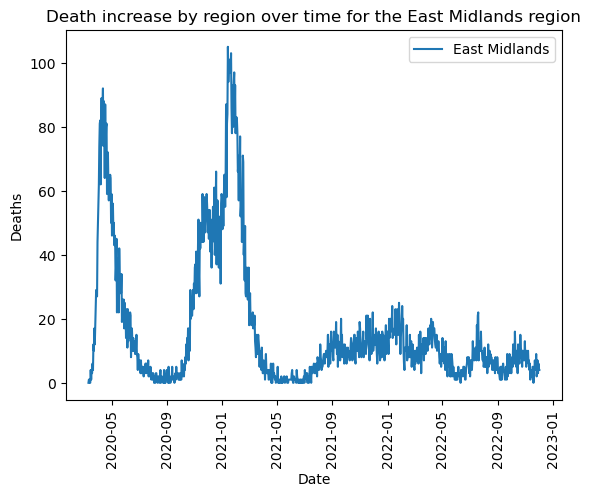

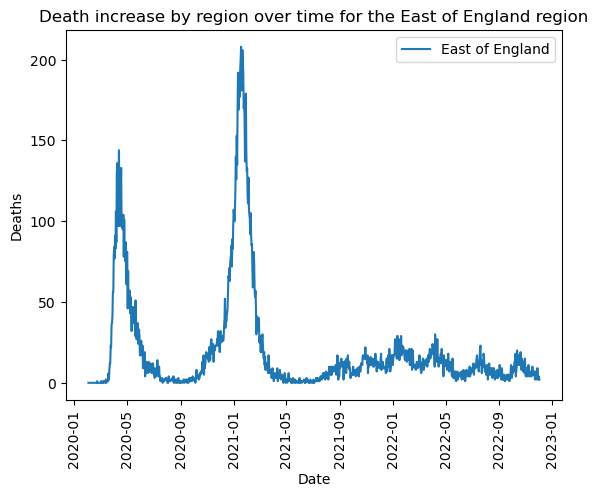

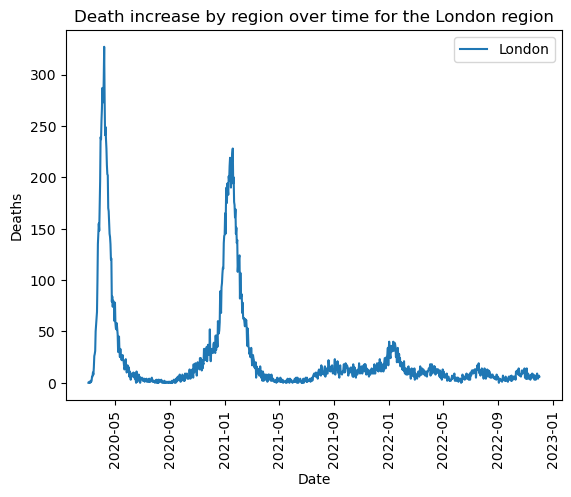

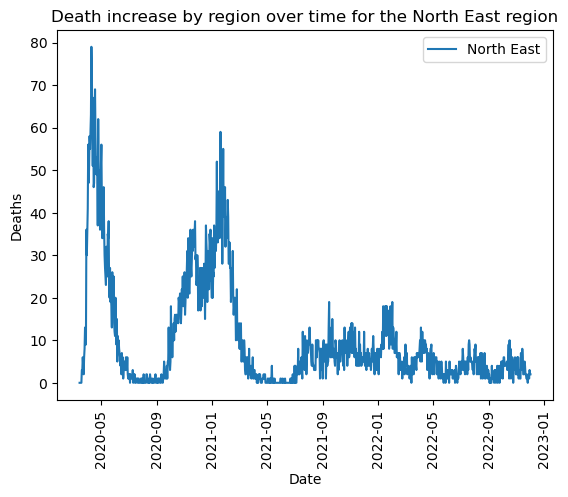

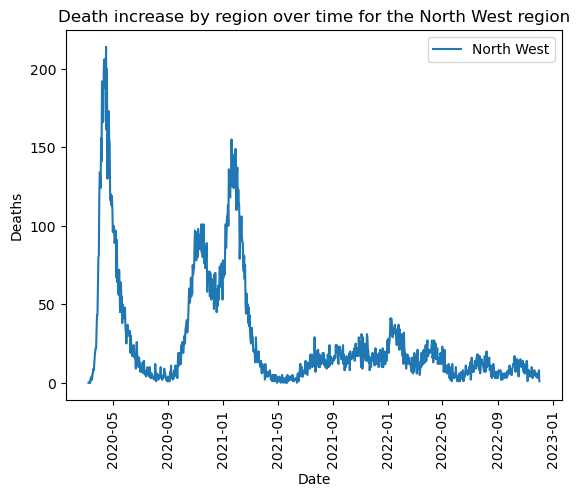

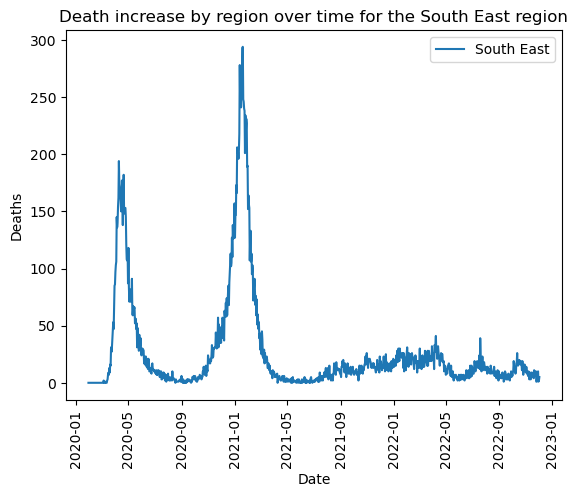

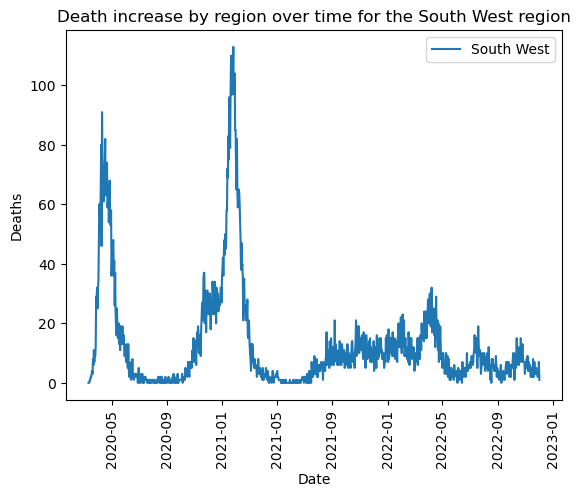

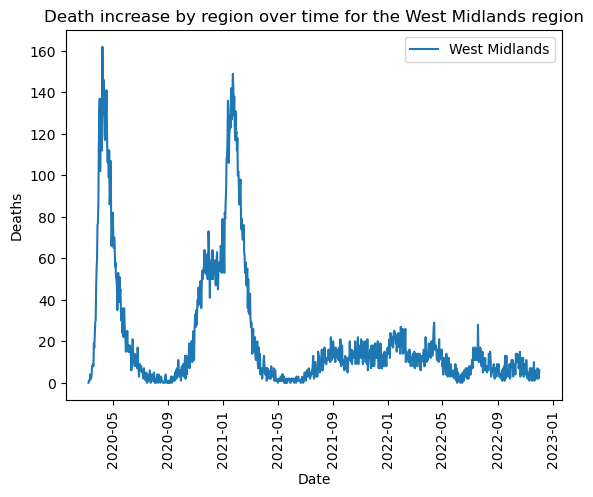

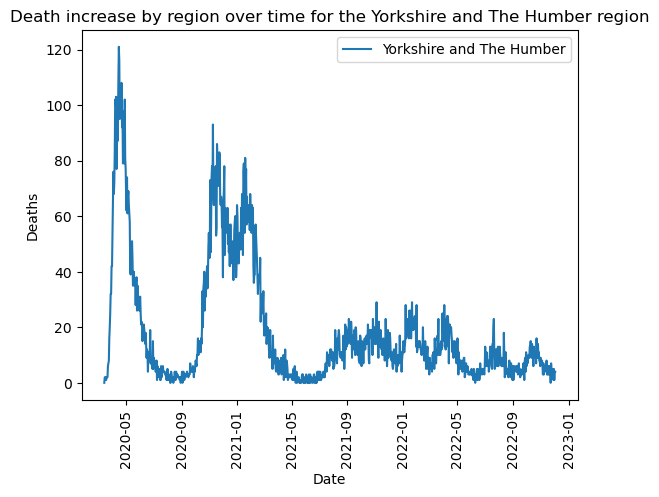

In [575]:
# Loop through each region
for generalDeathsRegionName in generalDeathsRegion["Region"].unique():
    # Filter for the current region
    generalDeathsRegionData = generalDeathsRegion[generalDeathsRegion["Region"] == generalDeathsRegionName]
    
    # Plot the death increase against date for the current region
    plt.plot(generalDeathsRegionData["Date"], generalDeathsRegionData["Deaths Increase"], label=generalDeathsRegionName)
    
    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Deaths")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Death increase by region over time for the {} region".format(generalDeathsRegionName))
    
    # Show the plot
    plt.show()

#### Regional Proportion of General Deaths

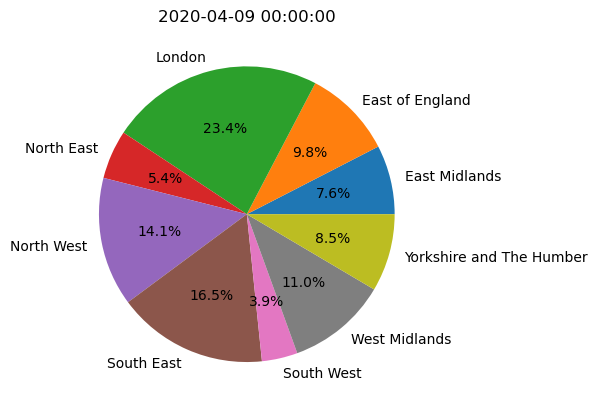

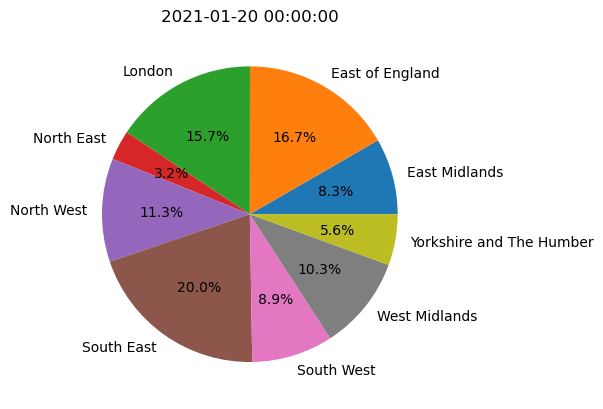

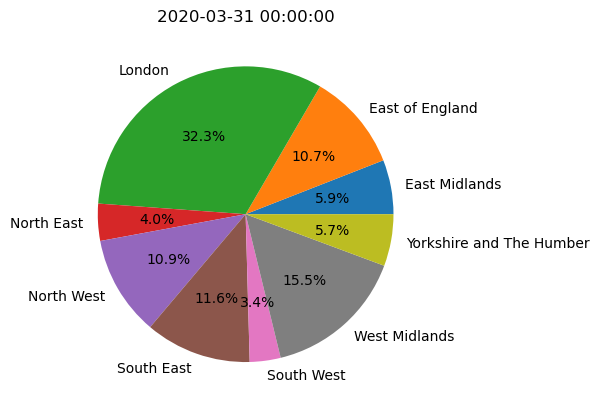

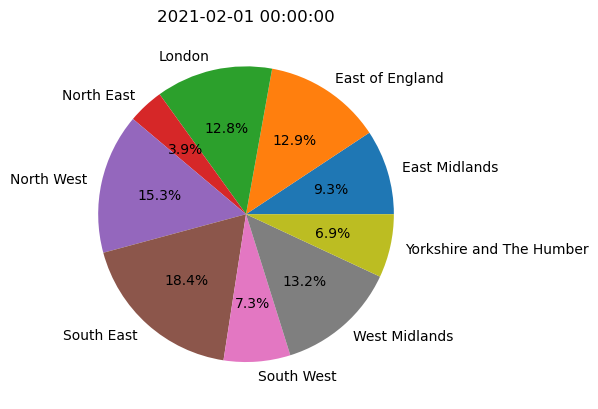

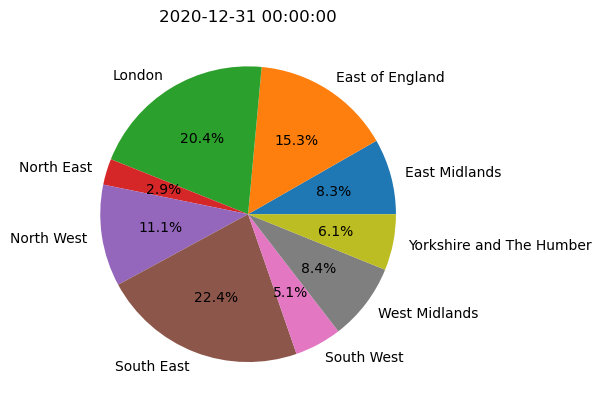

In [576]:
# Calculate the rolling mean of death increase and add to a new column
generalDeathsRegion["Rolling Mean"] = generalDeathsRegion["Deaths Increase"].rolling(7).mean()

# Group the data by month and find the peak number of death increase for each month
maxDeathsPerMonth = generalDeathsRegion.groupby(generalDeathsRegion["Date"].dt.strftime("%Y-%m"))["Deaths Increase"].max()

# Sort the values in descending order
maxDeathsPerMonth = maxDeathsPerMonth.sort_values(ascending=False)

# Get the five highest months
top5Months = maxDeathsPerMonth.head(5).index.tolist()

# Loop through each month
for month in top5Months:
    # Create a copy of the data for that month
    month2 = generalDeathsRegion[generalDeathsRegion["Date"].dt.strftime("%Y-%m") == month].copy()
    
    # Calculate the percentage increase in deaths and add to a new column
    month2.loc[:, "Percentage Increase"] = month2["Deaths Increase"] / month2["Deaths Increase"].sum()
    
    # Find the peak date and add to a new column
    month2.loc[:, "Peak"] = (month2["Rolling Mean"].diff(1) > 0) & (month2["Rolling Mean"].diff(-1) > 0)
    
    # Get the peak date
    peakDate = month2[month2["Peak"]].sort_values("Deaths Increase", ascending=False)["Date"].iloc[0]
    
    # Plot a pie chart for the percentage increase in deaths on each peak date
    plt.pie(month2[month2["Date"] == peakDate]["Percentage Increase"], labels=month2[month2["Date"] == peakDate]["Region"], autopct="%1.1f%%")
    
    # Configure the layout of the plot
    plt.title(str(peakDate))
    
    # Show the plot
    plt.show()

### Vaccinations Data Analysis

#### Remaking the cumulative columns

In [577]:
# Sort the DataFrame
vaccinations1 = vaccinations1.sort_values(["Region", "Age", "Date"])

# Remake the columns as the cumulative sum of new doses
vaccinations1["Total People Received First Dose"] = (vaccinations1.groupby(["Region", "Age"])["New People Received First Dose"]
                                          .cumsum())

vaccinations1["Total People Received Second Dose"] = (vaccinations1.groupby(["Region", "Age"])["New People Received Second Dose"]
                                          .cumsum())

vaccinations1["Total People Received Third Dose"] = (vaccinations1.groupby(["Region", "Age"])["New People Received Third Dose"]
                                          .cumsum())


#### Regional Distribution of Vaccinations

##### Grouping the vaccinations by region

In [578]:
# Group by region and date
vaccinationsRegionGroup = vaccinations1.groupby(["Region", "Date"]).sum()

# Reset index
vaccinationsRegion = vaccinationsRegionGroup.reset_index()

# Output DataFrame
vaccinationsRegion

C:\Users\chukl\AppData\Local\Temp\ipykernel_14668\3080434569.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  vaccinationsRegionGroup = vaccinations1.groupby(["Region", "Date"]).sum()


,Region,Date,Vaccine Register Population,Total People Received First Dose,New People Received First Dose,Total People Received Second Dose,New People Received Second Dose,Total People Received Third Dose,New People Received Third Dose
0,East Midlands,2020-08-12,4482624,768,768,8,8,0,0
1,East Midlands,2020-09-12,4482624,2299,1531,19,11,0,0
2,East Midlands,2020-10-12,4482624,3871,1572,28,9,1,1
3,East Midlands,2020-11-12,4482624,5278,1407,42,14,1,0
4,East Midlands,2020-12-12,4482624,6560,1282,42,0,1,0
...,...,...,...,...,...,...,...,...,...
6691,Yorkshire and The Humber,2022-12-17,5659638,4260396,68,4055549,159,3206726,107
6692,Yorkshire and The Humber,2022-12-18,5659638,4260439,43,4055621,72,3206769,43
6693,Yorkshire and The Humber,2022-12-19,5659638,4260465,26,4055667,46,3206858,89
6694,Yorkshire and The Humber,2022-12-20,5659638,4260495,30,4055702,35,3206975,117


##### Plotting a comparison graph for the once-vaccinated patients over time

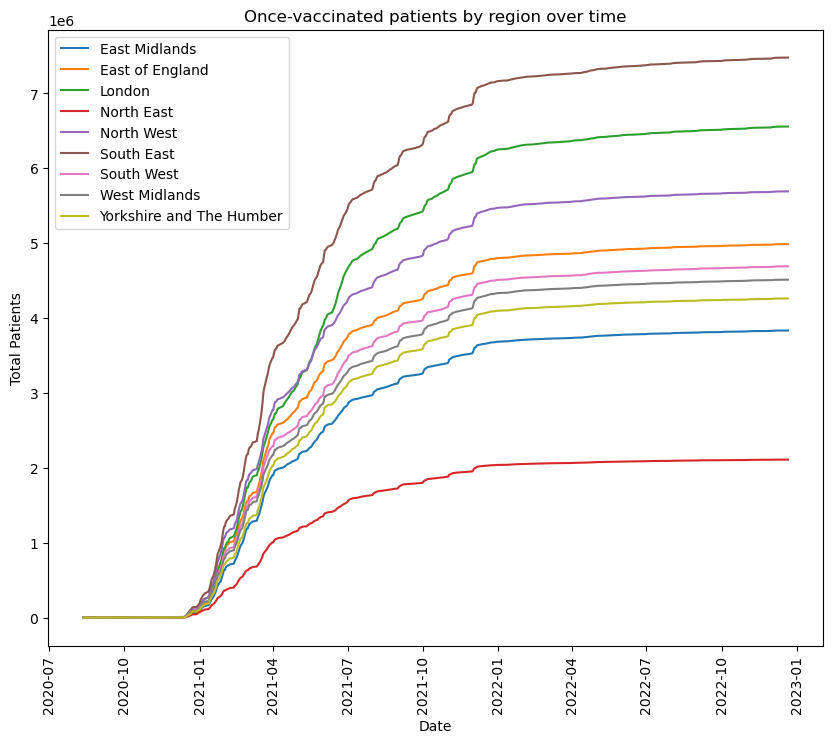

In [579]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for vaccinationsRegionName in vaccinationsRegion["Region"].unique():
    # Filter for the current region
    vaccinationsRegionData = vaccinationsRegion[vaccinationsRegion["Region"] == vaccinationsRegionName]
    
    # Plot the vaccinations against date for the current region
    plt.plot(vaccinationsRegionData["Date"], vaccinationsRegionData["Total People Received First Dose"], label=vaccinationsRegionName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Total Patients")
plt.legend()
plt.xticks(rotation=90)
plt.title("Once-vaccinated patients by region over time")

# Show the plot
plt.show()

##### Plotting a comparison graph for the twice-vaccinated patients over time

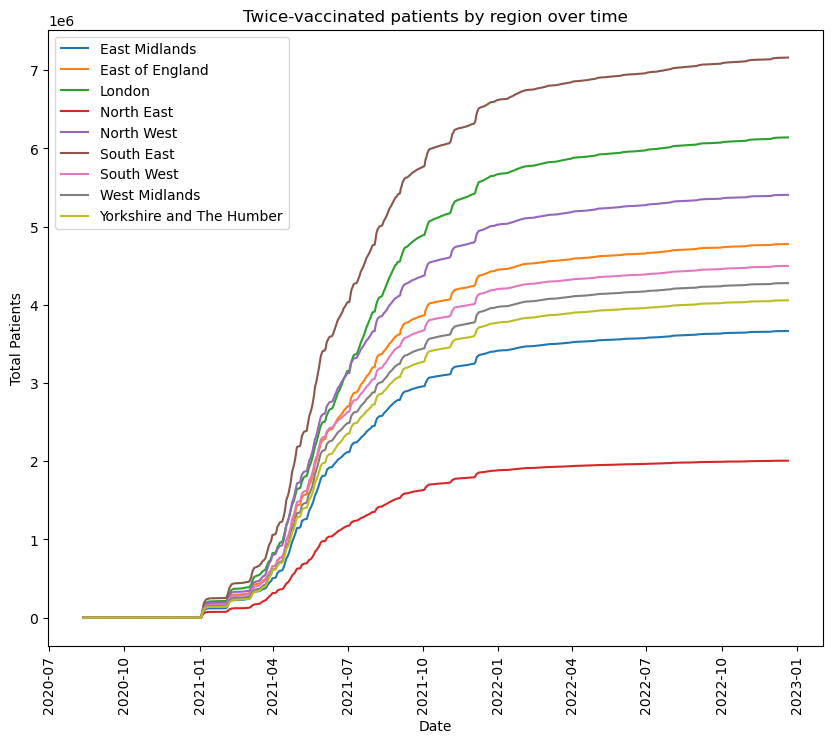

In [580]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for vaccinationsRegionName in vaccinationsRegion["Region"].unique():
    # Filter for the current region
    vaccinationsRegionData = vaccinationsRegion[vaccinationsRegion["Region"] == vaccinationsRegionName]
    
    # Plot the vaccinations against date for the current region
    plt.plot(vaccinationsRegionData["Date"], vaccinationsRegionData["Total People Received Second Dose"], label=vaccinationsRegionName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Total Patients")
plt.legend()
plt.xticks(rotation=90)
plt.title("Twice-vaccinated patients by region over time")

# Show the plot
plt.show()

##### Plotting a comparison graph for the thrice-vaccinated patients over time

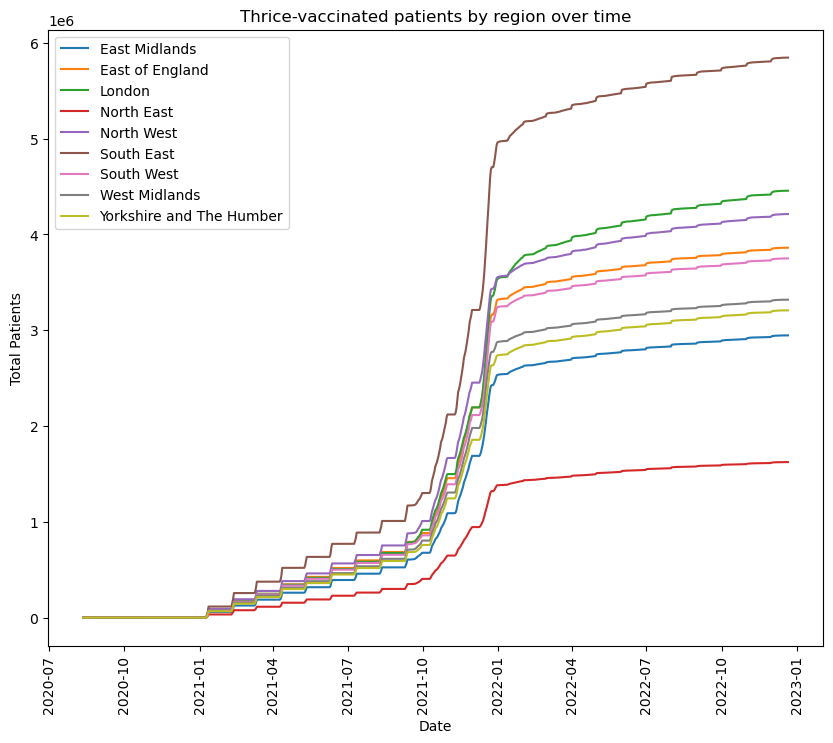

In [581]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for vaccinationsRegionName in vaccinationsRegion["Region"].unique():
    # Filter for the current region
    vaccinationsRegionData = vaccinationsRegion[vaccinationsRegion["Region"] == vaccinationsRegionName]
    
    # Plot the vaccinations against date for the current region
    plt.plot(vaccinationsRegionData["Date"], vaccinationsRegionData["Total People Received Third Dose"], label=vaccinationsRegionName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Total Patients")
plt.legend()
plt.xticks(rotation=90)
plt.title("Thrice-vaccinated patients by region over time")

# Show the plot
plt.show()

##### Plotting a comparison graph for the first dose increase over time

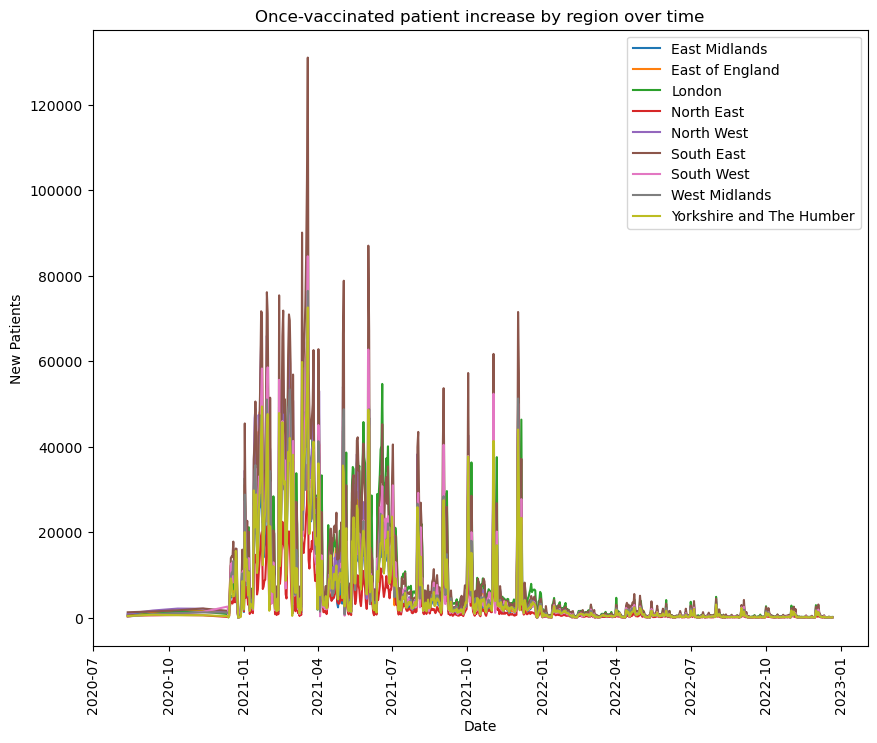

In [582]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for vaccinationsRegionName in vaccinationsRegion["Region"].unique():
    # Filter for the current region
    vaccinationsRegionData = vaccinationsRegion[vaccinationsRegion["Region"] == vaccinationsRegionName]
    
    # Plot the vaccinations against date for the current region
    plt.plot(vaccinationsRegionData["Date"], vaccinationsRegionData["New People Received First Dose"], label=vaccinationsRegionName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("New Patients")
plt.legend()
plt.xticks(rotation=90)
plt.title("Once-vaccinated patient increase by region over time")

# Show the plot
plt.show()

##### Plotting a comparison graph for the second dose increase over time

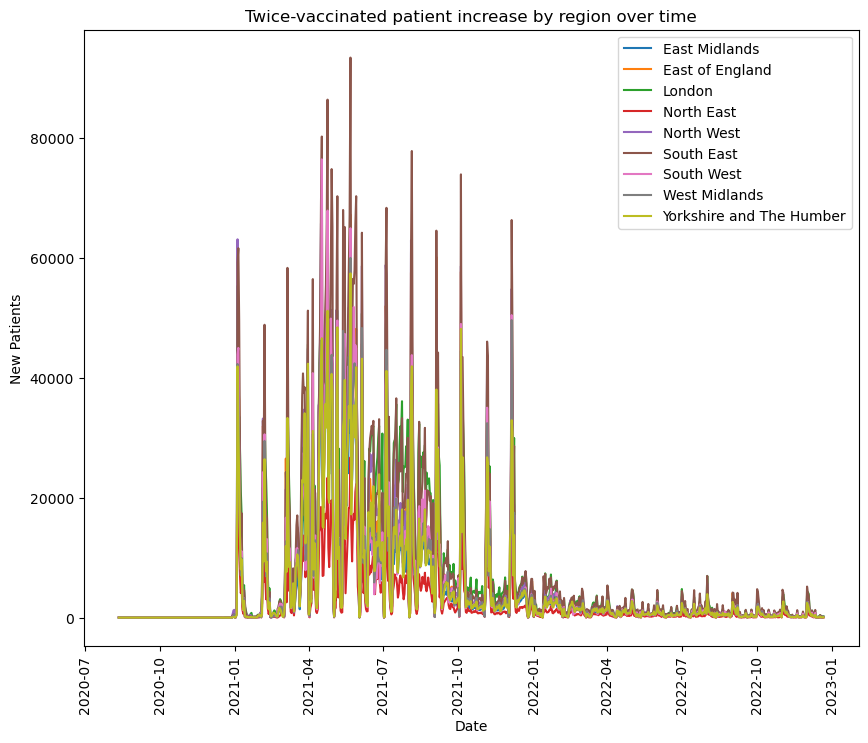

In [583]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for vaccinationsRegionName in vaccinationsRegion["Region"].unique():
    # Filter for the current region
    vaccinationsRegionData = vaccinationsRegion[vaccinationsRegion["Region"] == vaccinationsRegionName]
    
    # Plot the vaccinations against date for the current region
    plt.plot(vaccinationsRegionData["Date"], vaccinationsRegionData["New People Received Second Dose"], label=vaccinationsRegionName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("New Patients")
plt.legend()
plt.xticks(rotation=90)
plt.title("Twice-vaccinated patient increase by region over time")

# Show the plot
plt.show()

##### Plotting a comparison graph for the third dose increase over time

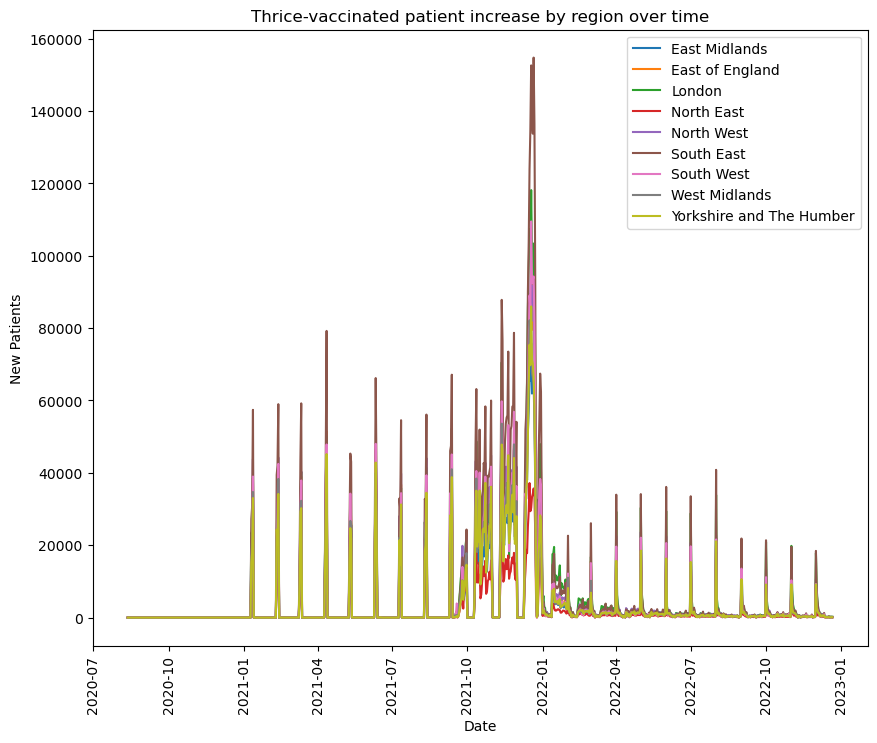

In [584]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for vaccinationsRegionName in vaccinationsRegion["Region"].unique():
    # Filter for the current region
    vaccinationsRegionData = vaccinationsRegion[vaccinationsRegion["Region"] == vaccinationsRegionName]
    
    # Plot the vaccinations against date for the current region
    plt.plot(vaccinationsRegionData["Date"], vaccinationsRegionData["New People Received Third Dose"], label=vaccinationsRegionName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("New Patients")
plt.legend()
plt.xticks(rotation=90)
plt.title("Thrice-vaccinated patient increase by region over time")

# Show the plot
plt.show()

#### Age Distribution of Vaccinations

##### Grouping the vaccinations by age

In [585]:
# Group by age and date
vaccinationsAgeGroup = vaccinations1.groupby(["Age", "Date"]).sum()

# Reset index
vaccinationsAge = vaccinationsAgeGroup.reset_index()

# Output DataFrame
vaccinationsAge

C:\Users\chukl\AppData\Local\Temp\ipykernel_14668\2644052492.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  vaccinationsAgeGroup = vaccinations1.groupby(["Age", "Date"]).sum()


,Age,Date,Vaccine Register Population,Total People Received First Dose,New People Received First Dose,Total People Received Second Dose,New People Received Second Dose,Total People Received Third Dose,New People Received Third Dose
0,05 to 11,2020-08-12,0,0,0,0,0,0,0
1,05 to 11,2020-09-12,0,0,0,0,0,0,0
2,05 to 11,2020-10-12,0,0,0,0,0,0,0
3,05 to 11,2020-11-12,0,0,0,0,0,0,0
4,05 to 11,2020-12-12,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
13387,90+,2022-12-17,531291,508036,0,505360,2,495389,3
13388,90+,2022-12-18,531291,508036,0,505361,1,495391,2
13389,90+,2022-12-19,531291,508040,4,505362,1,495399,8
13390,90+,2022-12-20,531291,508041,1,505365,3,495407,8


##### Plotting a comparison graph for the once-vaccinated patients over time

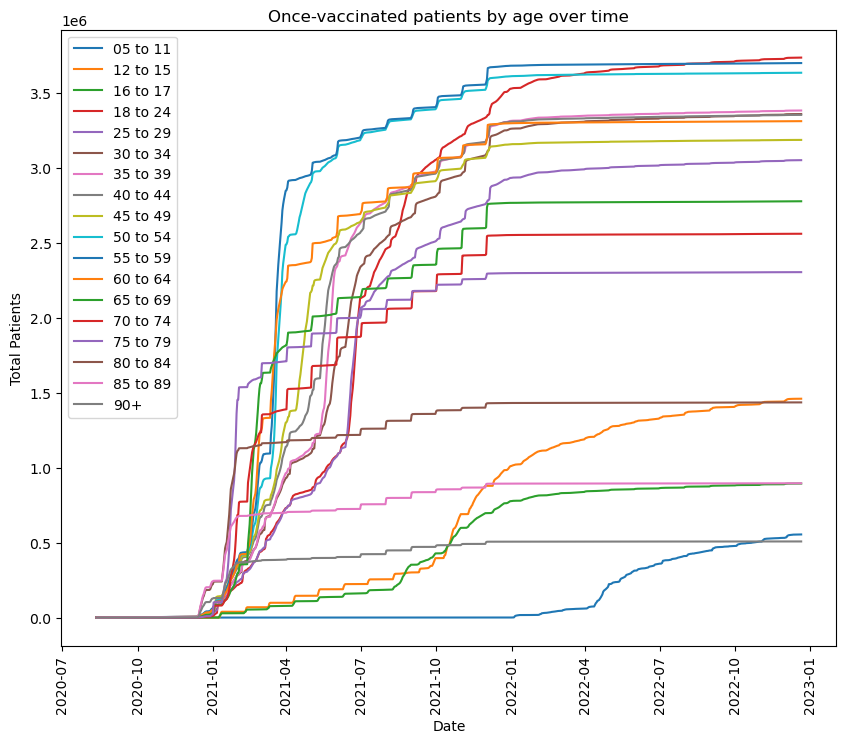

In [586]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each age
for vaccinationsAgeName in vaccinationsAge["Age"].unique():
    # Filter for the current age
    vaccinationsAgeData = vaccinationsAge[vaccinationsAge["Age"] == vaccinationsAgeName]
    
    # Plot the vaccinations against date for the current age
    plt.plot(vaccinationsAgeData["Date"], vaccinationsAgeData["Total People Received First Dose"], label=vaccinationsAgeName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Total Patients")
plt.legend()
plt.xticks(rotation=90)
plt.title("Once-vaccinated patients by age over time")

# Show the plot
plt.show()

##### Plotting a comparison graph for the twice-vaccinated patients over time

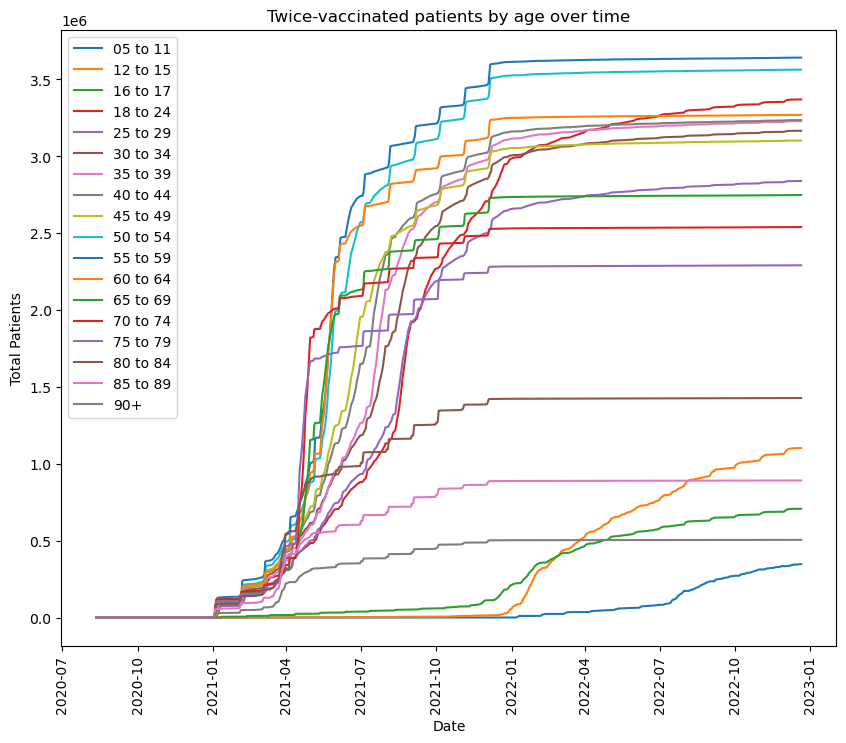

In [587]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each age
for vaccinationsAgeName in vaccinationsAge["Age"].unique():
    # Filter for the current age
    vaccinationsAgeData = vaccinationsAge[vaccinationsAge["Age"] == vaccinationsAgeName]
    
    # Plot the vaccinations against date for the current age
    plt.plot(vaccinationsAgeData["Date"], vaccinationsAgeData["Total People Received Second Dose"], label=vaccinationsAgeName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Total Patients")
plt.legend()
plt.xticks(rotation=90)
plt.title("Twice-vaccinated patients by age over time")

# Show the plot
plt.show()

##### Plotting a comparison graph for the thrice-vaccinated patients over time

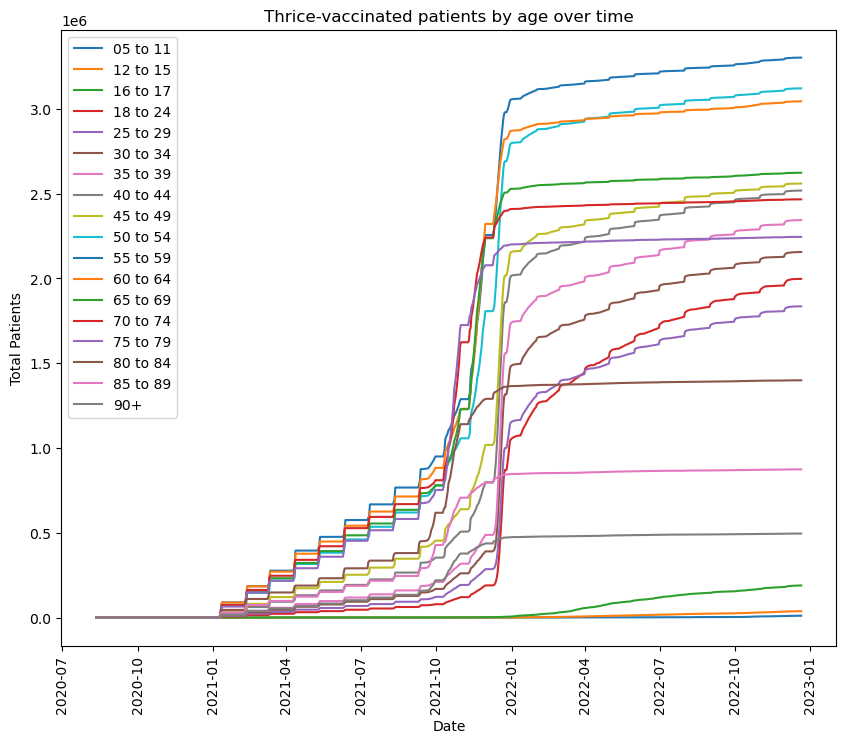

In [588]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each age
for vaccinationsAgeName in vaccinationsAge["Age"].unique():
    # Filter for the current age
    vaccinationsAgeData = vaccinationsAge[vaccinationsAge["Age"] == vaccinationsAgeName]
    
    # Plot the vaccinations against date for the current age
    plt.plot(vaccinationsAgeData["Date"], vaccinationsAgeData["Total People Received Third Dose"], label=vaccinationsAgeName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Total Patients")
plt.legend()
plt.xticks(rotation=90)
plt.title("Thrice-vaccinated patients by age over time")

# Show the plot
plt.show()

##### Plotting a comparison graph for the first dose increase over time

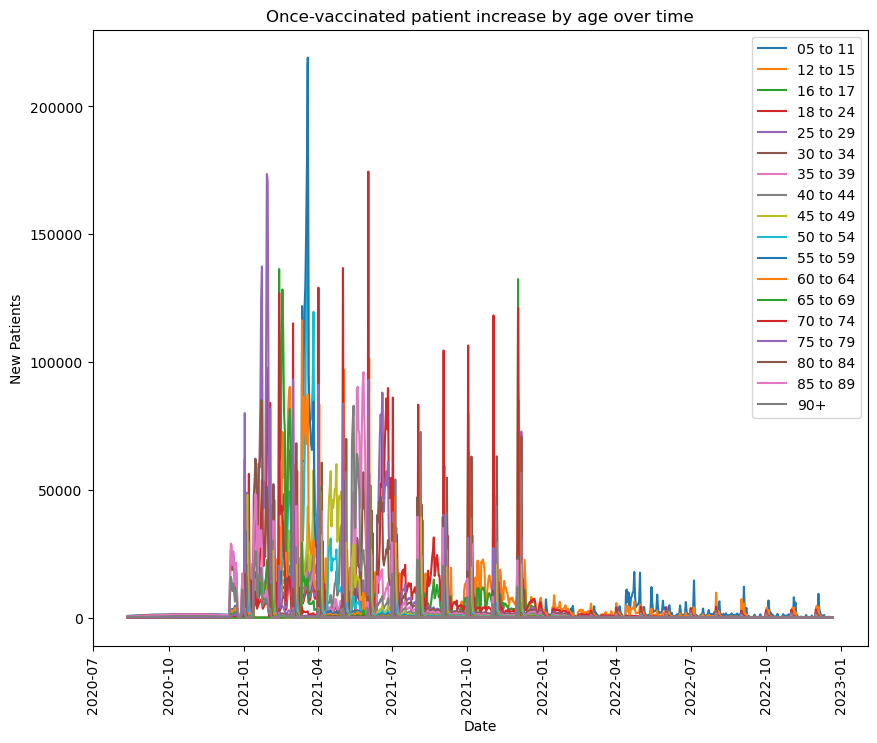

In [589]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each age
for vaccinationsAgeName in vaccinationsAge["Age"].unique():
    # Filter for the current age
    vaccinationsAgeData = vaccinationsAge[vaccinationsAge["Age"] == vaccinationsAgeName]
    
    # Plot the vaccinations against date for the current age
    plt.plot(vaccinationsAgeData["Date"], vaccinationsAgeData["New People Received First Dose"], label=vaccinationsAgeName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("New Patients")
plt.legend()
plt.xticks(rotation=90)
plt.title("Once-vaccinated patient increase by age over time")

# Show the plot
plt.show()

##### Plotting a comparison graph for the second dose increase over time

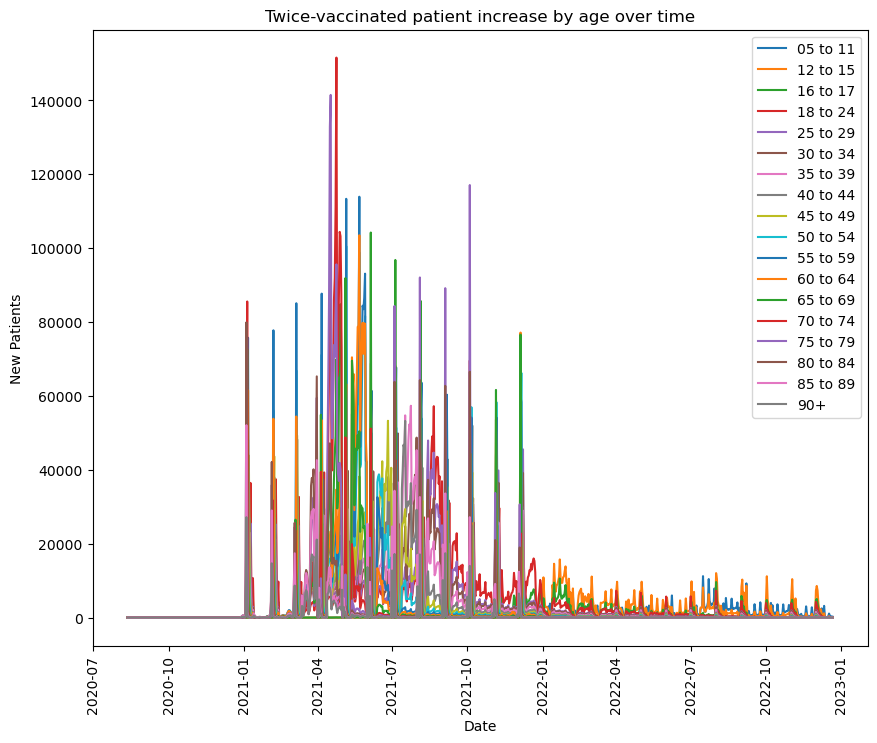

In [590]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each age
for vaccinationsAgeName in vaccinationsAge["Age"].unique():
    # Filter for the current age
    vaccinationsAgeData = vaccinationsAge[vaccinationsAge["Age"] == vaccinationsAgeName]
    
    # Plot the vaccinations against date for the current age
    plt.plot(vaccinationsAgeData["Date"], vaccinationsAgeData["New People Received Second Dose"], label=vaccinationsAgeName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("New Patients")
plt.legend()
plt.xticks(rotation=90)
plt.title("Twice-vaccinated patient increase by age over time")

# Show the plot
plt.show()

##### Plotting a comparison graph for the third dose increase over time

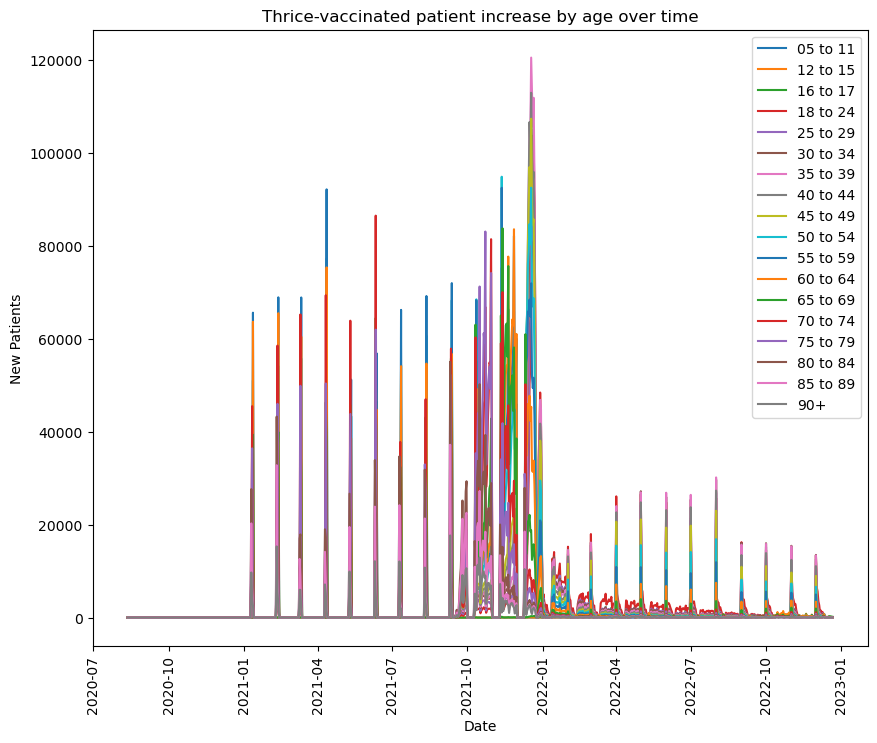

In [591]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each age
for vaccinationsAgeName in vaccinationsAge["Age"].unique():
    # Filter for the current age
    vaccinationsAgeData = vaccinationsAge[vaccinationsAge["Age"] == vaccinationsAgeName]
    
    # Plot the vaccinations against date for the current age
    plt.plot(vaccinationsAgeData["Date"], vaccinationsAgeData["New People Received Third Dose"], label=vaccinationsAgeName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("New Patients")
plt.legend()
plt.xticks(rotation=90)
plt.title("Thrice-vaccinated patient increase by age over time")

# Show the plot
plt.show()

#### Regional Proportion of Vaccinations

##### First Dose Vaccinations

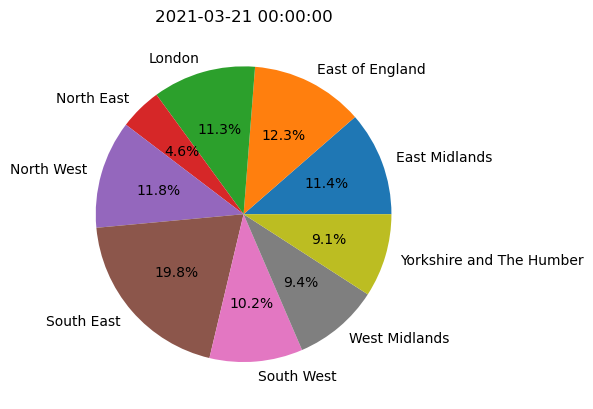

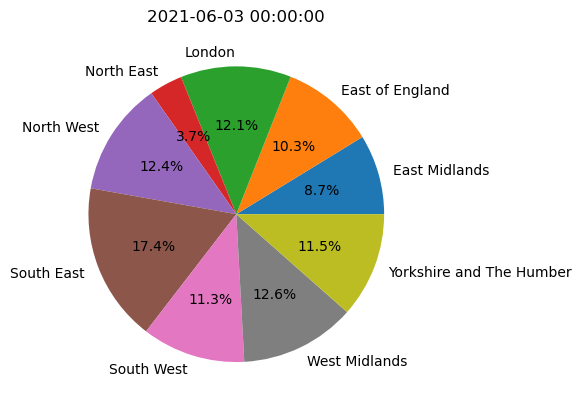

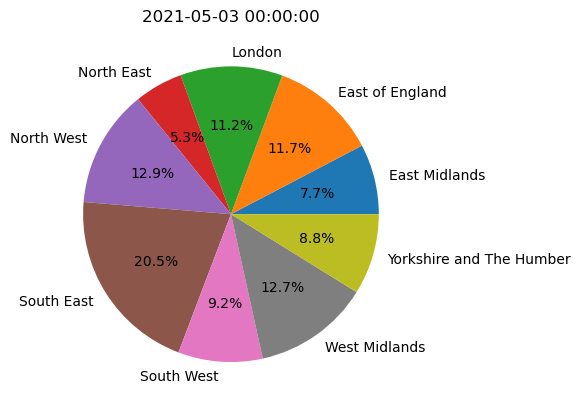

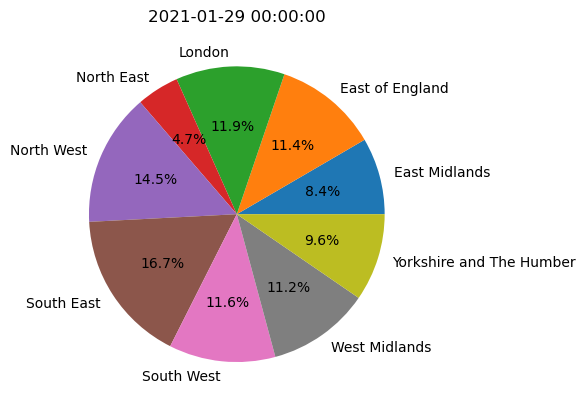

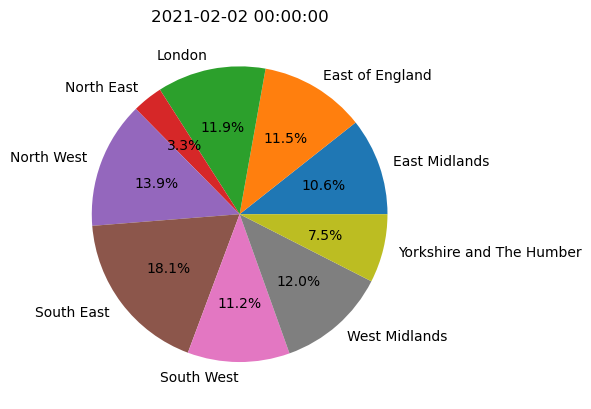

In [592]:
# Calculate the rolling mean of vaccination increase and add to a new column
vaccinationsRegion["Rolling Mean"] = vaccinationsRegion["New People Received First Dose"].rolling(7).mean()

# Group the data by month and find the peak number of vaccination increase for each month
maxVaccinationsPerMonth = vaccinationsRegion.groupby(vaccinationsRegion["Date"].dt.strftime("%Y-%m"))["New People Received First Dose"].max()

# Sort the values in descending order
maxVaccinationsPerMonth = maxVaccinationsPerMonth.sort_values(ascending=False)

# Get the five highest months
top5Months = maxVaccinationsPerMonth.head(5).index.tolist()

# Loop through each month
for month in top5Months:
    # Create a copy of the data for that month
    month2 = vaccinationsRegion[vaccinationsRegion["Date"].dt.strftime("%Y-%m") == month].copy()
    
    # Calculate the percentage increase in vaccinations and add to a new column
    month2.loc[:, "Percentage Increase"] = month2["New People Received First Dose"] / month2["New People Received First Dose"].sum()
    
    # Find the peak date and add to a new column
    month2.loc[:, "Peak"] = (month2["Rolling Mean"].diff(1) > 0) & (month2["Rolling Mean"].diff(-1) > 0)
    
    # Get the peak date
    peakDate = month2[month2["Peak"]].sort_values("New People Received First Dose", ascending=False)["Date"].iloc[0]
    
    # Plot a pie chart for the percentage increase in vaccinations on each peak date
    plt.pie(month2[month2["Date"] == peakDate]["Percentage Increase"], labels=month2[month2["Date"] == peakDate]["Region"], autopct="%1.1f%%")
    
    # Configure the layout of the plot
    plt.title(str(peakDate))
    
    # Show the plot
    plt.show()

##### Second Dose Vaccinations

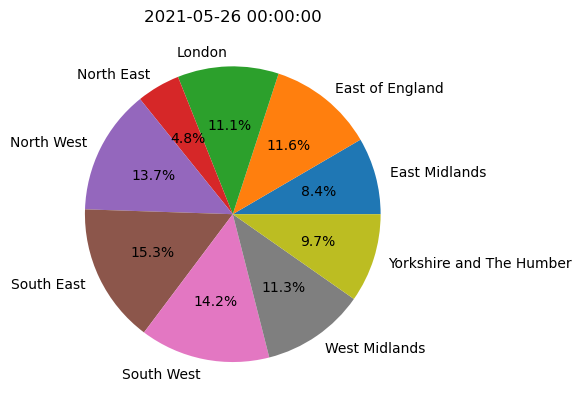

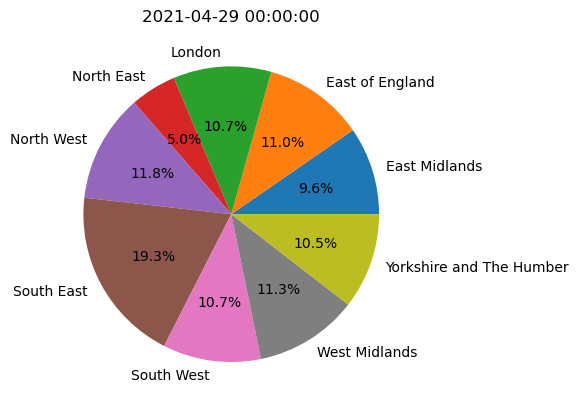

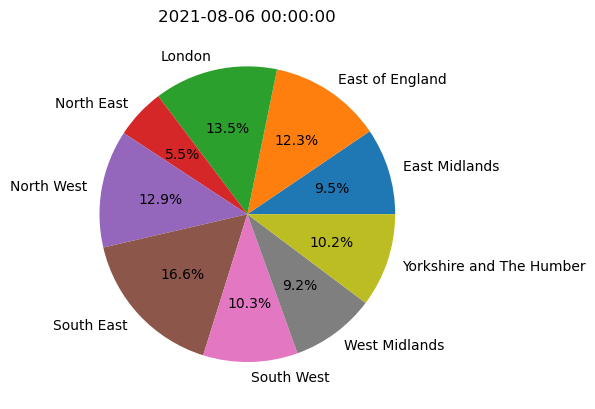

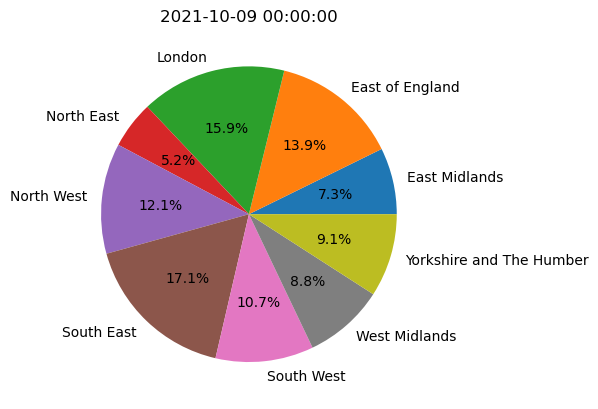

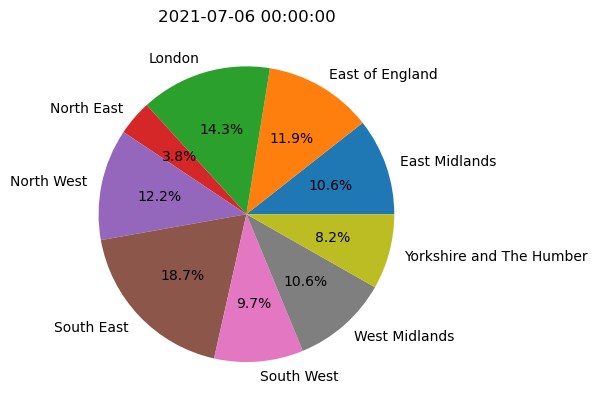

In [593]:
# Calculate the rolling mean of vaccination increase and add to a new column
vaccinationsRegion["Rolling Mean"] = vaccinationsRegion["New People Received Second Dose"].rolling(7).mean()

# Group the data by month and find the peak number of vaccination increase for each month
maxVaccinationsPerMonth = vaccinationsRegion.groupby(vaccinationsRegion["Date"].dt.strftime("%Y-%m"))["New People Received Second Dose"].max()

# Sort the values in descending order
maxVaccinationsPerMonth = maxVaccinationsPerMonth.sort_values(ascending=False)

# Get the five highest months
top5Months = maxVaccinationsPerMonth.head(5).index.tolist()

# Loop through each month
for month in top5Months:
    # Create a copy of the data for that month
    month2 = vaccinationsRegion[vaccinationsRegion["Date"].dt.strftime("%Y-%m") == month].copy()
    
    # Calculate the percentage increase in vaccinations and add to a new column
    month2.loc[:, "Percentage Increase"] = month2["New People Received Second Dose"] / month2["New People Received Second Dose"].sum()
    
    # Find the peak date and add to a new column
    month2.loc[:, "Peak"] = (month2["Rolling Mean"].diff(1) > 0) & (month2["Rolling Mean"].diff(-1) > 0)
    
    # Get the peak date
    peakDate = month2[month2["Peak"]].sort_values("New People Received Second Dose", ascending=False)["Date"].iloc[0]
    
    # Plot a pie chart for the percentage increase in vaccinations on each peak date
    plt.pie(month2[month2["Date"] == peakDate]["Percentage Increase"], labels=month2[month2["Date"] == peakDate]["Region"], autopct="%1.1f%%")
    
    # Configure the layout of the plot
    plt.title(str(peakDate))
    
    # Show the plot
    plt.show()

##### Third Dose Vaccinations

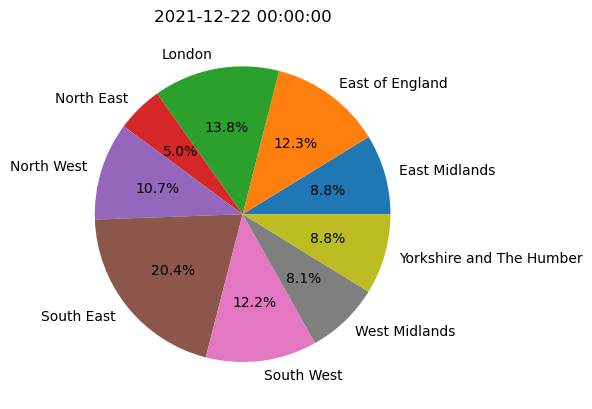

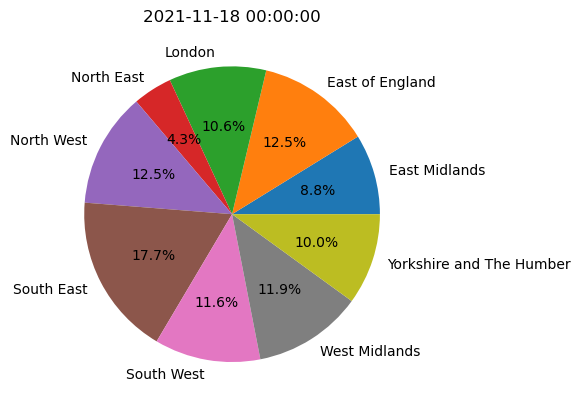

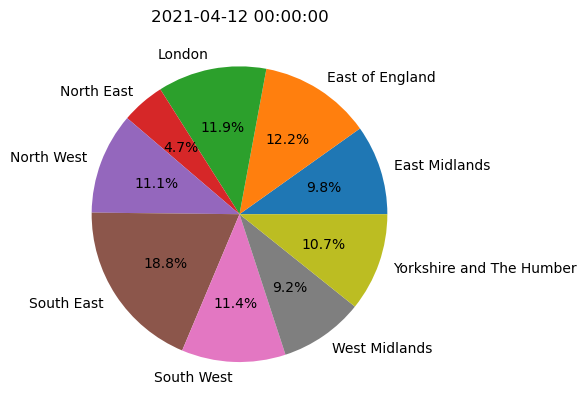

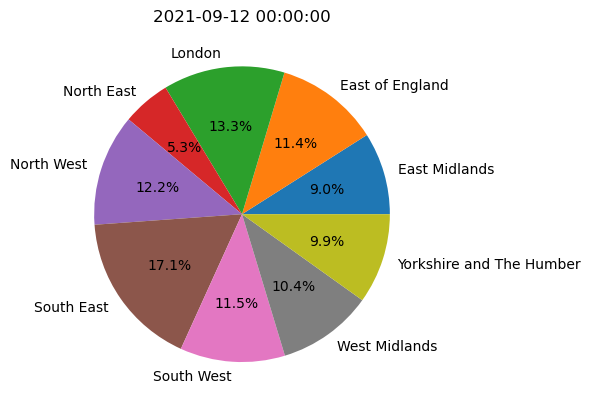

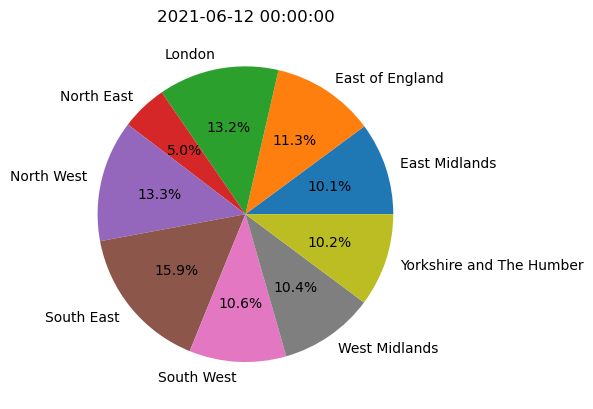

In [594]:
# Calculate the rolling mean of vaccination increase and add to a new column
vaccinationsRegion["Rolling Mean"] = vaccinationsRegion["New People Received Third Dose"].rolling(7).mean()

# Group the data by month and find the peak number of vaccination increase for each month
maxVaccinationsPerMonth = vaccinationsRegion.groupby(vaccinationsRegion["Date"].dt.strftime("%Y-%m"))["New People Received Third Dose"].max()

# Sort the values in descending order
maxVaccinationsPerMonth = maxVaccinationsPerMonth.sort_values(ascending=False)

# Get the five highest months
top5Months = maxVaccinationsPerMonth.head(5).index.tolist()

# Loop through each month
for month in top5Months:
    # Create a copy of the data for that month
    month2 = vaccinationsRegion[vaccinationsRegion["Date"].dt.strftime("%Y-%m") == month].copy()
    
    # Calculate the percentage increase in vaccinations and add to a new column
    month2.loc[:, "Percentage Increase"] = month2["New People Received Third Dose"] / month2["New People Received Third Dose"].sum()
    
    # Find the peak date and add to a new column
    month2.loc[:, "Peak"] = (month2["Rolling Mean"].diff(1) > 0) & (month2["Rolling Mean"].diff(-1) > 0)
    
    # Get the peak date
    peakDate = month2[month2["Peak"]].sort_values("New People Received Third Dose", ascending=False)["Date"].iloc[0]
    
    # Plot a pie chart for the percentage increase in vaccinations on each peak date
    plt.pie(month2[month2["Date"] == peakDate]["Percentage Increase"], labels=month2[month2["Date"] == peakDate]["Region"], autopct="%1.1f%%")
    
    # Configure the layout of the plot
    plt.title(str(peakDate))
    
    # Show the plot
    plt.show()

#### Age Distribution of Vaccinations

##### First Dose Vaccinations

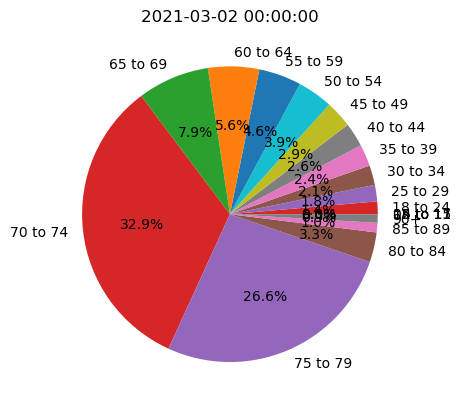

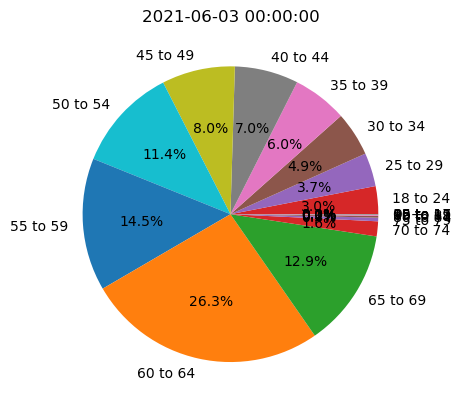

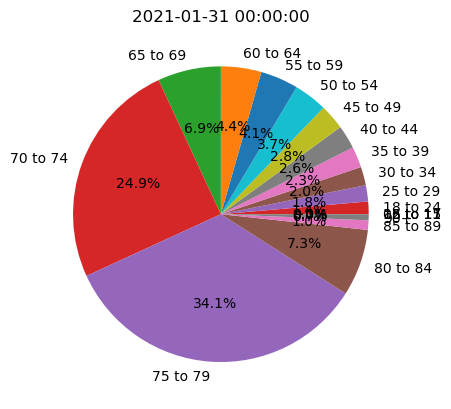

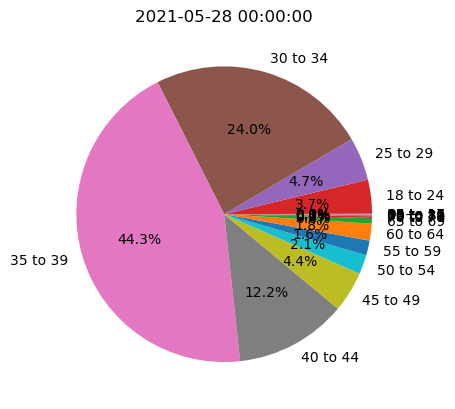

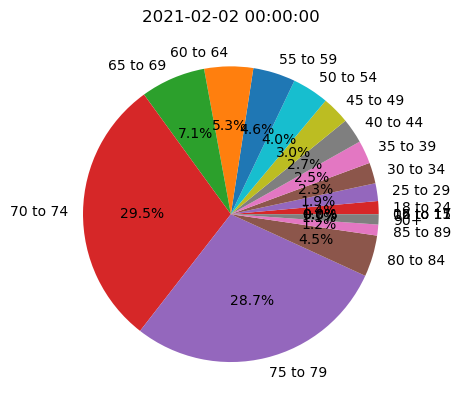

In [595]:
# Calculate the rolling mean of vaccination increase and add to a new column
vaccinationsAge["Rolling Mean"] = vaccinationsAge["New People Received First Dose"].rolling(7).mean()

# Group the data by month and find the peak number of vaccination increase for each month
maxVaccinationsPerMonth = vaccinationsAge.groupby(vaccinationsAge["Date"].dt.strftime("%Y-%m"))["New People Received First Dose"].max()

# Sort the values in descending order
maxVaccinationsPerMonth = maxVaccinationsPerMonth.sort_values(ascending=False)

# Get the five highest months
top5Months = maxVaccinationsPerMonth.head(5).index.tolist()

# Loop through each month
for month in top5Months:
    # Create a copy of the data for that month
    month2 = vaccinationsAge[vaccinationsAge["Date"].dt.strftime("%Y-%m") == month].copy()
    
    # Calculate the percentage increase in vaccinations and add to a new column
    month2.loc[:, "Percentage Increase"] = month2["New People Received First Dose"] / month2["New People Received First Dose"].sum()
    
    # Find the peak date and add to a new column
    month2.loc[:, "Peak"] = (month2["Rolling Mean"].diff(1) > 0) & (month2["Rolling Mean"].diff(-1) > 0)
    
    # Get the peak date
    peakDate = month2[month2["Peak"]].sort_values("New People Received First Dose", ascending=False)["Date"].iloc[0]
    
    # Plot a pie chart for the percentage increase in vaccinations on each peak date
    plt.pie(month2[month2["Date"] == peakDate]["Percentage Increase"], labels=month2[month2["Date"] == peakDate]["Age"], autopct="%1.1f%%")
    
    # Configure the layout of the plot
    plt.title(str(peakDate))
    
    # Show the plot
    plt.show()

##### Second Dose Vaccinations

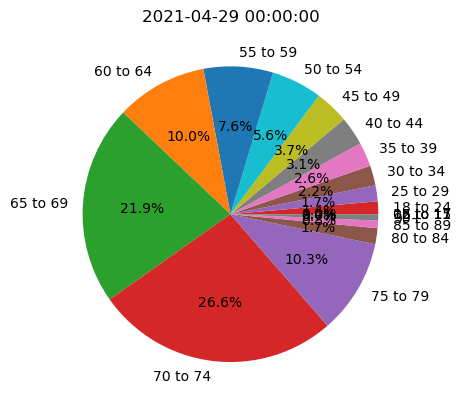

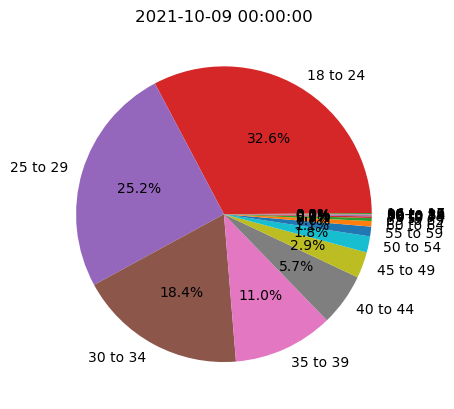

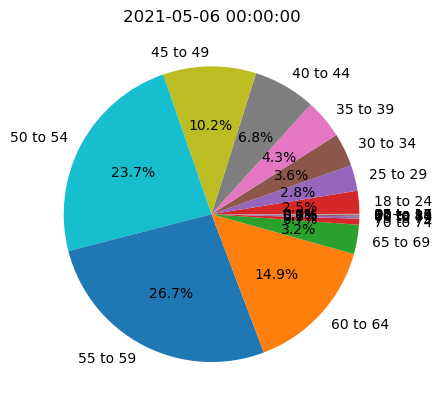

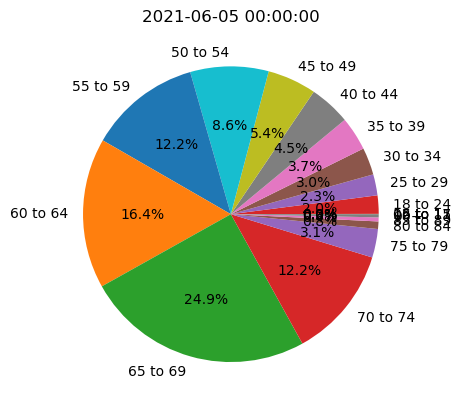

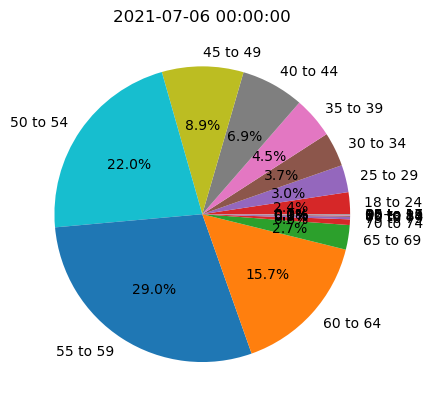

In [596]:
# Calculate the rolling mean of vaccination increase and add to a new column
vaccinationsAge["Rolling Mean"] = vaccinationsAge["New People Received Second Dose"].rolling(7).mean()

# Group the data by month and find the peak number of vaccination increase for each month
maxVaccinationsPerMonth = vaccinationsAge.groupby(vaccinationsAge["Date"].dt.strftime("%Y-%m"))["New People Received Second Dose"].max()

# Sort the values in descending order
maxVaccinationsPerMonth = maxVaccinationsPerMonth.sort_values(ascending=False)

# Get the five highest months
top5Months = maxVaccinationsPerMonth.head(5).index.tolist()

# Loop through each month
for month in top5Months:
    # Create a copy of the data for that month
    month2 = vaccinationsAge[vaccinationsAge["Date"].dt.strftime("%Y-%m") == month].copy()
    
    # Calculate the percentage increase in vaccinations and add to a new column
    month2.loc[:, "Percentage Increase"] = month2["New People Received Second Dose"] / month2["New People Received Second Dose"].sum()
    
    # Find the peak date and add to a new column
    month2.loc[:, "Peak"] = (month2["Rolling Mean"].diff(1) > 0) & (month2["Rolling Mean"].diff(-1) > 0)
    
    # Get the peak date
    peakDate = month2[month2["Peak"]].sort_values("New People Received Second Dose", ascending=False)["Date"].iloc[0]
    
    # Plot a pie chart for the percentage increase in vaccinations on each peak date
    plt.pie(month2[month2["Date"] == peakDate]["Percentage Increase"], labels=month2[month2["Date"] == peakDate]["Age"], autopct="%1.1f%%")
    
    # Configure the layout of the plot
    plt.title(str(peakDate))
    
    # Show the plot
    plt.show()

##### Third Dose Vaccinations

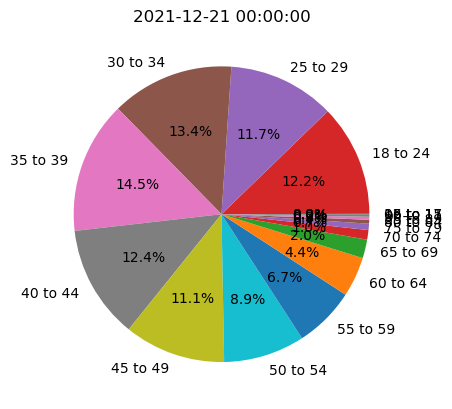

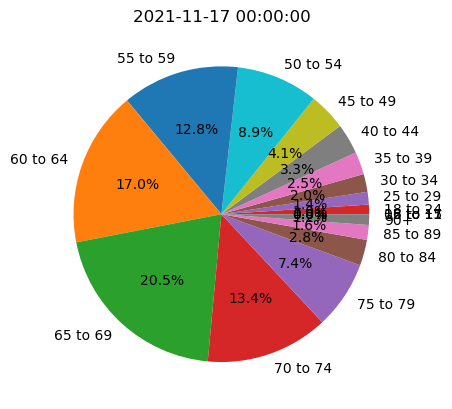

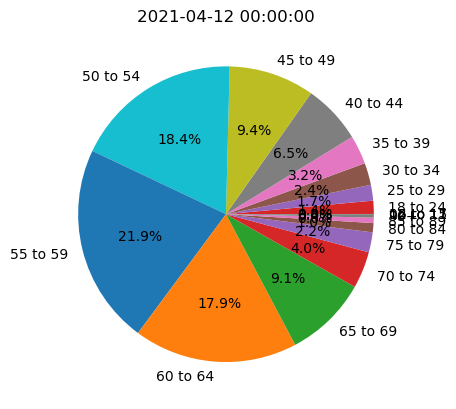

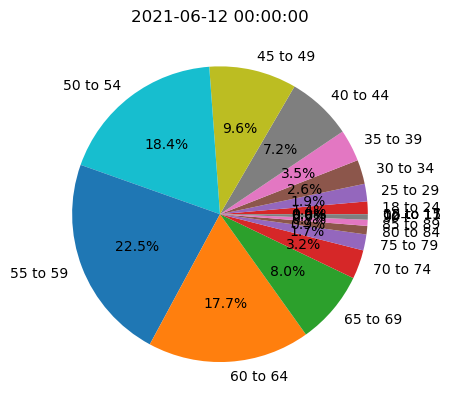

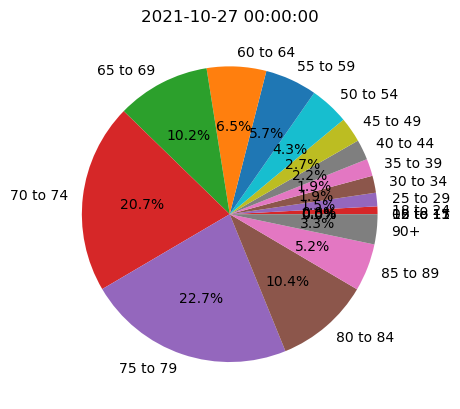

In [597]:
# Calculate the rolling mean of vaccination increase and add to a new column
vaccinationsAge["Rolling Mean"] = vaccinationsAge["New People Received Third Dose"].rolling(7).mean()

# Group the data by month and find the peak number of vaccination increase for each month
maxVaccinationsPerMonth = vaccinationsAge.groupby(vaccinationsAge["Date"].dt.strftime("%Y-%m"))["New People Received Third Dose"].max()

# Sort the values in descending order
maxVaccinationsPerMonth = maxVaccinationsPerMonth.sort_values(ascending=False)

# Get the five highest months
top5Months = maxVaccinationsPerMonth.head(5).index.tolist()

# Loop through each month
for month in top5Months:
    # Create a copy of the data for that month
    month2 = vaccinationsAge[vaccinationsAge["Date"].dt.strftime("%Y-%m") == month].copy()
    
    # Calculate the percentage increase in vaccinations and add to a new column
    month2.loc[:, "Percentage Increase"] = month2["New People Received Third Dose"] / month2["New People Received Third Dose"].sum()
    
    # Find the peak date and add to a new column
    month2.loc[:, "Peak"] = (month2["Rolling Mean"].diff(1) > 0) & (month2["Rolling Mean"].diff(-1) > 0)
    
    # Get the peak date
    peakDate = month2[month2["Peak"]].sort_values("New People Received Third Dose", ascending=False)["Date"].iloc[0]
    
    # Plot a pie chart for the percentage increase in vaccinations on each peak date
    plt.pie(month2[month2["Date"] == peakDate]["Percentage Increase"], labels=month2[month2["Date"] == peakDate]["Age"], autopct="%1.1f%%")
    
    # Configure the layout of the plot
    plt.title(str(peakDate))
    
    # Show the plot
    plt.show()

### Reinfections Data Analysis

#### Remaking the cumulative columns

In [598]:
# Sort the DataFrame
reinfections1 = reinfections1.sort_values(["Region", "Age", "Date"])

# Remake the columns as the cumulative sum of new doses
reinfections1["Total Reinfections"] = (reinfections1.groupby(["Region", "Age"])["New Reinfections"]
                                          .cumsum())

#### Regional Distribution of Reinfections

##### Grouping the reinfections by region

In [599]:
# Group by region and date
reinfectionsRegionGroup = reinfections1.groupby(["Region", "Date"]).sum()

# Reset index
reinfectionsRegion = reinfectionsRegionGroup.reset_index()

# Output DataFrame
reinfectionsRegion

C:\Users\chukl\AppData\Local\Temp\ipykernel_14668\661319343.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  reinfectionsRegionGroup = reinfections1.groupby(["Region", "Date"]).sum()


,Region,Date,New Reinfections,Total Reinfections,Rolling Rate
0,East Midlands,2020-02-23,0,0,0.0
1,East Midlands,2020-02-24,0,0,0.0
2,East Midlands,2020-02-25,0,0,0.0
3,East Midlands,2020-02-26,0,0,0.0
4,East Midlands,2020-02-27,0,0,0.0
...,...,...,...,...,...
9350,Yorkshire and The Humber,2022-12-11,116,142861,319.9
9351,Yorkshire and The Humber,2022-12-12,162,143023,311.3
9352,Yorkshire and The Humber,2022-12-13,193,143216,345.1
9353,Yorkshire and The Humber,2022-12-14,188,143404,364.4


##### Plotting a comparison graph for the reinfections over time

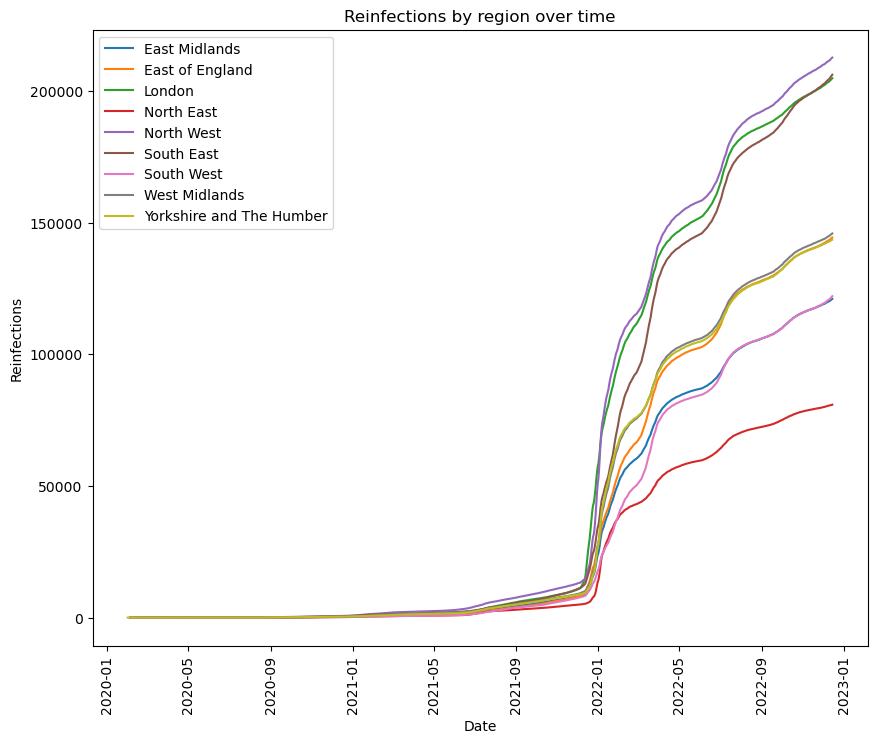

In [600]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for reinfectionsRegionName in reinfectionsRegion["Region"].unique():
    # Filter for the current region
    reinfectionsRegionData = reinfectionsRegion[reinfectionsRegion["Region"] == reinfectionsRegionName]
    
    # Plot the reinfections against date for the current region
    plt.plot(reinfectionsRegionData["Date"], reinfectionsRegionData["Total Reinfections"], label=reinfectionsRegionName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Reinfections")
plt.legend()
plt.xticks(rotation=90)
plt.title("Reinfections by region over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the reinfections over time

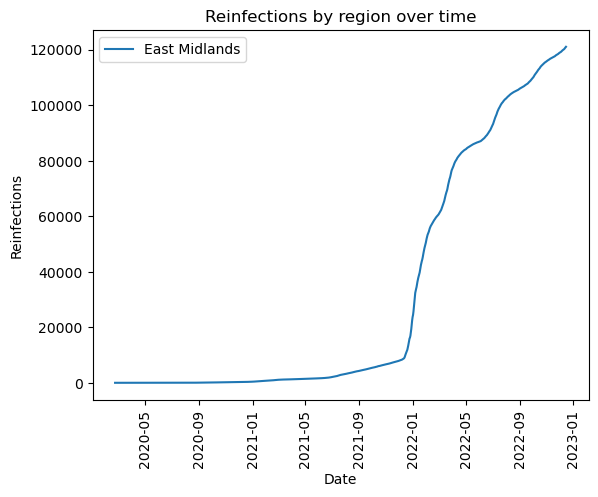

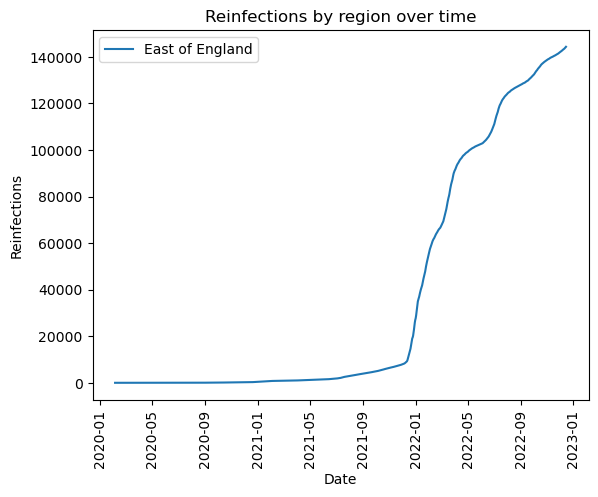

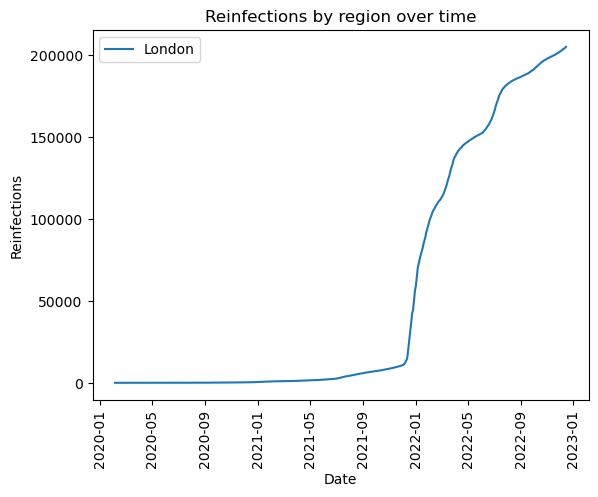

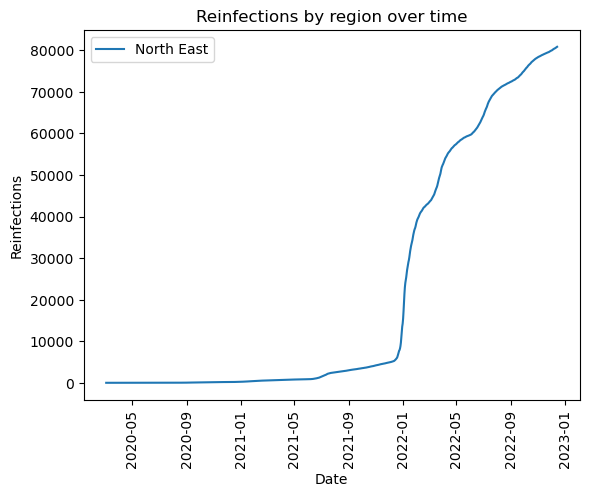

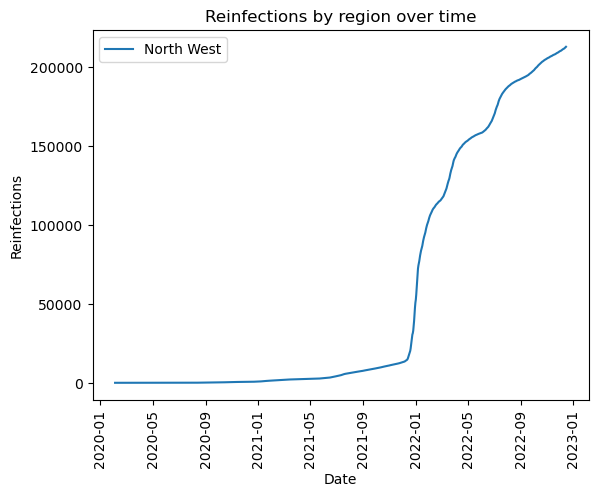

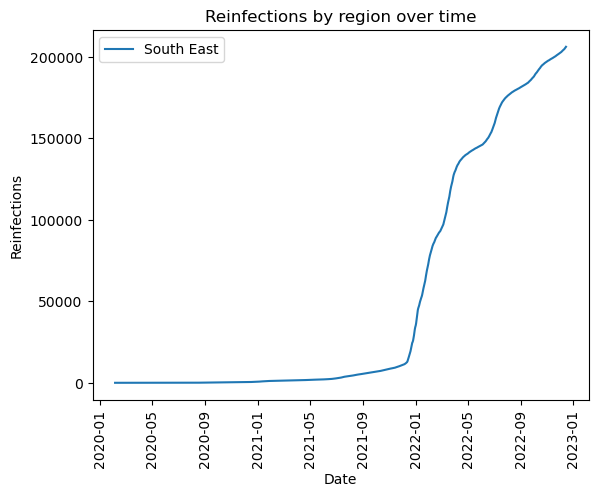

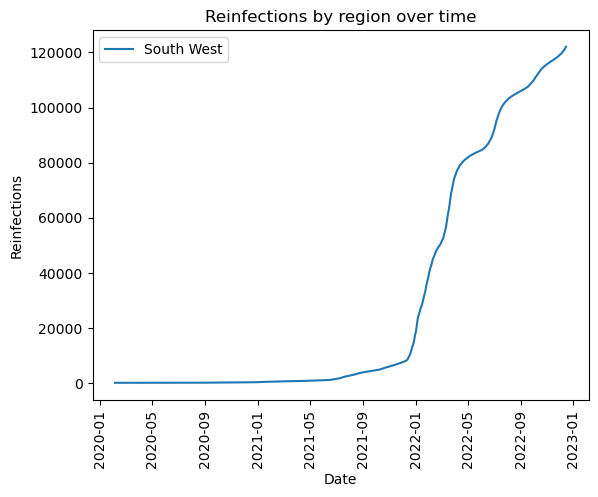

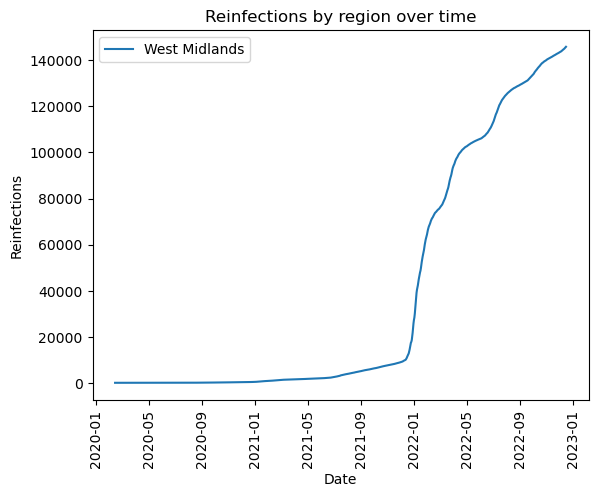

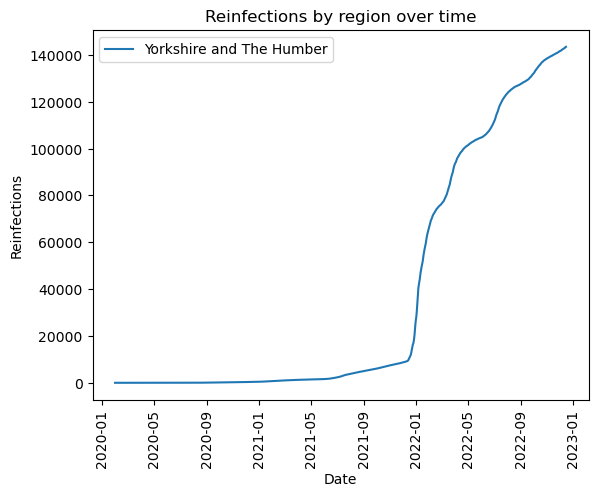

In [601]:
# Loop through each region
for reinfectionsRegionName in reinfectionsRegion["Region"].unique():
    # Filter for the current region
    reinfectionsRegionData = reinfectionsRegion[reinfectionsRegion["Region"] == reinfectionsRegionName]
    
    # Plot the reinfections against date for the current region
    plt.plot(reinfectionsRegionData["Date"], reinfectionsRegionData["Total Reinfections"], label=reinfectionsRegionName)

    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Reinfections")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Reinfections by region over time")

    # Show the plot
    plt.show()

##### Plotting a comparison graph for the reinfection increase over time

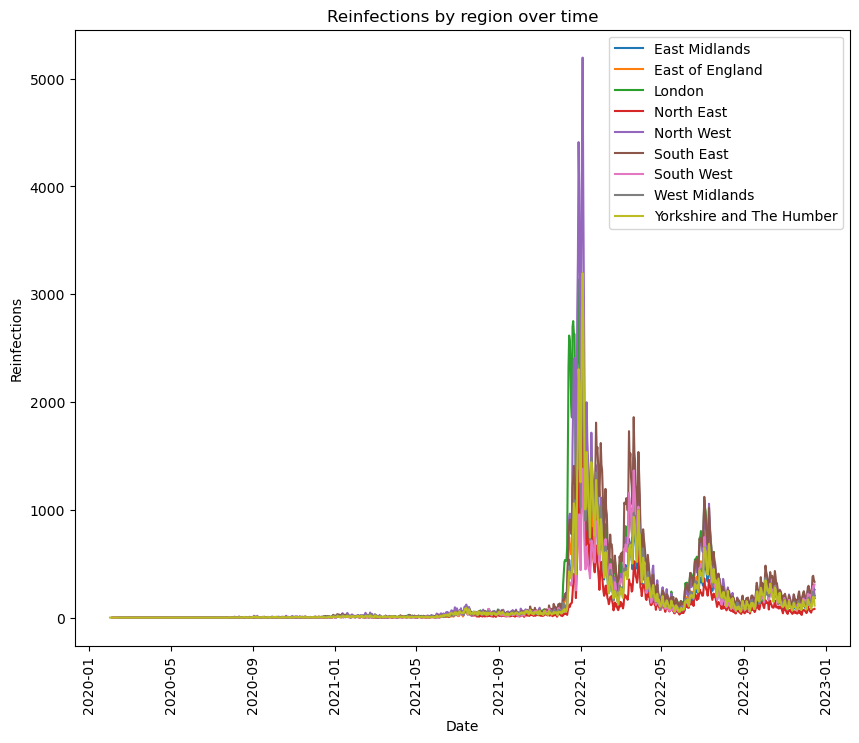

In [602]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for reinfectionsRegionName in reinfectionsRegion["Region"].unique():
    # Filter for the current region
    reinfectionsRegionData = reinfectionsRegion[reinfectionsRegion["Region"] == reinfectionsRegionName]
    
    # Plot the reinfections against date for the current region
    plt.plot(reinfectionsRegionData["Date"], reinfectionsRegionData["New Reinfections"], label=reinfectionsRegionName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Reinfections")
plt.legend()
plt.xticks(rotation=90)
plt.title("Reinfections by region over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the reinfection increase over time

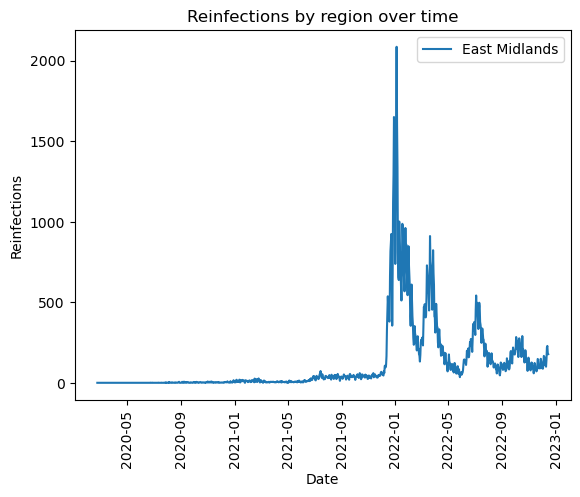

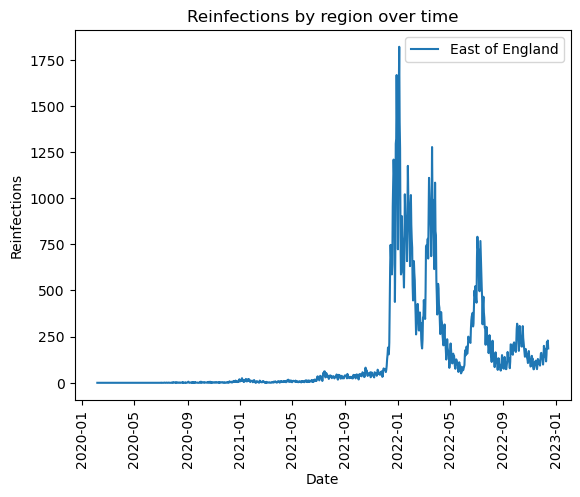

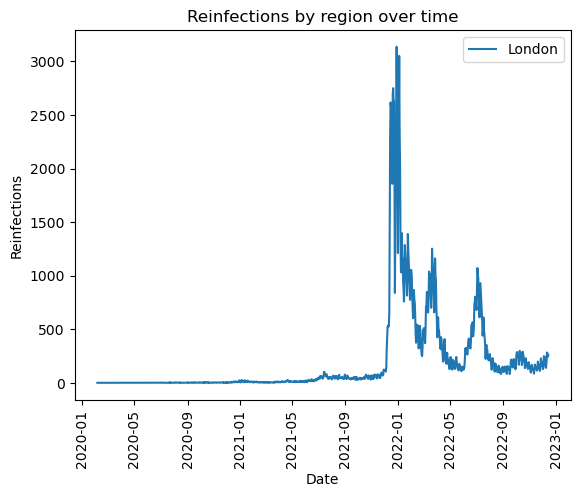

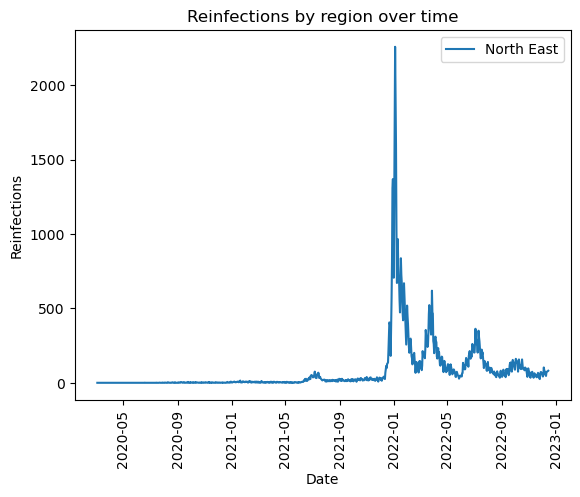

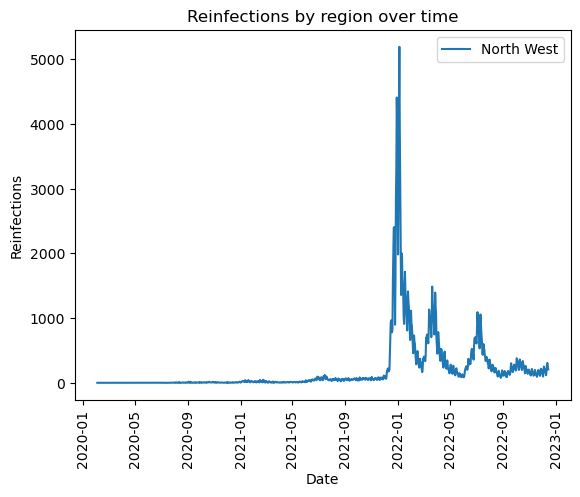

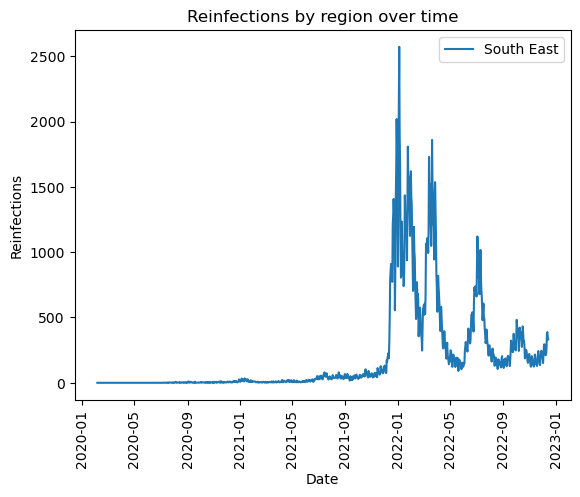

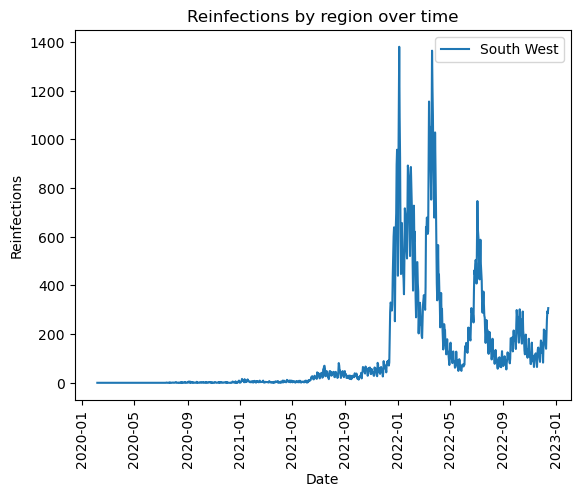

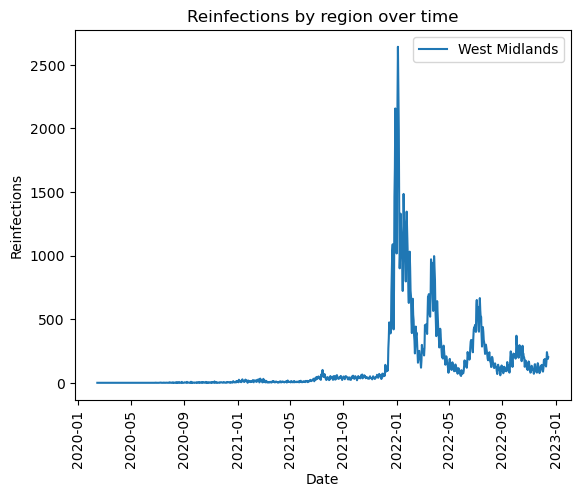

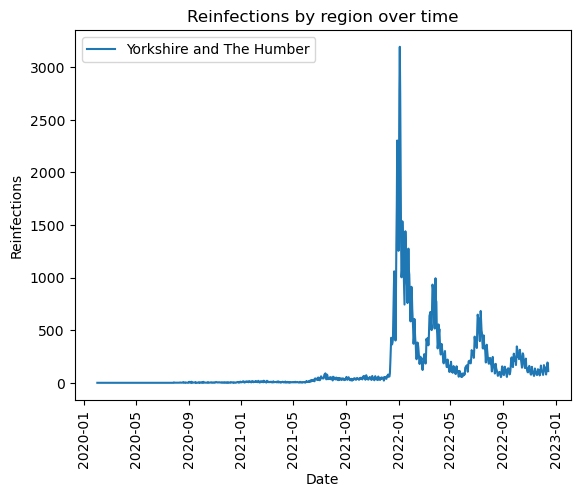

In [603]:
# Loop through each region
for reinfectionsRegionName in reinfectionsRegion["Region"].unique():
    # Filter for the current region
    reinfectionsRegionData = reinfectionsRegion[reinfectionsRegion["Region"] == reinfectionsRegionName]
    
    # Plot the reinfections against date for the current region
    plt.plot(reinfectionsRegionData["Date"], reinfectionsRegionData["New Reinfections"], label=reinfectionsRegionName)

    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Reinfections")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Reinfections by region over time")

    # Show the plot
    plt.show()

#### Age Distribution of Reinfections

##### Grouping the reinfections by age

In [604]:
# Group by age and date
reinfectionsAgeGroup = reinfections1.groupby(["Age", "Date"]).sum()

# Reset index
reinfectionsAge = reinfectionsAgeGroup.reset_index()

# Output DataFrame
reinfectionsAge

C:\Users\chukl\AppData\Local\Temp\ipykernel_14668\3401303781.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  reinfectionsAgeGroup = reinfections1.groupby(["Age", "Date"]).sum()


,Age,Date,New Reinfections,Total Reinfections,Rolling Rate
0,00 to 04,2020-02-01,0,0,0.0
1,00 to 04,2020-02-02,0,0,0.0
2,00 to 04,2020-02-03,0,0,0.0
3,00 to 04,2020-02-04,0,0,0.0
4,00 to 04,2020-02-05,0,0,0.0
...,...,...,...,...,...
19926,90+,2022-12-11,21,12173,466.6
19927,90+,2022-12-12,63,12236,467.8
19928,90+,2022-12-13,84,12320,547.6
19929,90+,2022-12-14,74,12394,615.6


##### Plotting a comparison graph for the reinfections over time

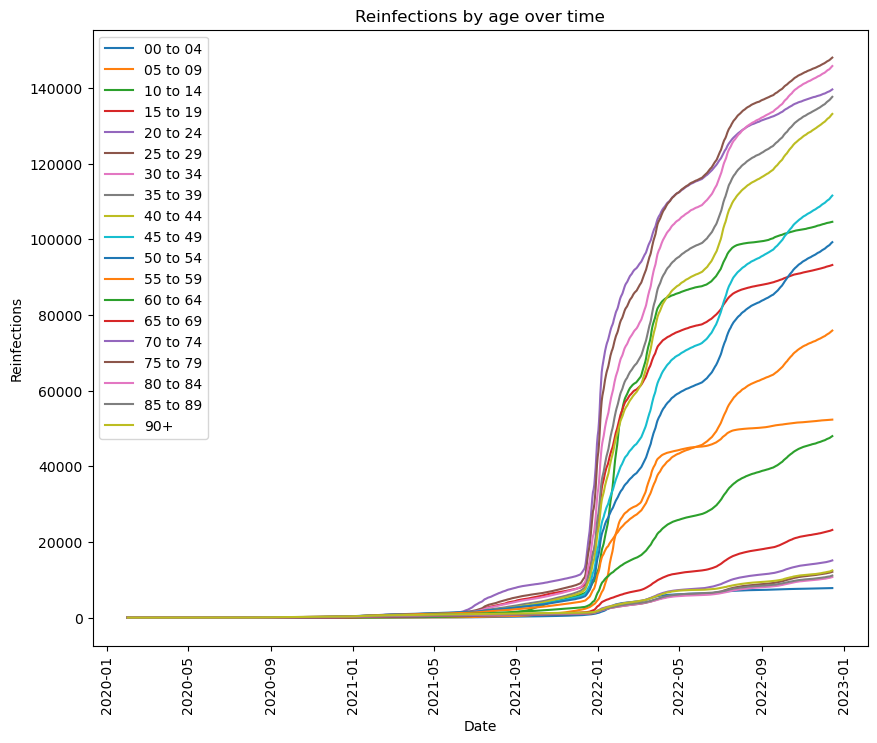

In [605]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each age
for reinfectionsAgeName in reinfectionsAge["Age"].unique():
    # Filter for the current age
    reinfectionsAgeData = reinfectionsAge[reinfectionsAge["Age"] == reinfectionsAgeName]
    
    # Plot the reinfections against date for the current age
    plt.plot(reinfectionsAgeData["Date"], reinfectionsAgeData["Total Reinfections"], label=reinfectionsAgeName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Reinfections")
plt.legend()
plt.xticks(rotation=90)
plt.title("Reinfections by age over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the reinfections over time

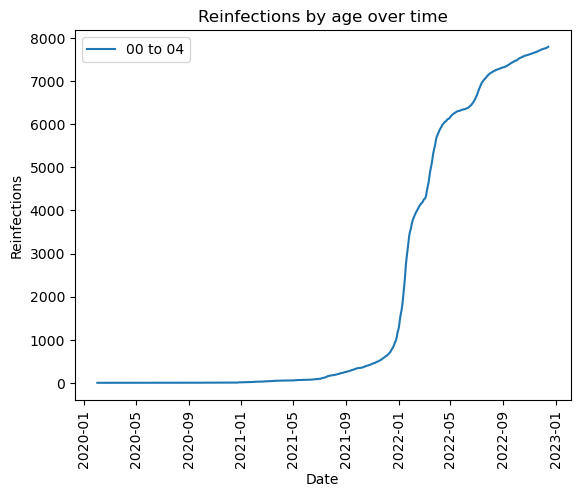

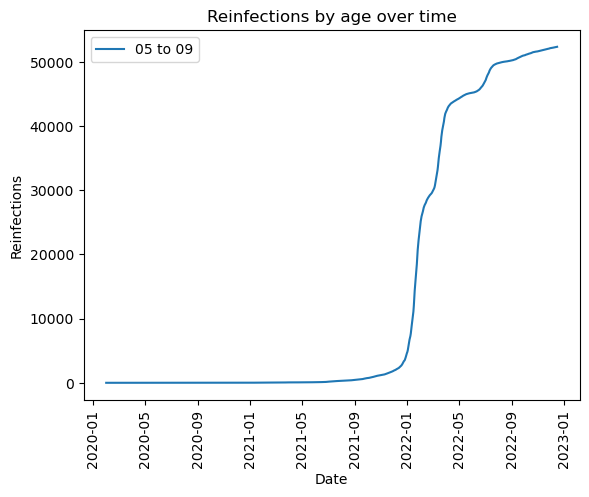

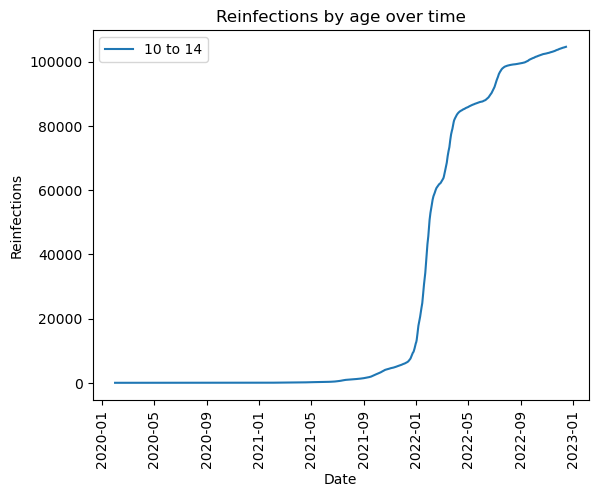

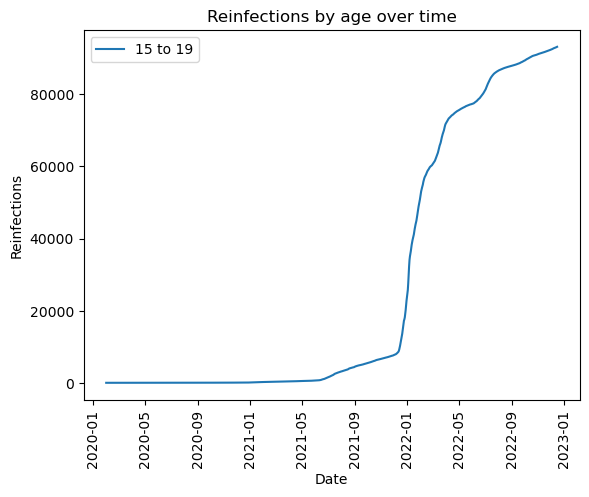

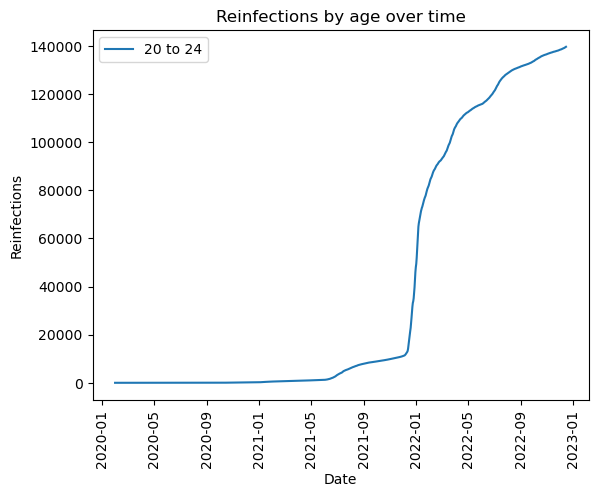

...

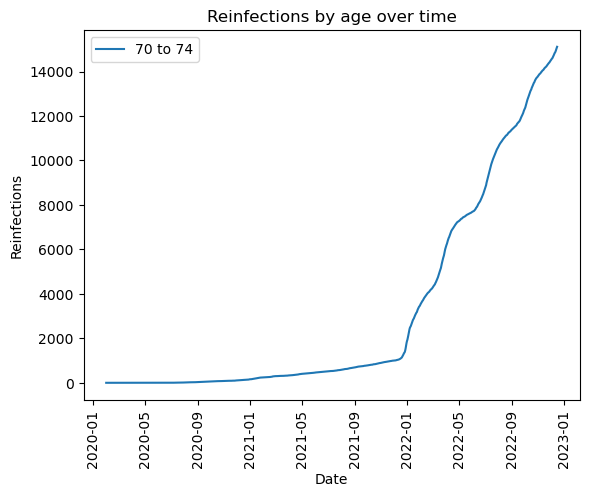

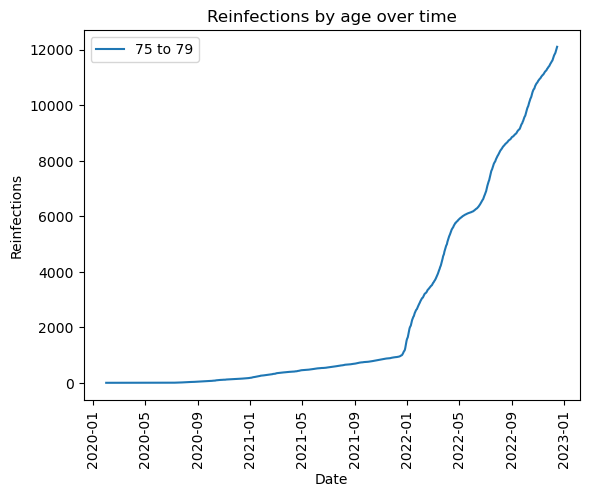

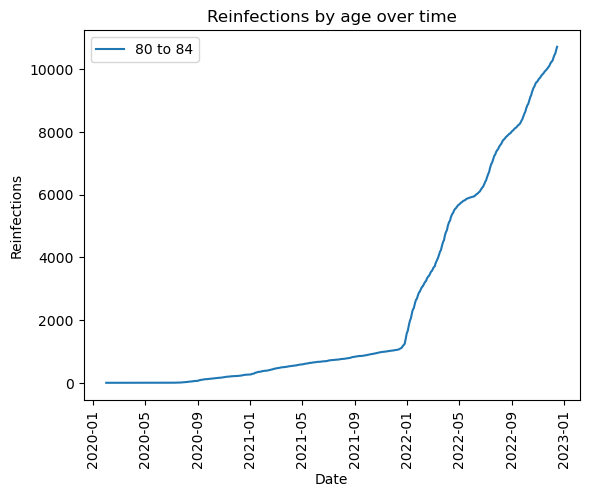

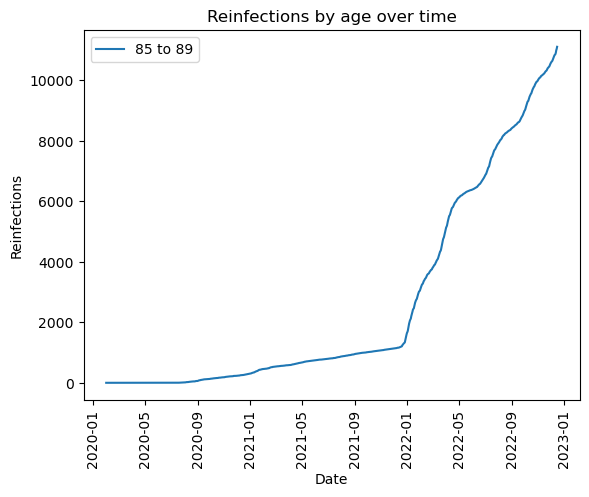

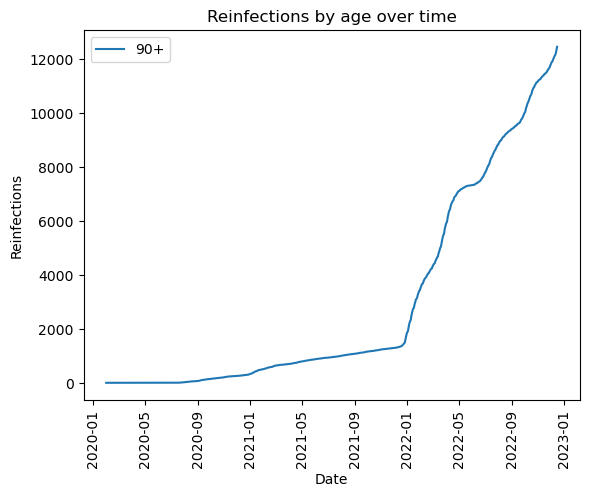

In [606]:
# Loop through each age
for reinfectionsAgeName in reinfectionsAge["Age"].unique():
    # Filter for the current age
    reinfectionsAgeData = reinfectionsAge[reinfectionsAge["Age"] == reinfectionsAgeName]
    
    # Plot the reinfections against date for the current age
    plt.plot(reinfectionsAgeData["Date"], reinfectionsAgeData["Total Reinfections"], label=reinfectionsAgeName)

    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Reinfections")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Reinfections by age over time")

    # Show the plot
    plt.show()

##### Plotting a comparison graph for the reinfection increase over time

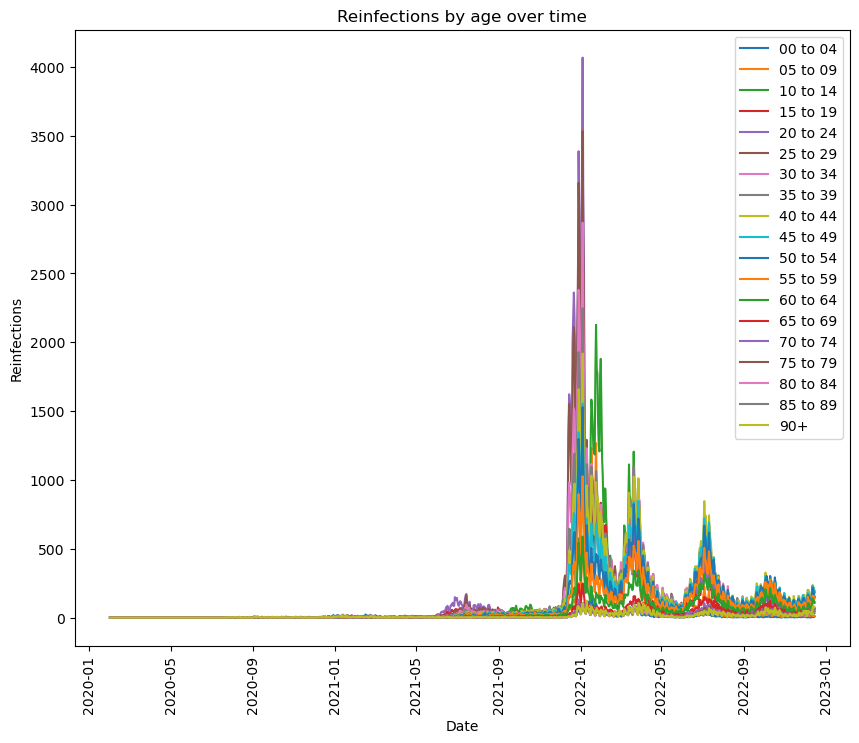

In [607]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each age
for reinfectionsAgeName in reinfectionsAge["Age"].unique():
    # Filter for the current age
    reinfectionsAgeData = reinfectionsAge[reinfectionsAge["Age"] == reinfectionsAgeName]
    
    # Plot the reinfections against date for the current age
    plt.plot(reinfectionsAgeData["Date"], reinfectionsAgeData["New Reinfections"], label=reinfectionsAgeName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Reinfections")
plt.legend()
plt.xticks(rotation=90)
plt.title("Reinfections by age over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the reinfection increase over time

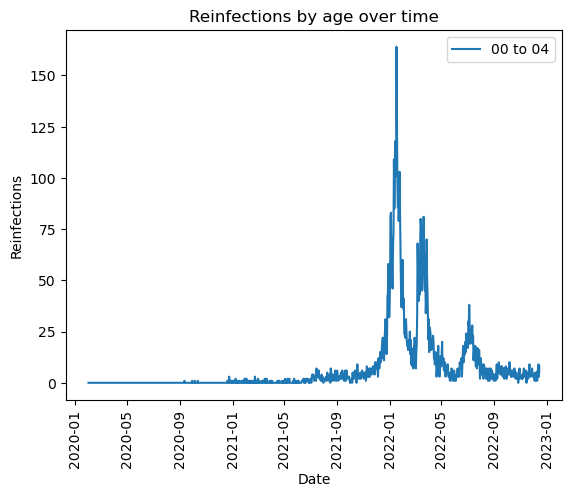

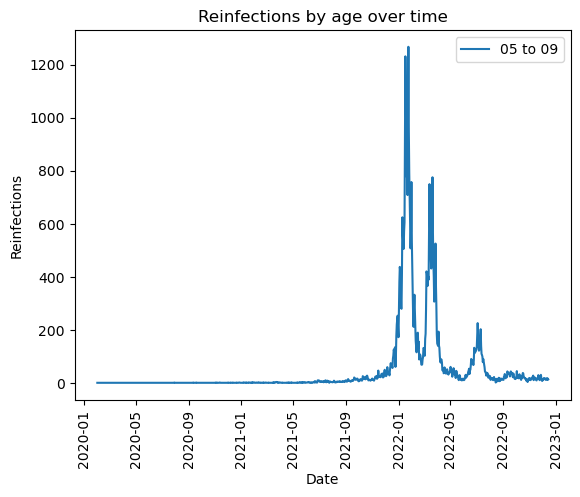

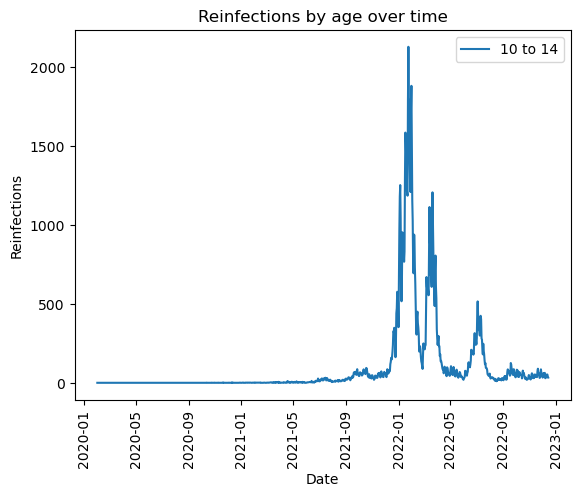

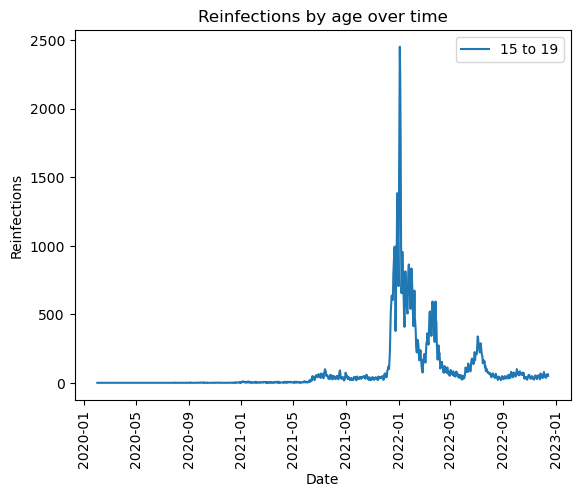

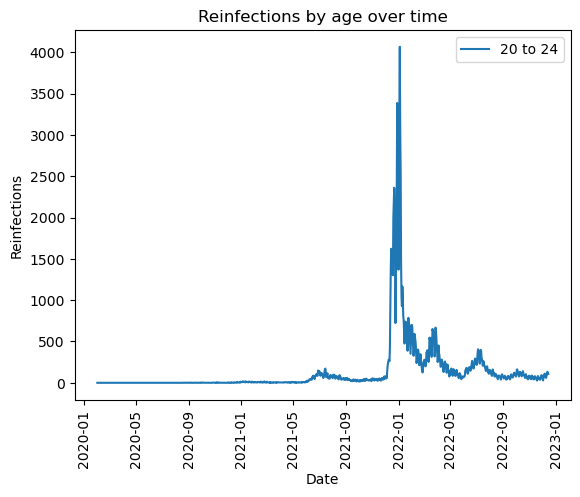

...

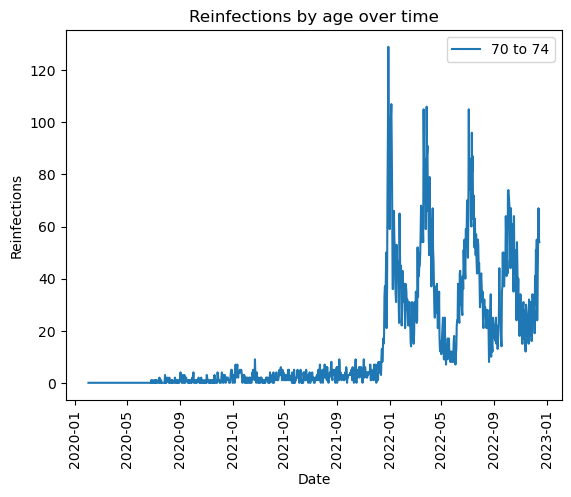

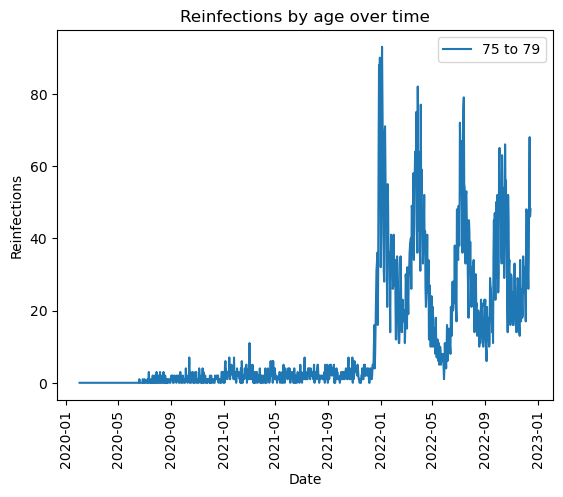

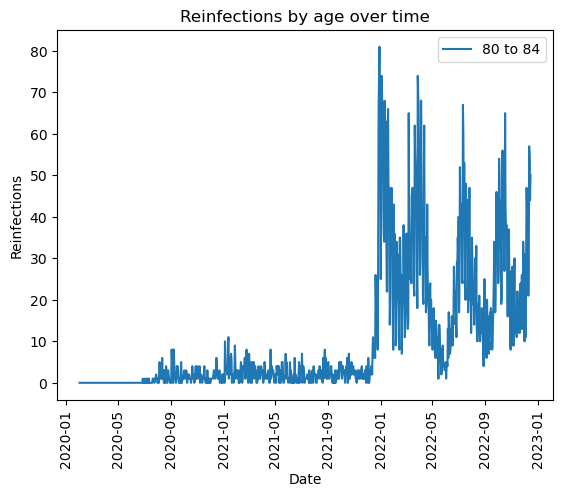

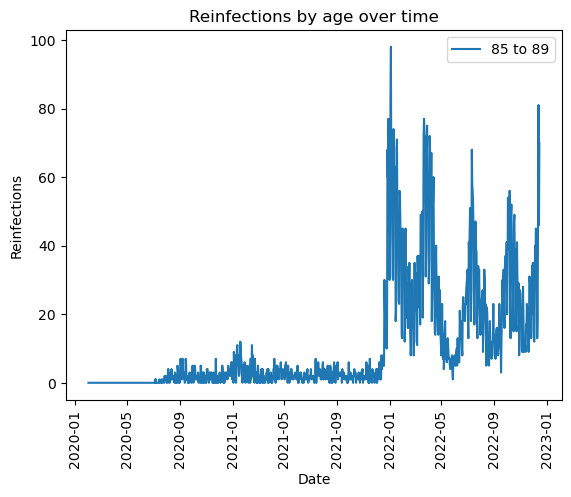

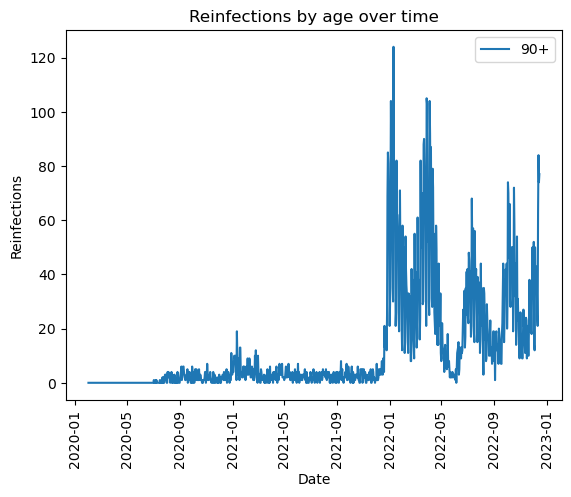

In [608]:
# Loop through each age
for reinfectionsAgeName in reinfectionsAge["Age"].unique():
    # Filter for the current age
    reinfectionsAgeData = reinfectionsAge[reinfectionsAge["Age"] == reinfectionsAgeName]
    
    # Plot the reinfections against date for the current age
    plt.plot(reinfectionsAgeData["Date"], reinfectionsAgeData["New Reinfections"], label=reinfectionsAgeName)

    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Reinfections")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Reinfections by age over time")

    # Show the plot
    plt.show()

#### Regional Proportion of Reinfections

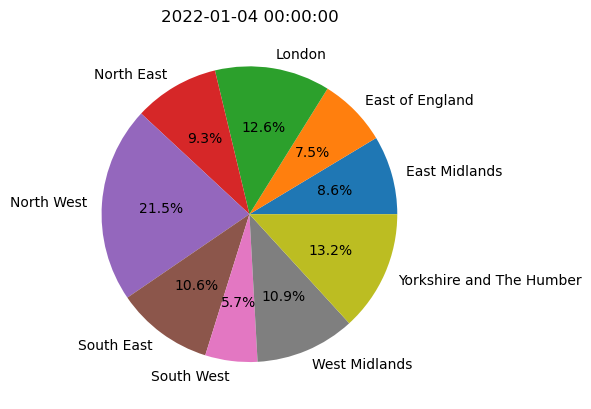

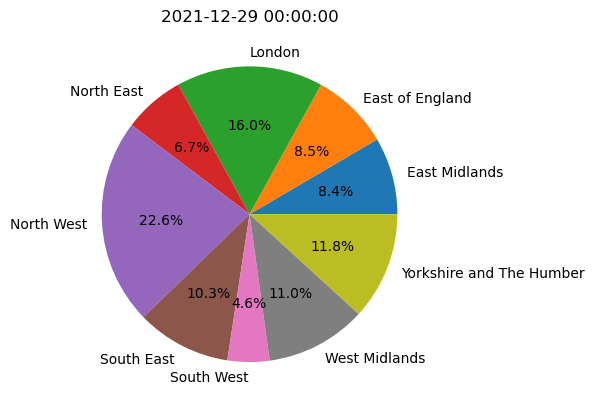

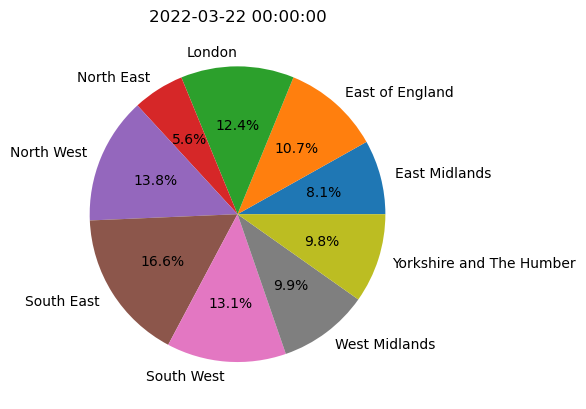

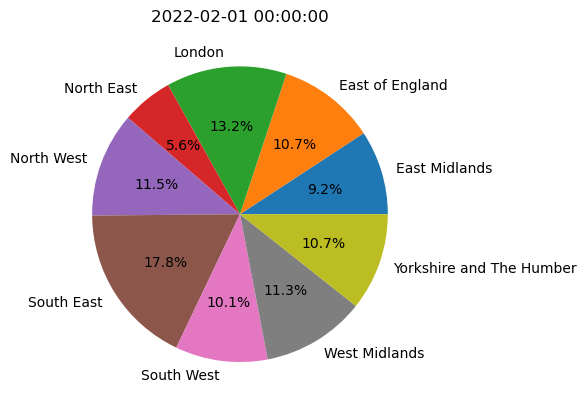

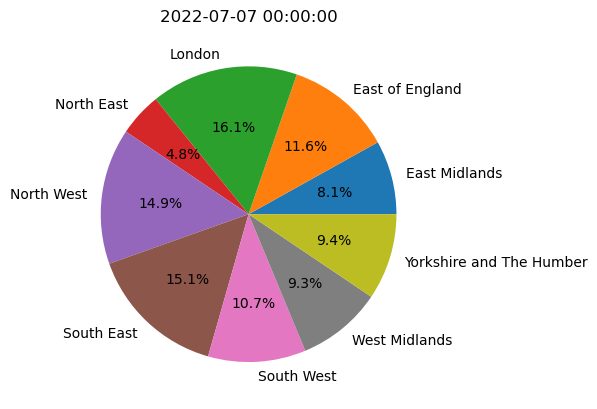

In [609]:
# Calculate the rolling mean of reinfection increase and add to a new column
reinfectionsRegion["Rolling Mean"] = reinfectionsRegion["New Reinfections"].rolling(7).mean()

# Group the data by month and find the peak number of reinfection increase for each month
maxReinfectionsPerMonth = reinfectionsRegion.groupby(reinfectionsRegion["Date"].dt.strftime("%Y-%m"))["New Reinfections"].max()

# Sort the values in descending order
maxReinfectionsPerMonth = maxReinfectionsPerMonth.sort_values(ascending=False)

# Get the five highest months
top5Months = maxReinfectionsPerMonth.head(5).index.tolist()

# Loop through each month
for month in top5Months:
    # Create a copy of the data for that month
    month2 = reinfectionsRegion[reinfectionsRegion["Date"].dt.strftime("%Y-%m") == month].copy()
    
    # Calculate the percentage increase in reinfections and add to a new column
    month2.loc[:, "Percentage Increase"] = month2["New Reinfections"] / month2["New Reinfections"].sum()
    
    # Find the peak date and add to a new column
    month2.loc[:, "Peak"] = (month2["Rolling Mean"].diff(1) > 0) & (month2["Rolling Mean"].diff(-1) > 0)
    
    # Get the peak date
    peakDate = month2[month2["Peak"]].sort_values("New Reinfections", ascending=False)["Date"].iloc[0]
    
    # Plot a pie chart for the percentage increase in reinfections on each peak date
    plt.pie(month2[month2["Date"] == peakDate]["Percentage Increase"], labels=month2[month2["Date"] == peakDate]["Region"], autopct="%1.1f%%")
    
    # Configure the layout of the plot
    plt.title(str(peakDate))
    
    # Show the plot
    plt.show()

#### Age Proportion of Reinfections

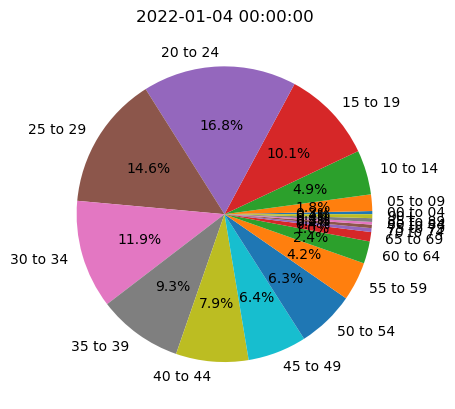

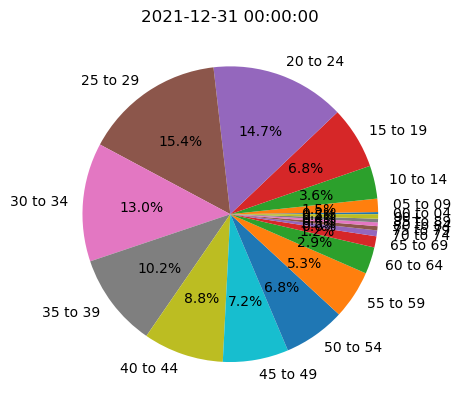

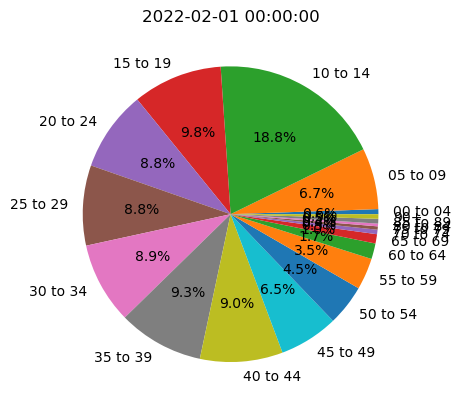

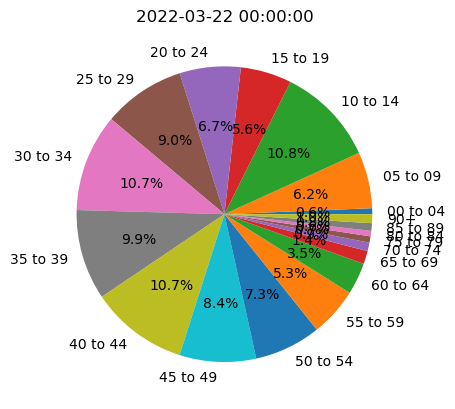

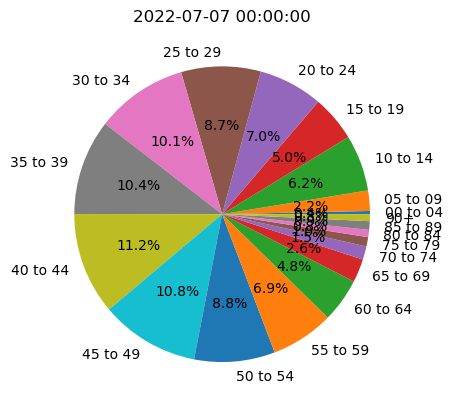

In [610]:
# Calculate the rolling mean of reinfection increase and add to a new column
reinfectionsAge["Rolling Mean"] = reinfectionsAge["New Reinfections"].rolling(7).mean()

# Group the data by month and find the peak number of reinfection increase for each month
maxReinfectionsPerMonth = reinfectionsAge.groupby(reinfectionsAge["Date"].dt.strftime("%Y-%m"))["New Reinfections"].max()

# Sort the values in descending order
maxReinfectionsPerMonth = maxReinfectionsPerMonth.sort_values(ascending=False)

# Get the five highest months
top5Months = maxReinfectionsPerMonth.head(5).index.tolist()

# Loop through each month
for month in top5Months:
    # Create a copy of the data for that month
    month2 = reinfectionsAge[reinfectionsAge["Date"].dt.strftime("%Y-%m") == month].copy()
    
    # Calculate the percentage increase in reinfections and add to a new column
    month2.loc[:, "Percentage Increase"] = month2["New Reinfections"] / month2["New Reinfections"].sum()
    
    # Find the peak date and add to a new column
    month2.loc[:, "Peak"] = (month2["Rolling Mean"].diff(1) > 0) & (month2["Rolling Mean"].diff(-1) > 0)
    
    # Get the peak date
    peakDate = month2[month2["Peak"]].sort_values("New Reinfections", ascending=False)["Date"].iloc[0]
    
    # Plot a pie chart for the percentage increase in reinfections on each peak date
    plt.pie(month2[month2["Date"] == peakDate]["Percentage Increase"], labels=month2[month2["Date"] == peakDate]["Age"], autopct="%1.1f%%")
    
    # Configure the layout of the plot
    plt.title(str(peakDate))
    
    # Show the plot
    plt.show()

### Variants Data Analysis

#### Remaking the cumulative columns

In [611]:
# Sort the DataFrame
variants1 = variants1.sort_values(["Region", "Variant", "Date"])

# Remake the columns as the cumulative sum of new doses
variants1["Sequenced"] = (variants1.groupby(["Region", "Variant"])["Sequenced"]
                                          .cumsum())

#### Variant Distribution

##### Grouping the cases by variant

In [612]:
# Group by region and date
casesVariantGroup = variants1.groupby(["Variant", "Date"]).sum()

# Reset index
casesVariant = casesVariantGroup.reset_index()

# Output DataFrame
casesVariant

C:\Users\chukl\AppData\Local\Temp\ipykernel_14668\1288944410.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  casesVariantGroup = variants1.groupby(["Variant", "Date"]).sum()


,Variant,Date,Sequenced,Percentage
0,Other,2021-02-14,233804.0,25.0
1,Other,2021-02-21,480939.0,23.0
2,Other,2021-02-28,739740.0,27.7
3,Other,2021-03-07,1011588.0,27.3
4,Other,2021-03-14,1296363.0,27.6
...,...,...,...,...
935,VOC-22JAN-01 (Omicron BA.2),2022-10-30,93916498.0,4.9
936,VOC-22JAN-01 (Omicron BA.2),2022-11-06,95383450.0,2.8
937,VOC-22JAN-01 (Omicron BA.2),2022-11-13,95958289.0,0.9
938,VOC-22JAN-01 (Omicron BA.2),2022-11-20,97221935.0,4.3


##### Adding an increase column

In [613]:
# Calculate increase in cases over time for each region and add to a new column
casesVariant['Sequenced Increase'] = casesVariant.groupby('Variant').Sequenced.diff().where(casesVariant['Variant'] == casesVariant['Variant'].shift(), 0).fillna(0)

# Output DataFrame
casesVariant

,Variant,Date,Sequenced,Percentage,Sequenced Increase
0,Other,2021-02-14,233804.0,25.0,0.0
1,Other,2021-02-21,480939.0,23.0,247135.0
2,Other,2021-02-28,739740.0,27.7,258801.0
3,Other,2021-03-07,1011588.0,27.3,271848.0
4,Other,2021-03-14,1296363.0,27.6,284775.0
...,...,...,...,...,...
935,VOC-22JAN-01 (Omicron BA.2),2022-10-30,93916498.0,4.9,1386910.0
936,VOC-22JAN-01 (Omicron BA.2),2022-11-06,95383450.0,2.8,1466952.0
937,VOC-22JAN-01 (Omicron BA.2),2022-11-13,95958289.0,0.9,574839.0
938,VOC-22JAN-01 (Omicron BA.2),2022-11-20,97221935.0,4.3,1263646.0


##### Plotting a comparison graph for the cases over time

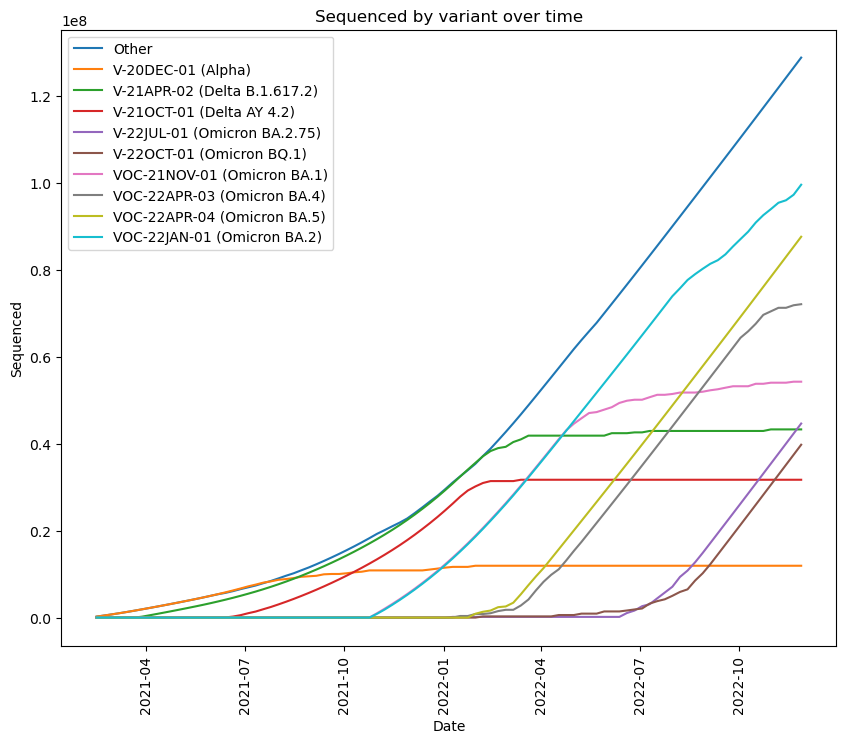

In [614]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for casesVariantName in casesVariant["Variant"].unique():
    # Filter for the current region
    casesVariantData = casesVariant[casesVariant["Variant"] == casesVariantName]
    
    # Plot the cases against date for the current region
    plt.plot(casesVariantData["Date"], casesVariantData["Sequenced"], label=casesVariantName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Sequenced")
plt.legend()
plt.xticks(rotation=90)
plt.title("Sequenced by variant over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the cases over time

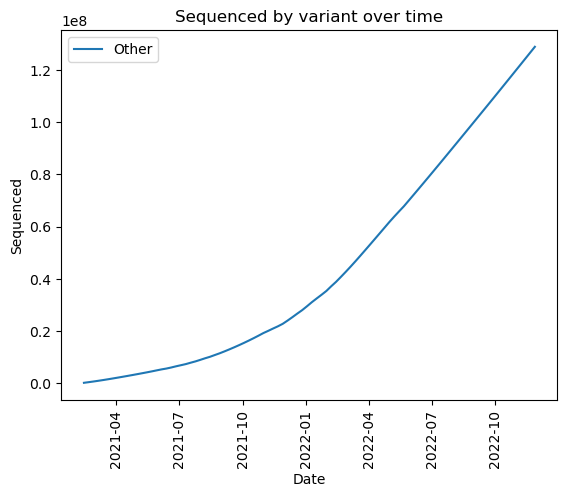

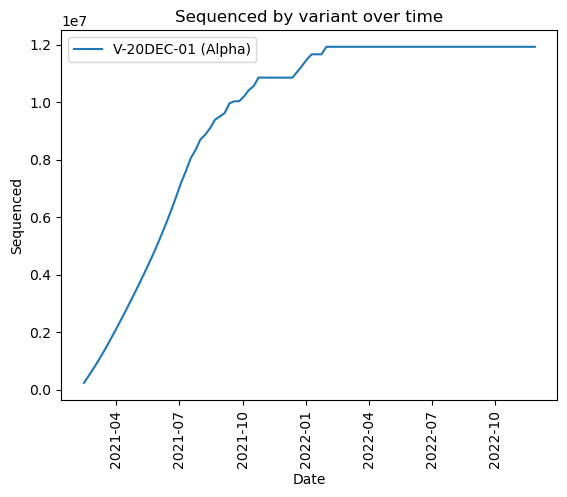

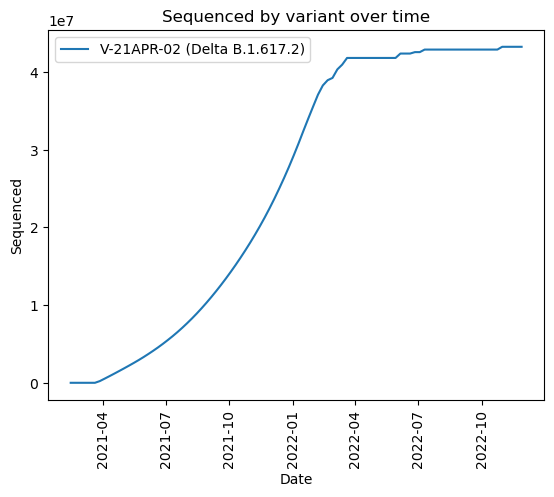

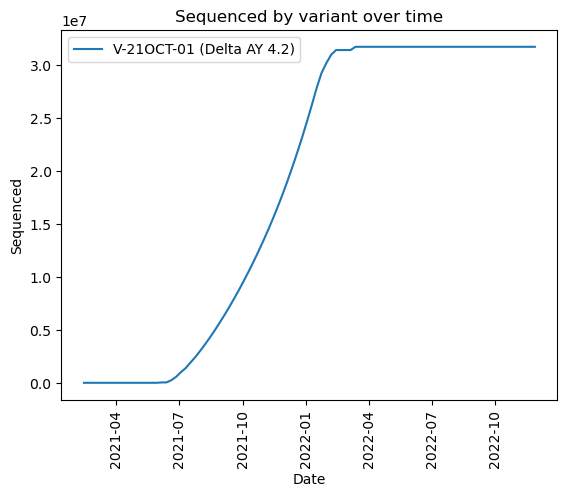

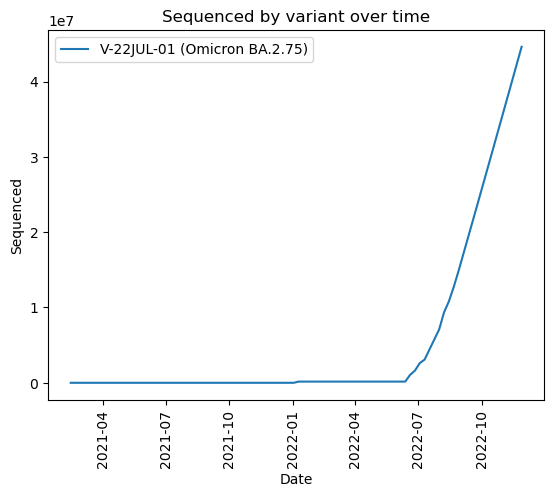

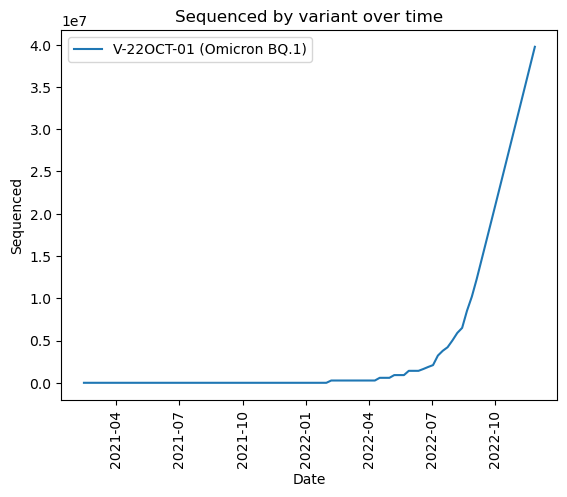

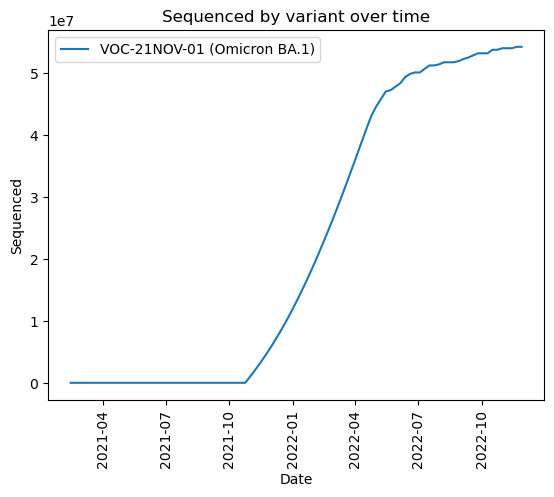

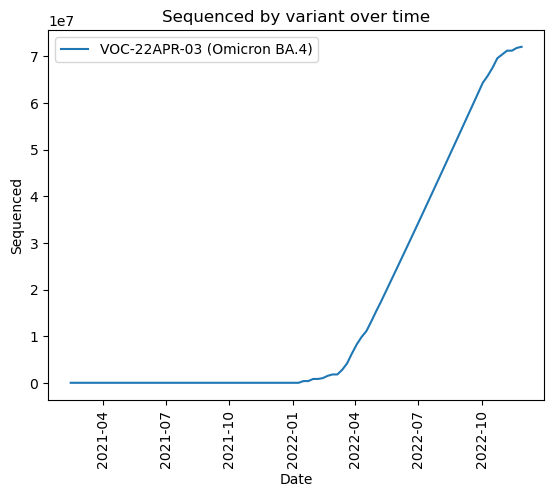

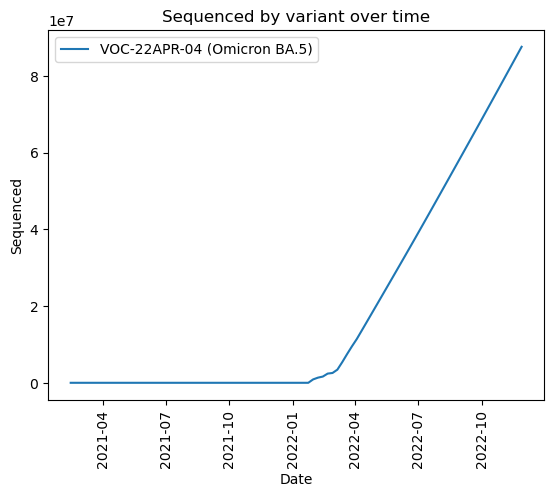

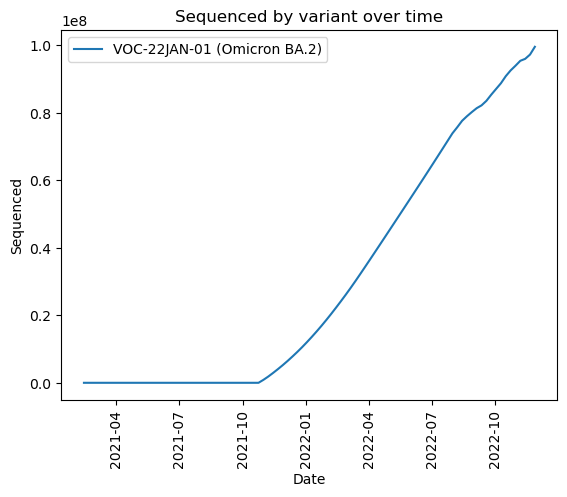

In [615]:
# Loop through each region
for casesVariantName in casesVariant["Variant"].unique():
    # Filter for the current region
    casesVariantData = casesVariant[casesVariant["Variant"] == casesVariantName]
    
    # Plot the cases against date for the current region
    plt.plot(casesVariantData["Date"], casesVariantData["Sequenced"], label=casesVariantName)

    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Sequenced")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Sequenced by variant over time")

    # Show the plot
    plt.show()

##### Plotting a comparison graph for the case increase over time

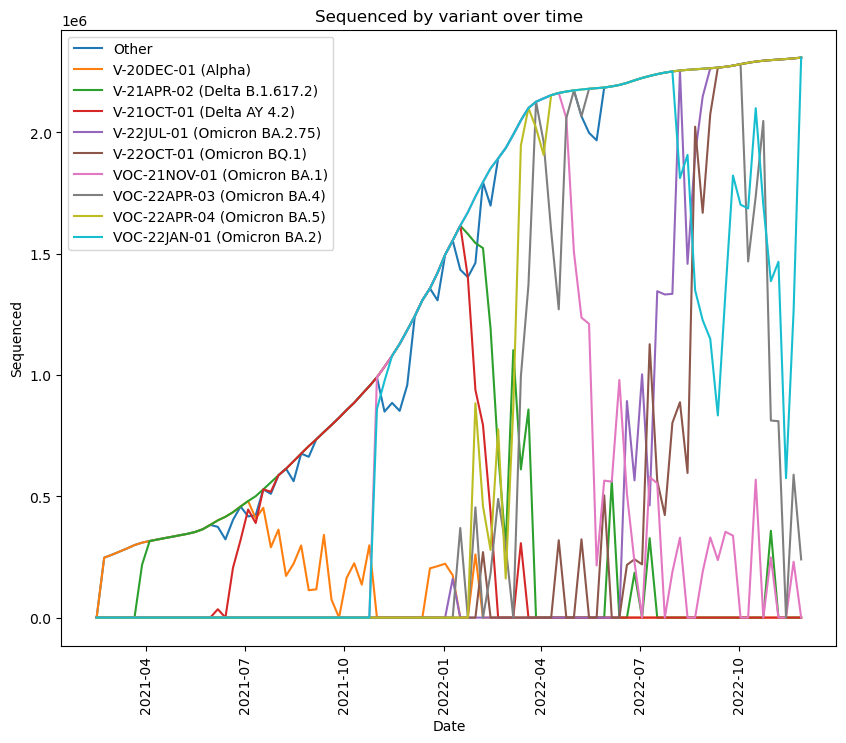

In [616]:
# Create a figure with size (10, 8)
plt.figure(figsize=(10,8))

# Loop through each region
for casesVariantName in casesVariant["Variant"].unique():
    # Filter for the current region
    casesVariantData = casesVariant[casesVariant["Variant"] == casesVariantName]
    
    # Plot the cases against date for the current region
    plt.plot(casesVariantData["Date"], casesVariantData["Sequenced Increase"], label=casesVariantName)

# Configure the layout of the plot
plt.xlabel("Date")
plt.ylabel("Sequenced")
plt.legend()
plt.xticks(rotation=90)
plt.title("Sequenced by variant over time")

# Show the plot
plt.show()

##### Plotting individual graphs for the case increase over time

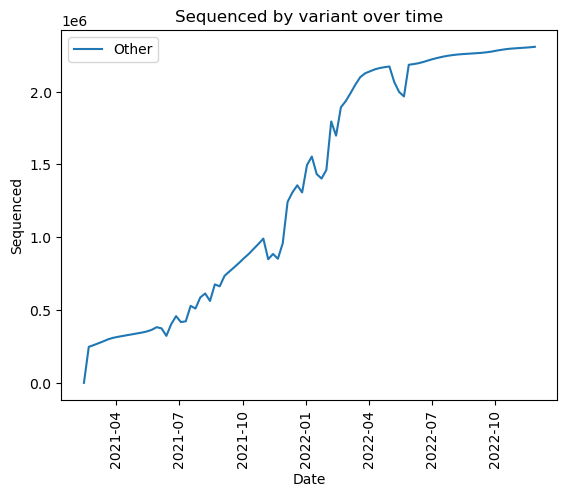

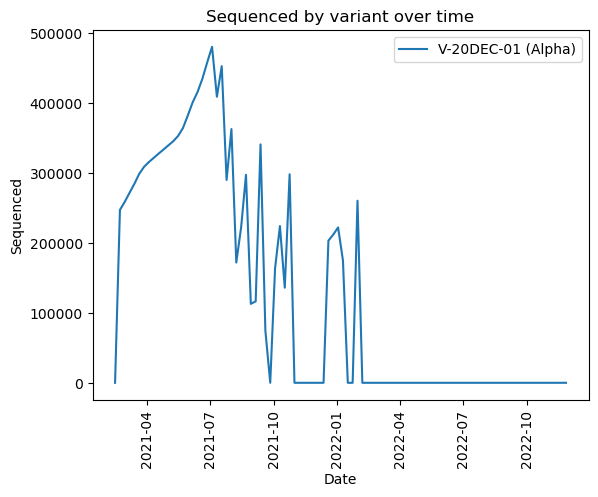

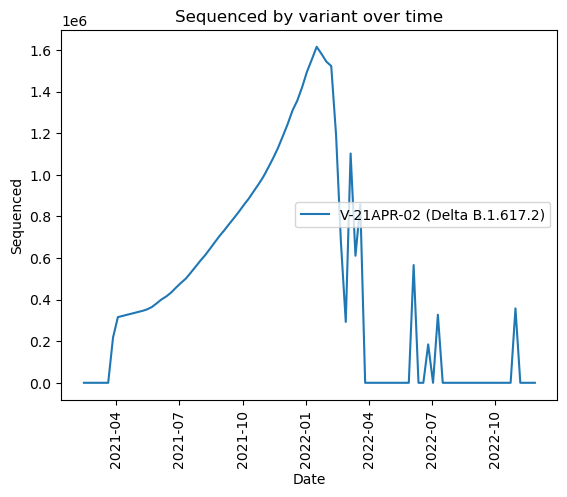

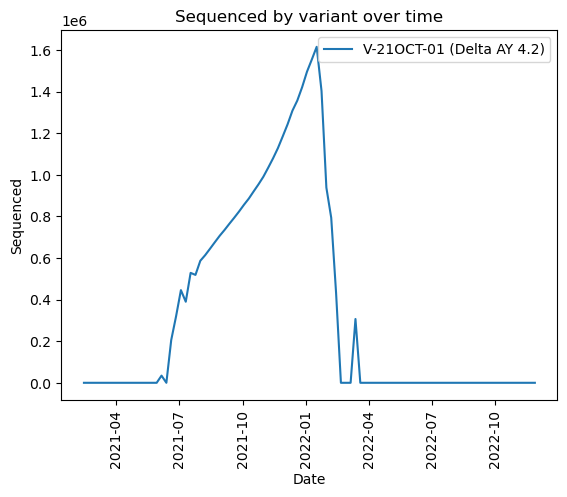

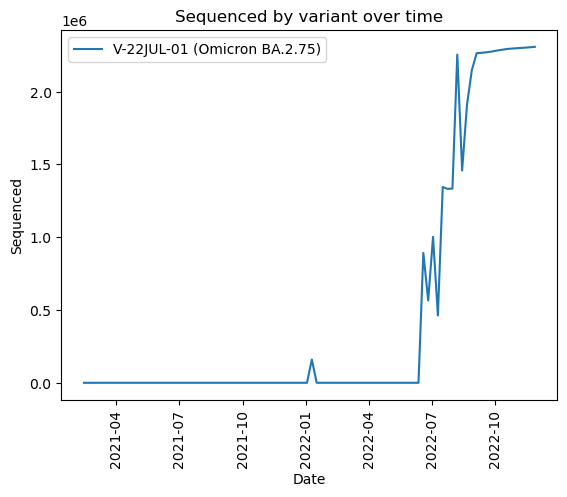

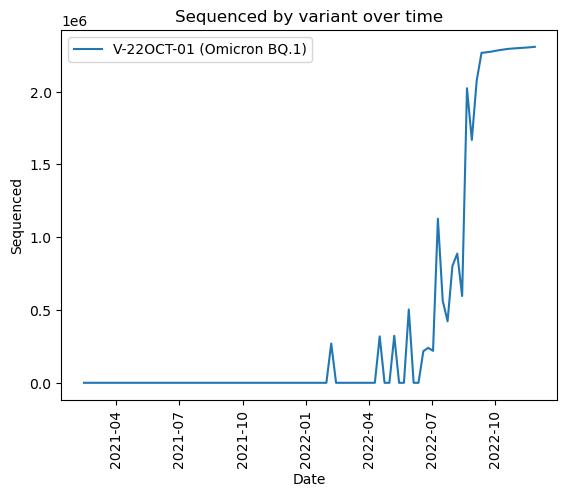

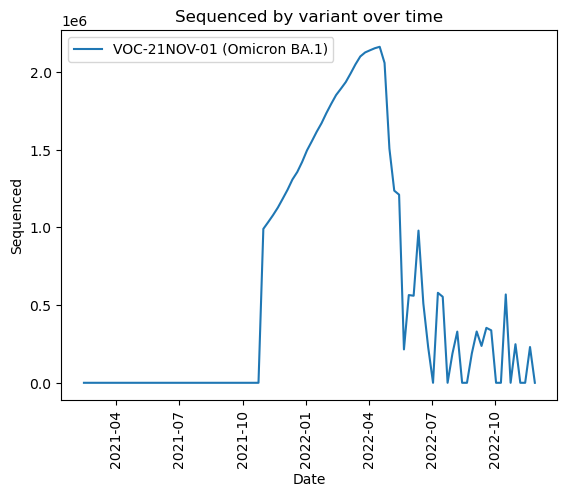

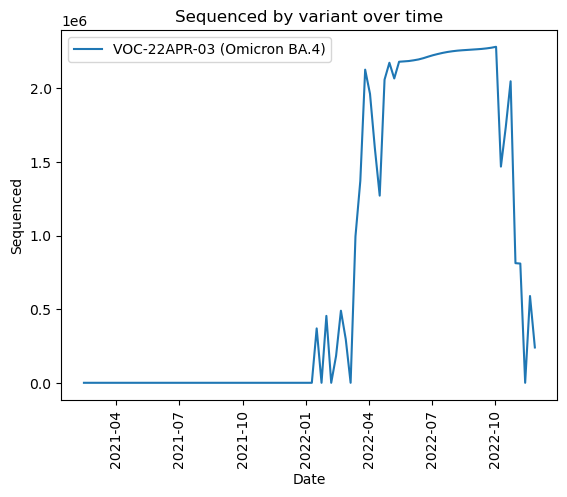

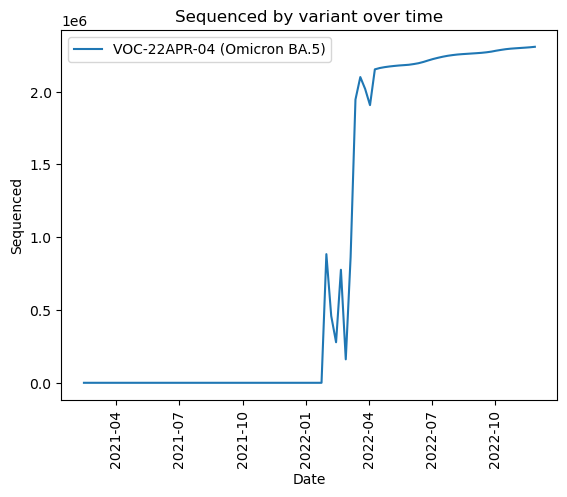

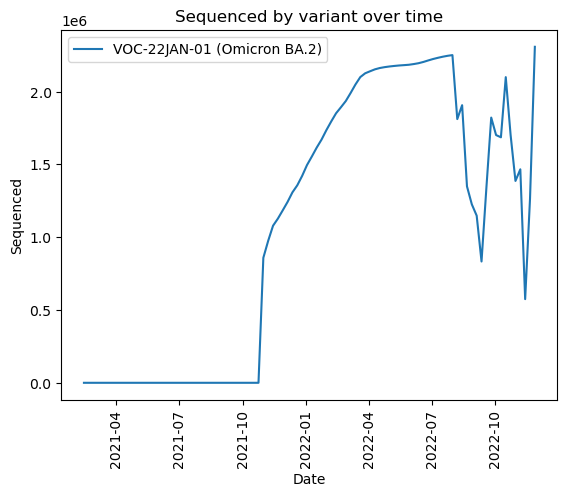

In [617]:
# Loop through each region
for casesVariantName in casesVariant["Variant"].unique():
    # Filter for the current region
    casesVariantData = casesVariant[casesVariant["Variant"] == casesVariantName]
    
    # Plot the cases against date for the current region
    plt.plot(casesVariantData["Date"], casesVariantData["Sequenced Increase"], label=casesVariantName)

    # Configure the layout of the plot
    plt.xlabel("Date")
    plt.ylabel("Sequenced")
    plt.legend()
    plt.xticks(rotation=90)
    plt.title("Sequenced by variant over time")

    # Show the plot
    plt.show()

#### Variant Proportion

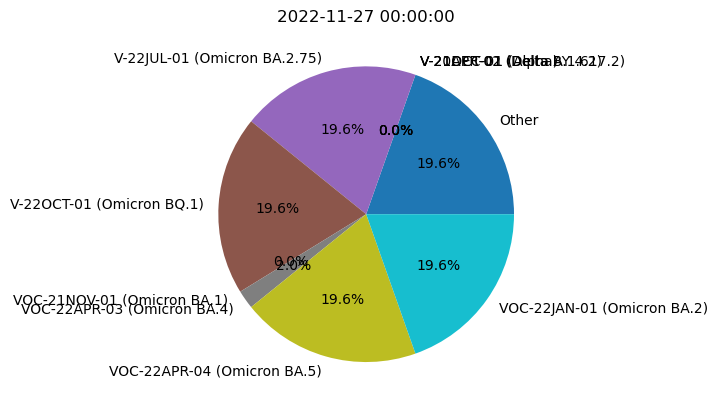

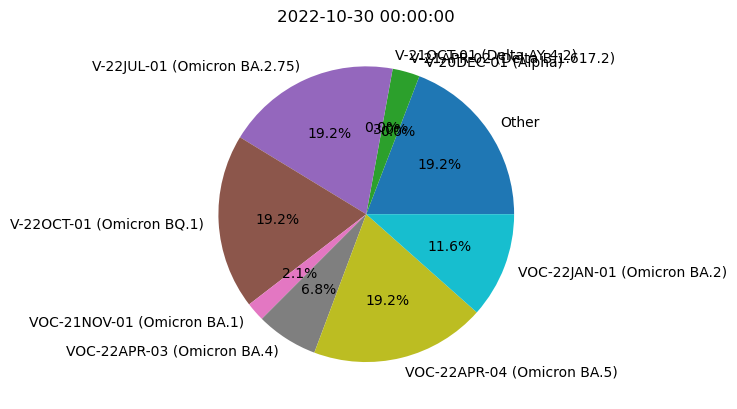

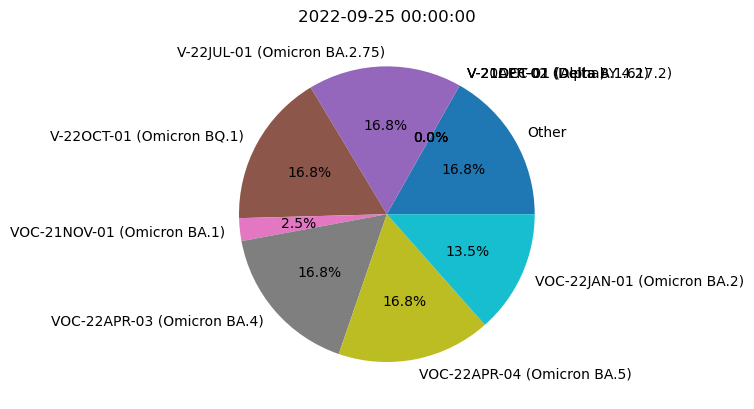

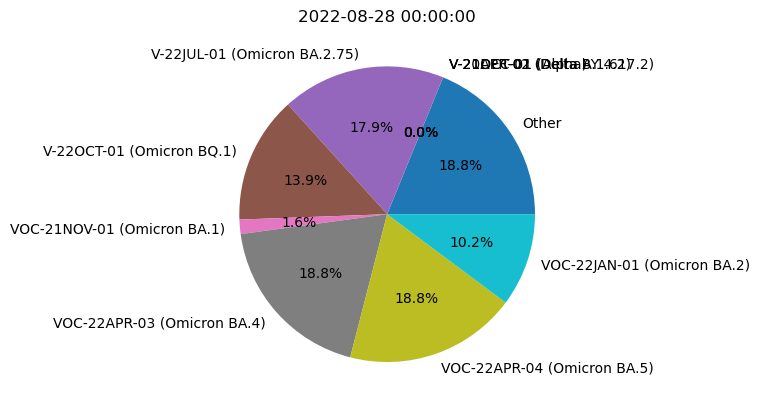

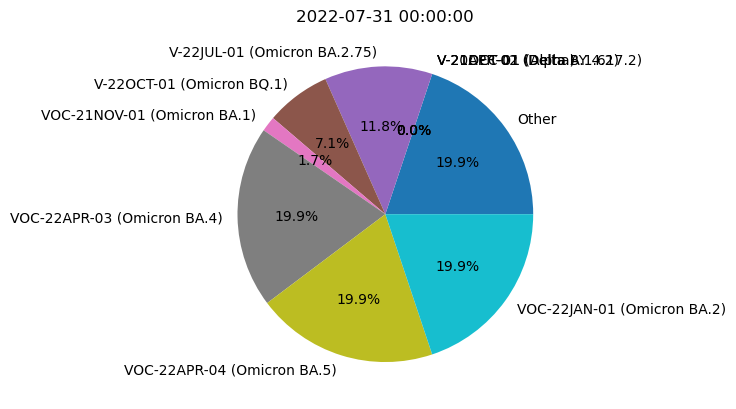

In [618]:
# Calculate the rolling mean of case increase and add to a new column
casesVariant["Rolling Mean"] = casesVariant["Sequenced Increase"].rolling(7).mean()

# Group the data by month and find the peak number of case increase for each month
maxCasesPerMonth = casesVariant.groupby(casesVariant["Date"].dt.strftime("%Y-%m"))["Sequenced Increase"].max()

# Sort the values in descending order
maxCasesPerMonth = maxCasesPerMonth.sort_values(ascending=False)

# Get the five highest months
top5Months = maxCasesPerMonth.head(5).index.tolist()

# Loop through each month
for month in top5Months:
    # Create a copy of the data for that month
    month2 = casesVariant[casesVariant["Date"].dt.strftime("%Y-%m") == month].copy()
    
    # Calculate the percentage increase in cases and add to a new column
    month2.loc[:, "Percentage Increase"] = month2["Sequenced Increase"] / month2["Sequenced Increase"].sum()
    
    # Find the peak date and add to a new column
    month2.loc[:, "Peak"] = (month2["Rolling Mean"].diff(1) > 0) & (month2["Rolling Mean"].diff(-1) > 0)
    
    # Get the peak date
    peakDate = month2[month2["Peak"]].sort_values("Sequenced Increase", ascending=False)["Date"].iloc[0]
    
    # Plot a pie chart for the percentage increase in cases on each peak date
    plt.pie(month2[month2["Date"] == peakDate]["Percentage Increase"], labels=month2[month2["Date"] == peakDate]["Variant"], autopct="%1.1f%%")
    
    # Configure the layout of the plot
    plt.title(str(peakDate))
    
    # Show the plot
    plt.show()

## Regression Model Analysis

### Model Evaluation

#### Collecting the evaluation results

In [619]:
# Read in a csv file to a pandas DataFrame
modelPrototypes = pd.read_csv("modelPrototypes.csv")

#### The Impact of Sex on COVID-19 Cases

In [620]:
# Select the rows applicable to this analysis series
sexImpactPrototypes = modelPrototypes.loc[modelPrototypes["Analysis Series"] == "Sex Impact"]

sexImpactPrototypes.loc[:, "Rank"] = 0
sexImpactPrototypes.loc[:, "Rank"] += sexImpactPrototypes.loc[:, "R2"].rank(ascending = False)
sexImpactPrototypes.loc[:, "Rank"] += sexImpactPrototypes.loc[:, "MSE"].rank()
sexImpactPrototypes.loc[:, "Rank"] += sexImpactPrototypes.loc[:, "MAE"].rank()
sexImpactPrototypes = sexImpactPrototypes.sort_values(by = "Rank", ascending = True)

# Output DataFrame
sexImpactPrototypes

C:\Users\chukl\AppData\Local\Temp\ipykernel_14668\288340995.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sexImpactPrototypes.loc[:, "Rank"] = 0
C:\Users\chukl\AppData\Local\Temp\ipykernel_14668\288340995.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sexImpactPrototypes.loc[:, "Rank"] += sexImpactPrototypes.loc[:, "R2"].rank(ascending = False)
C:\Users\chukl\AppData\Local\Temp\ipykernel_14668\288340995.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

,Analysis Series,Model Name,Type,R2,MSE,MAE,Rank
4,Sex Impact,COVID-RMA005,Linear Regression,0.13,1.926699e+08,11549.41,13.0
9,Sex Impact,COVID-RMA010,Ridge Regression,0.72,2.855684e+08,12504.66,15.0
16,Sex Impact,COVID-RMA017,Bayesian Ridge Regression,0.72,2.855589e+08,12505.42,16.0
6,Sex Impact,COVID-RMA007,Linear Regression,0.12,1.937811e+08,11590.38,16.0
8,Sex Impact,COVID-RMA009,Linear Regression,0.72,2.855445e+08,12507.01,16.0
11,Sex Impact,COVID-RMA012,Lasso Regression,0.72,2.855780e+08,12504.84,17.0
12,Sex Impact,COVID-RMA013,Lasso Regression,0.72,2.868749e+08,12517.37,21.0
5,Sex Impact,COVID-RMA006,Linear Regression,0.01,2.184687e+08,12099.62,22.5
7,Sex Impact,COVID-RMA008,Linear Regression,0.00,2.195196e+08,12140.02,26.5
17,Sex Impact,COVID-RMA018,Bayesian Ridge Regression,0.68,3.258105e+08,13647.62,27.0


#### The Impact of Variants on COVID-19 Cases

In [621]:
# Select the rows applicable to this analysis series
variantImpactPrototypes = modelPrototypes.loc[modelPrototypes["Analysis Series"] == "Variant Impact"].copy()

variantImpactPrototypes.loc[:, "Rank"] = 0
variantImpactPrototypes.loc[:, "Rank"] += variantImpactPrototypes.loc[:, "R2"].rank(ascending = False)
variantImpactPrototypes.loc[:, "Rank"] += variantImpactPrototypes.loc[:, "MSE"].rank()
variantImpactPrototypes.loc[:, "Rank"] += variantImpactPrototypes.loc[:, "MAE"].rank()

variantImpactPrototypes = variantImpactPrototypes.sort_values(by = "Rank", ascending = True)

# Output DataFrame
variantImpactPrototypes

C:\Users\chukl\AppData\Local\Temp\ipykernel_14668\2841113863.py:5: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  variantImpactPrototypes.loc[:, "Rank"] += variantImpactPrototypes.loc[:, "R2"].rank(ascending = False)


,Analysis Series,Model Name,Type,R2,MSE,MAE,Rank
24,Variant Impact,COVID-RMA025,Ridge Regression,0.99,2.636936e+05,399.20,4.0
25,Variant Impact,COVID-RMA026,Lasso Regression,0.99,2.638117e+05,399.36,7.0
26,Variant Impact,COVID-RMA027,Linear Regression,0.99,2.640566e+05,399.30,7.0
28,Variant Impact,COVID-RMA029,Ridge Regression,0.94,4.075737e+10,115685.50,15.0
29,Variant Impact,COVID-RMA030,Lasso Regression,0.94,4.076893e+10,115710.95,17.0
30,Variant Impact,COVID-RMA031,Linear Regression,0.94,4.076910e+10,115711.39,19.0
27,Variant Impact,COVID-RMA028,Bayesian Ridge Regression,0.22,2.552737e+07,4199.26,20.0
21,Variant Impact,COVID-RMA022,Ridge Regression,0.89,8.151449e+10,230971.80,26.0
31,Variant Impact,COVID-RMA032,Elastic Net Regression,0.63,8.006324e+10,146610.18,26.0
23,Variant Impact,COVID-RMA024,Lasso Regression,0.89,8.153759e+10,231022.54,28.0


#### The Impact of Vaccinations on COVID-19 Cases

In [622]:
# Select the rows applicable to this analysis series
vaccineImpactPrototypes = modelPrototypes.loc[modelPrototypes["Analysis Series"] == "Vaccine Impact"].copy()

vaccineImpactPrototypes.loc[:, "Rank"] = 0
vaccineImpactPrototypes.loc[:, "Rank"] += vaccineImpactPrototypes.loc[:, "R2"].rank(ascending = False)
vaccineImpactPrototypes.loc[:, "Rank"] += vaccineImpactPrototypes.loc[:, "MSE"].rank()
vaccineImpactPrototypes.loc[:, "Rank"] += vaccineImpactPrototypes.loc[:, "MAE"].rank()

vaccineImpactPrototypes = vaccineImpactPrototypes.sort_values(by = "Rank", ascending = True)

# Output DataFrame
vaccineImpactPrototypes

,Analysis Series,Model Name,Type,R2,MSE,MAE,Rank
37,Vaccine Impact,COVID-RMA038,Ridge Regression,0.96,1.497240e+06,749.63,7.5
38,Vaccine Impact,COVID-RMA039,Lasso Regression,0.96,1.496989e+06,751.33,7.5
39,Vaccine Impact,COVID-RMA040,Linear Regression,0.96,1.497265e+06,749.52,7.5
40,Vaccine Impact,COVID-RMA041,Bayesian Ridge Regression,0.96,1.497263e+06,749.53,7.5
42,Vaccine Impact,COVID-RMA043,Ridge Regression,0.93,3.825171e+10,109251.09,18.0
43,Vaccine Impact,COVID-RMA044,Lasso Regression,0.93,3.825191e+10,109252.91,21.0
44,Vaccine Impact,COVID-RMA045,Linear Regression,0.93,3.825195e+10,109252.39,21.0
41,Vaccine Impact,COVID-RMA042,Elastic Net Regression,0.52,1.680340e+07,3363.21,24.0
32,Vaccine Impact,COVID-RMA033,Ridge Regression,0.90,7.650192e+10,217752.55,28.5
35,Vaccine Impact,COVID-RMA036,Bayesian Ridge Regression,0.90,7.650205e+10,217753.25,30.5


### Data Analysis Functions

#### OneHotEncoder Functions

In [623]:
encoder = OneHotEncoder(categories = "auto", sparse = False)

### The Impact of Sex on COVID-19 Cases

#### Creating a new DataFrame for the male data.

In [624]:
maleCases4 = maleCases1.assign(Sex = "Male")
maleCases4

,Region Code,Region,Date,Age,Rate,Cases,Sex
0,E12000001,North East,2022-12-21,50 to 54,35905.1,31902,Male
1,E12000001,North East,2022-12-21,25 to 29,40561.1,37313,Male
2,E12000001,North East,2022-12-21,70 to 74,20208.2,14266,Male
3,E12000001,North East,2022-12-21,35 to 39,44401.5,35055,Male
4,E12000001,North East,2022-12-21,30 to 34,43718.0,37350,Male
...,...,...,...,...,...,...,...
176049,E12000009,South West,2020-02-03,45 to 49,0.6,1,Male
176050,E12000009,South West,2020-02-03,40 to 44,0.0,0,Male
176051,E12000009,South West,2020-02-03,50 to 54,0.0,0,Male
176052,E12000009,South West,2020-02-03,25 to 29,0.0,0,Male


In [625]:
femaleCases4 = femaleCases1.assign(Sex = "Female")
femaleCases4

,Region Code,Region,Date,Age,Rate,Cases,Sex
0,E12000001,North East,2022-12-21,60 to 64,32205.5,28535,Female
1,E12000001,North East,2022-12-21,80 to 84,19641.2,8298,Female
2,E12000001,North East,2022-12-21,70 to 74,18422.4,14169,Female
3,E12000001,North East,2022-12-21,65 to 69,23082.1,17749,Female
4,E12000001,North East,2022-12-21,40 to 44,60056.6,45434,Female
...,...,...,...,...,...,...,...
176049,E12000009,South West,2020-02-03,15 to 19,0.7,1,Female
176050,E12000009,South West,2020-02-03,45 to 49,0.0,0,Female
176051,E12000009,South West,2020-02-03,50 to 54,0.5,1,Female
176052,E12000009,South West,2020-02-03,75 to 79,0.0,0,Female


#### Combining the DataFrames

In [626]:
sexImpact = pd.concat([maleCases4, femaleCases4]).reset_index(drop=True)
sexImpact

,Region Code,Region,Date,Age,Rate,Cases,Sex
0,E12000001,North East,2022-12-21,50 to 54,35905.1,31902,Male
1,E12000001,North East,2022-12-21,25 to 29,40561.1,37313,Male
2,E12000001,North East,2022-12-21,70 to 74,20208.2,14266,Male
3,E12000001,North East,2022-12-21,35 to 39,44401.5,35055,Male
4,E12000001,North East,2022-12-21,30 to 34,43718.0,37350,Male
...,...,...,...,...,...,...,...
352103,E12000009,South West,2020-02-03,15 to 19,0.7,1,Female
352104,E12000009,South West,2020-02-03,45 to 49,0.0,0,Female
352105,E12000009,South West,2020-02-03,50 to 54,0.5,1,Female
352106,E12000009,South West,2020-02-03,75 to 79,0.0,0,Female


#### Adding a column to account for the days passed since day 0

In [627]:
firstDate = sexImpact["Date"].min()

sexImpact["Days"] = (sexImpact["Date"] - firstDate).dt.days

#### Creating a new DataFrame with just the necessary columns

In [628]:
sexImpact1 = sexImpact[["Sex", "Region", "Age", "Days", "Cases"]].copy()

#sexImpact1 = sexImpact1.sample(frac = 0.01)

#### Encoding the categorical columns in binary

In [629]:
X = sexImpact1[["Sex", "Region", "Age", "Days"]].values
y = sexImpact1["Cases"].values

catCols = [0, 1, 2]

encodeX = encoder.fit_transform(X[:, catCols])
X = np.concatenate([encodeX, X[:, 3:]], axis = 1)

#### Taking a sample of the data

#### Split the data into training and testing sets

In [630]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = randomSeed)

#### Creating the linear regression model

In [631]:
model1 = LinearRegression()

#### Fitting the model to the data

In [632]:
model1.fit(X_train, y_train)

LinearRegression()

In [633]:
# Get the coefficients of the model
coefficients = model1.coef_

# If coefficients has only one column, reshape it to a 2D array
if coefficients.ndim == 1:
    coefficients = coefficients.reshape(1, -1)

# Get the names of the encoded categorical variables
encodedCatNames = encoder.get_feature_names_out(["Sex", "Region", "Age"])

# Concatenate the names of the encoded categorical variables with the numerical column names
columnNames = np.concatenate([encodedCatNames, ["Days"]])

# Create a dataframe with the variable names and their coefficients
sexImpactCoefficient = pd.DataFrame({'Variable': columnNames})

for i, coefficient in enumerate(coefficients):
    coefficientName = "Coefficient " + str(i + 1)
    sexImpactCoefficient[coefficientName] = coefficient

# Replace underscores with colons in the variable names
sexImpactCoefficient["Variable"] = sexImpactCoefficient["Variable"].str.replace("_", ": ")

#### Printing the coefficients

In [634]:
#print('Coefficients: ', model1.coef_)
sexImpactCoefficient

,Variable,Coefficient 1
0,Sex: Female,2.678579e+06
1,Sex: Male,2.674802e+06
2,Region: East Midlands,2.571221e+12
3,Region: East of England,2.571221e+12
4,Region: London,2.571221e+12
5,Region: North East,2.571221e+12
6,Region: North West,2.571221e+12
7,Region: South East,2.571221e+12
8,Region: South West,2.571221e+12
9,Region: West Midlands,2.571221e+12


#### Evaluating the model

In [635]:
score = model1.score(X_test, y_test)
print(f'R-squared score: {score:.2f}')

R-squared score: 0.68


In [636]:
y_pred = model1.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

# Print the MSE and MAE
print(f'MSE: {mse:.2f}')
print(f'RMSE: {rmse:.2f}')
print(f'MAE: {mae:.2f}')
print(f'MAPE: {mape:.2f}')

MSE: 325810547.88
RMSE: 18050.22
MAE: 13647.85
MAPE: 755505726079328256.00


### The Impact of Variants on COVID-19 Cases and Deaths

#### Creating a combined DataFrame from the Variants, Cases, and Deaths DataFrames

In [637]:
# Join variants1 and generalCases1 on the common columns
variantImpact = pd.merge(variants1, generalCases1, on=['Region Code', 'Region', 'Date'])

# Join the result above and generalDeaths1 on the common columns
variantImpact = pd.merge(variantImpact, generalDeaths1, on=['Region Code', 'Region', 'Date'])

# Select the columns you need
variantImpact = variantImpact[['Region Code', 'Region', 'Date', 'Variant', 'Sequenced', 'Percentage', 'Cases', 'Deaths']]

variantImpact

,Region Code,Region,Date,Variant,Sequenced,Percentage,Cases,Deaths
0,E12000004,East Midlands,2021-02-14,Other,14152.0,3.0,291146,10783
1,E12000004,East Midlands,2021-02-14,V-20DEC-01 (Alpha),14152.0,97.0,291146,10783
2,E12000004,East Midlands,2021-02-14,V-21APR-02 (Delta B.1.617.2),0.0,0.0,291146,10783
3,E12000004,East Midlands,2021-02-14,V-21OCT-01 (Delta AY 4.2),0.0,0.0,291146,10783
4,E12000004,East Midlands,2021-02-14,V-22JUL-01 (Omicron BA.2.75),0.0,0.0,291146,10783
...,...,...,...,...,...,...,...,...
8455,E12000003,Yorkshire and The Humber,2022-11-27,V-22OCT-01 (Omicron BQ.1),3824200.0,75.3,1953079,18497
8456,E12000003,Yorkshire and The Humber,2022-11-27,VOC-21NOV-01 (Omicron BA.1),5448312.0,0.0,1953079,18497
8457,E12000003,Yorkshire and The Humber,2022-11-27,VOC-22APR-03 (Omicron BA.4),6989370.0,0.0,1953079,18497
8458,E12000003,Yorkshire and The Humber,2022-11-27,VOC-22APR-04 (Omicron BA.5),9053745.0,15.8,1953079,18497


#### Adding a column to account for the days passed since day 0

In [638]:
firstDate = variantImpact["Date"].min()

variantImpact["Days"] = (variantImpact["Date"] - firstDate).dt.days

#### Creating a new DataFrame with just the necessary columns

In [639]:
variantImpact1 = variantImpact[["Variant", "Region", "Sequenced", "Days", "Cases", "Deaths"]].copy()

#variantImpact1 = variantImpact1.sample(frac = 0.01)

#### Encoding the categorical columns in binary

In [640]:
X = variantImpact1[["Variant", "Region", "Sequenced", "Days"]].values
y = variantImpact1[["Cases", "Deaths"]].values

catCols = [0, 1]

encodeX = encoder.fit_transform(X[:, catCols])
X = np.concatenate([encodeX, X[:, 2:]], axis = 1)

#### Taking a sample of the data

#### Split the data into training and testing sets

In [641]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = randomSeed)

#### Creating the linear regression model

In [642]:
model2 = ElasticNet()

#### Fitting the model to the data

In [643]:
model2.fit(X_train, y_train)

ElasticNet()

In [644]:
# Get the coefficients of the model
coefficients = model2.coef_

# If coefficients has only one column, reshape it to a 2D array
if coefficients.ndim == 1:
    coefficients = coefficients.reshape(1, -1)

# Get the names of the encoded categorical variables
encodedCatNames = encoder.get_feature_names_out(["Variant", "Region"])

# Concatenate the names of the encoded categorical variables with the numerical column names
columnNames = np.concatenate([encodedCatNames, ["Sequenced", "Days"]])

# Create a dataframe with the variable names and their coefficients
variantImpactCoefficient = pd.DataFrame({'Variable': columnNames})

for i, coefficient in enumerate(coefficients):
    coefficientName = "Coefficient " + str(i + 1)
    variantImpactCoefficient[coefficientName] = coefficient

# Replace underscores with colons in the variable names
variantImpactCoefficient["Variable"] = variantImpactCoefficient["Variable"].str.replace("_", ": ")

#### Printing the coefficients

In [645]:
#print('Coefficients: ', model1.coef_)
variantImpactCoefficient

,Variable,Coefficient 1,Coefficient 2
0,Variant: Other,-33891.652962,-298.005068
1,Variant: V-20DEC-01 (Alpha),12464.608463,107.329252
2,Variant: V-21APR-02 (Delta B.1.617.2),-7206.067988,-62.381832
3,Variant: V-21OCT-01 (Delta AY 4.2),534.851717,-3.535006
4,Variant: V-22JUL-01 (Omicron BA.2.75),18424.177994,175.036070
5,Variant: V-22OCT-01 (Omicron BQ.1),21643.316285,177.302379
6,Variant: VOC-21NOV-01 (Omicron BA.1),-5447.067627,-38.792826
7,Variant: VOC-22APR-03 (Omicron BA.4),5504.819627,37.130086
8,Variant: VOC-22APR-04 (Omicron BA.5),1961.269447,25.723968
9,Variant: VOC-22JAN-01 (Omicron BA.2),-13990.254955,-119.807022


#### Evaluating the model

In [646]:
score = model2.score(X_test, y_test)
print(f'R-squared score: {score:.2f}')

R-squared score: 0.63


In [647]:
y_pred = model2.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

# Print the MSE and MAE
print(f'MSE: {mse:.2f}')
print(f'RMSE: {rmse:.2f}')
print(f'MAE: {mae:.2f}')
print(f'MAPE: {mape:.2f}')

MSE: 80063235873.42
RMSE: 282954.48
MAE: 146610.18
MAPE: 0.27


### The Impact of Vaccinations on COVID-19 Cases and Deaths

#### Creating a combined DataFrame from the Vaccinations, Cases, and Deaths DataFrames

In [648]:
# Join vaccinations1 and generalCases1 on the common columns
vaccineImpact = pd.merge(vaccinations1, generalCases1, on=["Region Code", "Region", "Date"])

# Join the result above and generalDeaths1 on the common columns
vaccineImpact = pd.merge(vaccineImpact, generalDeaths1, on=["Region Code", "Region", "Date"])

# Select the columns you need
vaccineImpact = vaccineImpact[["Region Code", "Region", "Date", "Age", "Total People Received First Dose", "Total People Received Second Dose", "Total People Received Third Dose", "Cases", "Deaths"]]

vaccineImpact

,Region Code,Region,Date,Age,Total People Received First Dose,Total People Received Second Dose,Total People Received Third Dose,Cases,Deaths
0,E12000004,East Midlands,2020-08-12,05 to 11,0,0,0,24479,4011
1,E12000004,East Midlands,2020-08-12,12 to 15,0,0,0,24479,4011
2,E12000004,East Midlands,2020-08-12,16 to 17,0,0,0,24479,4011
3,E12000004,East Midlands,2020-08-12,18 to 24,9,0,0,24479,4011
4,E12000004,East Midlands,2020-08-12,25 to 29,48,0,0,24479,4011
...,...,...,...,...,...,...,...,...,...
117445,E12000003,Yorkshire and The Humber,2022-12-02,70 to 74,259493,258005,250968,1955035,18512
117446,E12000003,Yorkshire and The Humber,2022-12-02,75 to 79,229696,228737,224535,1955035,18512
117447,E12000003,Yorkshire and The Humber,2022-12-02,80 to 84,141377,140843,138290,1955035,18512
117448,E12000003,Yorkshire and The Humber,2022-12-02,85 to 89,88647,88314,86611,1955035,18512


#### Adding a column to account for the days passed since day 0

In [649]:
firstDate = vaccineImpact["Date"].min()

vaccineImpact["Days"] = (vaccineImpact["Date"] - firstDate).dt.days

#### Creating a new DataFrame with just the necessary columns

In [650]:
vaccineImpact1 = vaccineImpact[["Region", "Total People Received First Dose", "Total People Received Second Dose", "Total People Received Third Dose", "Days", "Cases", "Deaths"]].copy()

#variantImpact1 = variantImpact1.sample(frac = 0.01)

#### Encoding the categorical columns in binary

In [666]:
X = vaccineImpact1[["Region", "Total People Received First Dose", "Total People Received Second Dose", "Total People Received Third Dose", "Days"]].values
y = vaccineImpact1[["Cases", "Deaths"]].values

catCols = [0]

encodeX = encoder.fit_transform(X[:, catCols])
X = np.concatenate([encodeX, X[:, 1:]], axis = 1)

#### Split the data into training and testing sets

In [667]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = randomSeed)

#### Creating the linear regression model

In [668]:
model3 = LinearRegression()

#### Fitting the model to the data

In [669]:
model3.fit(X_train, y_train)

LinearRegression()

In [670]:
# Get the coefficients of the model
coefficients = model3.coef_

# If coefficients has only one column, reshape it to a 2D array
if coefficients.ndim == 1:
    coefficients = coefficients.reshape(1, -1)

# Get the names of the encoded categorical variables
encodedCatNames = encoder.get_feature_names_out(["Region"])

# Concatenate the names of the encoded categorical variables with the numerical column names
columnNames = np.concatenate([encodedCatNames, ["Total People Received First Dose", "Total People Received Second Dose", "Total People Received Third Dose", "Days"]])

# Create a DataFrame with the variable names and their coefficients
vaccineImpactCoefficient = pd.DataFrame({'Variable': columnNames})

# Add the coefficients as columns to the DataFrame
for i, coefficient in enumerate(coefficients):
    coefficientName = "Coefficient " + str(i + 1)
    vaccineImpactCoefficient[coefficientName] = coefficient

# Replace underscores with colons in the variable names
vaccineImpactCoefficient["Variable"] = vaccineImpactCoefficient["Variable"].str.replace("_", ": ")

#### Printing the coefficients

In [671]:
#print('Coefficients: ', model3.coef_)
vaccineImpactCoefficient

,Variable,Coefficient 1,Coefficient 2
0,Region: East Midlands,-270476.684761,-2959.585260
1,Region: East of England,-49487.973664,300.470761
2,Region: London,562386.747584,4504.431747
3,Region: North East,-637830.160651,-8095.737246
4,Region: North West,364964.607649,6772.362749
5,Region: South East,480857.971986,6338.312145
6,Region: South West,-267576.604305,-6612.534460
7,Region: West Midlands,-63841.074722,1136.213918
8,Region: Yorkshire and The Humber,-118996.829151,-1383.934356
9,Total People Received First Dose,0.026434,0.008276


#### Evaluating the model

In [672]:
score = model3.score(X_test, y_test)
print(f'R-squared score: {score:.2f}')

R-squared score: 0.93


In [673]:
y_pred = model3.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

# Print the MSE and MAE
print(f'MSE: {mse:.2f}')
print(f'RMSE: {rmse:.2f}')
print(f'MAE: {mae:.2f}')
print(f'MAPE: {mape:.2f}')

MSE: 38251951151.29
RMSE: 195581.06
MAE: 109252.39
MAPE: 0.23


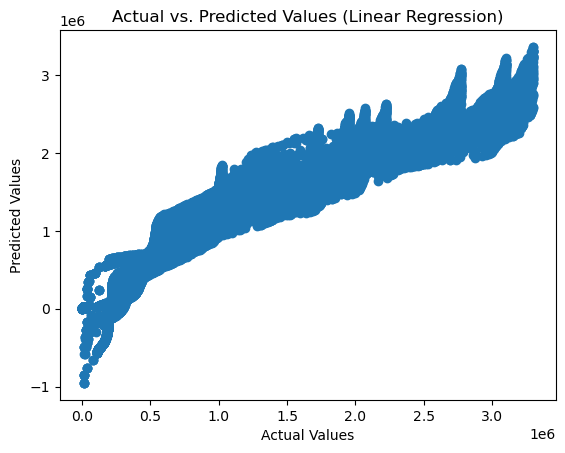

In [674]:
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values (Linear Regression)')
plt.show()
